# Descrizione del Dataset e preparazione del dataset

Usiamo il dataset LibriSpeech che è uno dei maggiormente utilizzati. Il seguente dataset si divide in diversi subset basati sulla qualità e scopo.
Opzioni disponibili:
Training Sets
  - train-clean-100 → 100 hours of high-quality speech.
  - train-clean-360 → 360 hours of high-quality speech.
  - train-other-500 → 500 hours of more challenging speech.
Validation (Development) Sets
  - dev-clean → 5 hours of clean speech for validation.
  - dev-other → 5 hours of more challenging speech for validation.
Test Sets
  - test-clean → 5 hours of clean speech for testing.
  - test-other → 5 hours of more challenging speech for testing.


In [1]:
import torchaudio

train = torchaudio.datasets.LIBRISPEECH(root="./", url="train-clean-100", download=True)
val = torchaudio.datasets.LIBRISPEECH(root="./", url="dev-clean", download=True)
test = torchaudio.datasets.LIBRISPEECH(root="./", url="test-clean", download=True)

100%|██████████| 5.95G/5.95G [07:15<00:00, 14.7MB/s]
100%|██████████| 322M/322M [00:26<00:00, 12.9MB/s]
100%|██████████| 331M/331M [00:27<00:00, 12.7MB/s]


Al termine verrà scaricato il dataset e scaricato nella directory principale nel seguente ordine:
- LibriSpeech
- Dataset come train-clean-100 o dev-clean o test-clean
- Speaker ID

```
LibriSpeech/
 ├── train-clean-100/
 │   ├── 19 (Speaker ID)
 │   │   ├── 19-198 (Chapter ID)
 │   │   │   ├── 19-198-0000.flac (Audio File)
 │   │   │   ├── 19-198-0001.flac
 │   │   │   ├── 19-198-0002.flac

```



In [ ]:
import os

def get_speaker_labels(root_dir):
    speaker_files = []
    labels = []
    count_speakers = 0

    for speaker_id in os.listdir(root_dir):  # ogni cartella è l'ID di uno speaker
        speaker_path = os.path.join(root_dir, speaker_id)
        count_speakers += 1
        if os.path.isdir(speaker_path):
            for chapter in os.listdir(speaker_path): # ogni sotto cartella è l'ID di un capitolo che leggono
                chapter_path = os.path.join(speaker_path, chapter)

                if os.path.isdir(chapter_path):
                    for file in os.listdir(chapter_path):
                        if file.endswith(".flac"):  # LibriSpeech use il formato FLAC
                            file_path = os.path.join(chapter_path, file)
                            speaker_files.append(file_path)
                            labels.append(speaker_id)  # Speaker label
    print(f"Number of speakers: {count_speakers}")
    return speaker_files, labels

In [3]:
train_root = "./LibriSpeech/train-clean-100"
val_root = "./LibriSpeech/dev-clean"
test_root = "./LibriSpeech/test-clean"

train_audio_files, train_speaker_labels = get_speaker_labels(train_root)
val_audio_files, val_speaker_labels = get_speaker_labels(val_root)
test_audio_files, test_speaker_labels = get_speaker_labels(test_root)

print(f"Number of training samples: {len(train_audio_files)}")
print(f"Number of validation samples: {len(val_audio_files)}")
print(f"Number of testing samples: {len(test_audio_files)}")

Number of speakers: 251
Number of speakers: 40
Number of speakers: 40
Number of training samples: 28539
Number of validation samples: 2703
Number of testing samples: 2620


Ogni dataset ha speaker differenti. Infatti l'idea del dataset è quella di avere tracce audio differenti da contesti diversi (quindi Text-Indipendent), ed infine andare ad avere un modello che permetta di riconoscere quelli che sono i partecipanti al nostro sistema finale e complessivo.

# Creazione di uno Speaker Dict
Creiamo quindi uno speaker DICT che ci permette di avere per ogn speaker il sesso (M o F) ed una lista di tracce audio per ogni capitolo associato a quel determianto utente.

In [ ]:
import os
from collections import defaultdict

def parse_speaker_metadata(metadata_path):
    """Parsa il file SPEAKERS.TXT e ritorna un dizionario speaker_id -> gender."""
    speaker_gender = {}
    with open(metadata_path, 'r') as f:
        for line in f:
            if line.startswith(';') or not line.strip():
                continue
            parts = line.strip().split('|')
            if len(parts) >= 2:
                speaker_id = parts[0].strip()
                gender = parts[1].strip().lower()
                speaker_gender[speaker_id] = gender
    return speaker_gender

def create_speakers_dict(librispeech_root):
    """
    Scansiona tutte le subset di LibriSpeech e ritorna un unico dizionario speaker_id -> {sex, audio_paths}
    """
    metadata_file = os.path.join(librispeech_root, "SPEAKERS.TXT")
    speaker_gender = parse_speaker_metadata(metadata_file)
    print(len(speaker_gender))

    speakers_dict = defaultdict(lambda: {'sex': None, 'audio_paths': []})

    # Cartelle subset da analizzare
    subsets = ['train-clean-100', 'dev-clean', 'test-clean']
    # in questa fase utilizziamo tutti e tre i dataset per avere quanti più speaker a disposizione

    for subset in subsets:
        subset_path = os.path.join(librispeech_root, subset)
        print(subset_path)
        if not os.path.exists(subset_path):
            continue

        for speaker_id in os.listdir(subset_path):
            speaker_path = os.path.join(subset_path, speaker_id)
            if not os.path.isdir(speaker_path):
                continue

            for chapter_id in os.listdir(speaker_path):
                chapter_path = os.path.join(speaker_path, chapter_id)
                if not os.path.isdir(chapter_path):
                    continue

                for file in os.listdir(chapter_path):
                    if file.endswith(".flac"):
                        file_path = os.path.join(chapter_path, file)
                        speakers_dict[speaker_id]['audio_paths'].append(file_path)

            if speakers_dict[speaker_id]['sex'] is None:
                speakers_dict[speaker_id]['sex'] = speaker_gender.get(speaker_id, "unknown")

    return dict(speakers_dict)


In [5]:
lib_path = "./LibriSpeech"  # modifica con il path corretto
speakers = create_speakers_dict(lib_path)
print(f"Numero speaker trovati: {len(speakers)}")

2484
./LibriSpeech/train-clean-100
./LibriSpeech/dev-clean
./LibriSpeech/test-clean
Numero speaker trovati: 331


In [6]:
speakers

{'5867': {'sex': 'f',
  'audio_paths': ['./LibriSpeech/train-clean-100/5867/48852/5867-48852-0021.flac',
   './LibriSpeech/train-clean-100/5867/48852/5867-48852-0024.flac',
   './LibriSpeech/train-clean-100/5867/48852/5867-48852-0027.flac',
   './LibriSpeech/train-clean-100/5867/48852/5867-48852-0061.flac',
   './LibriSpeech/train-clean-100/5867/48852/5867-48852-0007.flac',
   './LibriSpeech/train-clean-100/5867/48852/5867-48852-0010.flac',
   './LibriSpeech/train-clean-100/5867/48852/5867-48852-0082.flac',
   './LibriSpeech/train-clean-100/5867/48852/5867-48852-0093.flac',
   './LibriSpeech/train-clean-100/5867/48852/5867-48852-0036.flac',
   './LibriSpeech/train-clean-100/5867/48852/5867-48852-0003.flac',
   './LibriSpeech/train-clean-100/5867/48852/5867-48852-0072.flac',
   './LibriSpeech/train-clean-100/5867/48852/5867-48852-0104.flac',
   './LibriSpeech/train-clean-100/5867/48852/5867-48852-0052.flac',
   './LibriSpeech/train-clean-100/5867/48852/5867-48852-0046.flac',
   './Libri

# Analisi del Dataset

Prendiamo i top speakers in termini di tracce audio a disposizione, sia maschi che femmine. Decidiamo di prendere male e female perché hanno logicamente caratteristiche differenti

In [7]:
# Top 10 male speakers by number of audio_paths
top_male_speakers = sorted(
    [(k, v) for k, v in speakers.items() if v['sex'] == 'm'],
    key=lambda x: len(x[1]['audio_paths']),
    reverse=True
)[:10]

# Top 10 female speakers by number of audio_paths
top_female_speakers = sorted(
    [(k, v) for k, v in speakers.items() if v['sex'] == 'f'],
    key=lambda x: len(x[1]['audio_paths']),
    reverse=True
)[:10]


In [8]:
top_male_speakers

[('4014',
  {'sex': 'm',
   'audio_paths': ['./LibriSpeech/train-clean-100/4014/186176/4014-186176-0040.flac',
    './LibriSpeech/train-clean-100/4014/186176/4014-186176-0038.flac',
    './LibriSpeech/train-clean-100/4014/186176/4014-186176-0037.flac',
    './LibriSpeech/train-clean-100/4014/186176/4014-186176-0029.flac',
    './LibriSpeech/train-clean-100/4014/186176/4014-186176-0010.flac',
    './LibriSpeech/train-clean-100/4014/186176/4014-186176-0035.flac',
    './LibriSpeech/train-clean-100/4014/186176/4014-186176-0019.flac',
    './LibriSpeech/train-clean-100/4014/186176/4014-186176-0039.flac',
    './LibriSpeech/train-clean-100/4014/186176/4014-186176-0009.flac',
    './LibriSpeech/train-clean-100/4014/186176/4014-186176-0022.flac',
    './LibriSpeech/train-clean-100/4014/186176/4014-186176-0002.flac',
    './LibriSpeech/train-clean-100/4014/186176/4014-186176-0024.flac',
    './LibriSpeech/train-clean-100/4014/186176/4014-186176-0026.flac',
    './LibriSpeech/train-clean-100/40

In [9]:
for speaker_id, speaker_info in top_male_speakers:
    print(f"Speaker ID: {speaker_id}")
    print(f"Gender: {speaker_info['sex']}")
    print(f"Number of audio files: {len(speaker_info['audio_paths'])}")
    print("-" * 30)

Speaker ID: 4014
Gender: m
Number of audio files: 165
------------------------------
Speaker ID: 8063
Gender: m
Number of audio files: 155
------------------------------
Speaker ID: 27
Gender: m
Number of audio files: 138
------------------------------
Speaker ID: 1867
Gender: m
Number of audio files: 137
------------------------------
Speaker ID: 118
Gender: m
Number of audio files: 137
------------------------------
Speaker ID: 7190
Gender: m
Number of audio files: 131
------------------------------
Speaker ID: 1455
Gender: m
Number of audio files: 131
------------------------------
Speaker ID: 4406
Gender: m
Number of audio files: 130
------------------------------
Speaker ID: 2289
Gender: m
Number of audio files: 130
------------------------------
Speaker ID: 1081
Gender: m
Number of audio files: 130
------------------------------


In [10]:
for speaker_id, speaker_info in top_female_speakers:
    print(f"Speaker ID: {speaker_id}")
    print(f"Gender: {speaker_info['sex']}")
    print(f"Number of audio files: {len(speaker_info['audio_paths'])}")
    print("-" * 30)

Speaker ID: 211
Gender: f
Number of audio files: 166
------------------------------
Speaker ID: 730
Gender: f
Number of audio files: 161
------------------------------
Speaker ID: 2989
Gender: f
Number of audio files: 155
------------------------------
Speaker ID: 4195
Gender: f
Number of audio files: 140
------------------------------
Speaker ID: 125
Gender: f
Number of audio files: 138
------------------------------
Speaker ID: 5339
Gender: f
Number of audio files: 137
------------------------------
Speaker ID: 1502
Gender: f
Number of audio files: 136
------------------------------
Speaker ID: 7302
Gender: f
Number of audio files: 135
------------------------------
Speaker ID: 5561
Gender: f
Number of audio files: 134
------------------------------
Speaker ID: 6531
Gender: f
Number of audio files: 133
------------------------------


Prendiamo 5 uomini e 5 donne come training set

In [ ]:
top_3_male_speakers = top_male_speakers[:5]
top_3_female_speakers = top_female_speakers[:5]

print("Top 3 Male Speakers:")
for speaker_id, speaker_info in top_3_male_speakers:
    print(f"Speaker ID: {speaker_id}")
    print(f"Gender: {speaker_info['sex']}")
    print(f"Number of audio files: {len(speaker_info['audio_paths'])}")
    print("-" * 30)

print("\nTop 3 Female Speakers:")
for speaker_id, speaker_info in top_3_female_speakers:
    print(f"Speaker ID: {speaker_id}")
    print(f"Gender: {speaker_info['sex']}")
    print(f"Number of audio files: {len(speaker_info['audio_paths'])}")
    print("-" * 30)

Top 3 Male Speakers:
Speaker ID: 4014
Gender: m
Number of audio files: 165
------------------------------
Speaker ID: 8063
Gender: m
Number of audio files: 155
------------------------------
Speaker ID: 27
Gender: m
Number of audio files: 138
------------------------------
Speaker ID: 1867
Gender: m
Number of audio files: 137
------------------------------
Speaker ID: 118
Gender: m
Number of audio files: 137
------------------------------

Top 3 Female Speakers:
Speaker ID: 211
Gender: f
Number of audio files: 166
------------------------------
Speaker ID: 730
Gender: f
Number of audio files: 161
------------------------------
Speaker ID: 2989
Gender: f
Number of audio files: 155
------------------------------
Speaker ID: 4195
Gender: f
Number of audio files: 140
------------------------------
Speaker ID: 125
Gender: f
Number of audio files: 138
------------------------------


Adesso, estraggo per ognuno di questi train e test split, nel seguente dizionario:


```
{ speakerID:
  { 'train': [list to audio],
    'test': [list to audio],
  },
  ...
}
```

Facciamo lo splitting di train e test PER OGNI SPEAKER, al fine di addestrare il Speaker Models

In [ ]:
import random

selected_speakers = top_3_male_speakers + top_3_female_speakers

speaker_split_data = {}

for speaker_id, speaker_info in selected_speakers:
    all_audio_paths = speaker_info['audio_paths']
    total_files = len(all_audio_paths)
    num_test_files = max(1, int(total_files * 0.1)) # splitting al 10%

    # Shuffle the files to ensure random split
    random.shuffle(all_audio_paths)

    # Split into train and test sets
    test_files = all_audio_paths[:num_test_files]
    train_files = all_audio_paths[num_test_files:]

    speaker_split_data[speaker_id] = {
        'train': train_files,
        'test': test_files
    }

In [13]:
# Print the structure and number of files for each speaker
for speaker_id, split_data in speaker_split_data.items():
    print(f"Speaker ID: {speaker_id}")
    print(f"  Train files: {len(split_data['train'])}")
    print(f"  Test files: {len(split_data['test'])}")
    print("-" * 20)

Speaker ID: 4014
  Train files: 149
  Test files: 16
--------------------
Speaker ID: 8063
  Train files: 140
  Test files: 15
--------------------
Speaker ID: 27
  Train files: 125
  Test files: 13
--------------------
Speaker ID: 1867
  Train files: 124
  Test files: 13
--------------------
Speaker ID: 118
  Train files: 124
  Test files: 13
--------------------
Speaker ID: 211
  Train files: 150
  Test files: 16
--------------------
Speaker ID: 730
  Train files: 145
  Test files: 16
--------------------
Speaker ID: 2989
  Train files: 140
  Test files: 15
--------------------
Speaker ID: 4195
  Train files: 126
  Test files: 14
--------------------
Speaker ID: 125
  Train files: 125
  Test files: 13
--------------------


# Analisi dei Coefficienti e delle features
In questo notebook di esempio si prenderà in considerazione l'idea di utilizzare i coefficenti cepstrali (MFCC) dopo aver fatto analisi con STFT per poter andare ad estrarre dei coefficienti VALIDI per poter addestare e testare a partire da una determinata traccia audio

In [14]:
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt

def plot_mfcc(audio_path, n_mfcc=20, frame_length_ms=25, frame_hop_ms=10):
    """
    Computes and plots MFCCs for a single audio file using STFT with window and hop in milliseconds.

    Args:
    - audio_path (str): Path to the audio file.
    - n_mfcc (int): Number of MFCCs to extract.
    - frame_length_ms (int): Frame length in milliseconds.
    - frame_hop_ms (int): Hop length in milliseconds.
    """
    # Load audio
    y, sr = librosa.load(audio_path, sr=None)

    # Convert ms to samples
    frame_length = int(sr * frame_length_ms / 1000)
    hop_length = int(sr * frame_hop_ms / 1000)

    print(f"Frame Length: {frame_length} samples")
    print(f"Hop Length: {hop_length} samples")

    # Compute MFCCs
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc, n_fft=frame_length, hop_length=hop_length)
    print(f"MFCC shape: {mfccs.shape}")

    # Plot the MFCCs
    plt.figure(figsize=(10, 6))
    librosa.display.specshow(mfccs, x_axis='time', sr=sr, hop_length=hop_length, cmap='viridis')
    plt.colorbar(label="MFCC Coefficients")
    plt.title("MFCCs of the Audio File")
    plt.xlabel("Time (seconds)")
    plt.ylabel("MFCC Coefficients")
    plt.tight_layout()
    plt.show()

In [15]:
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt

def plot_spectrogram(audio_path, frame_length_ms=40, frame_hop_ms=10):
    """
    Computes and plots a log-magnitude spectrogram to visualize formants,
    using STFT with frame length and hop size specified in milliseconds.

    Args:
    - audio_path (str): Path to the audio file.
    - frame_length_ms (int): STFT window size in milliseconds.
    - frame_hop_ms (int): Hop size in milliseconds.
    """
    y, sr = librosa.load(audio_path, sr=None)  # Load audio

    # Convert milliseconds to samples
    frame_size = int(sr * frame_length_ms / 1000)
    hop_length = int(sr * frame_hop_ms / 1000)

    # Compute STFT and log magnitude
    stft = np.abs(librosa.stft(y, n_fft=frame_size, hop_length=hop_length))
    log_spectrogram = librosa.amplitude_to_db(stft, ref=np.max)

    # Plot spectrogram
    plt.figure(figsize=(10, 6))
    librosa.display.specshow(log_spectrogram, sr=sr, hop_length=hop_length,
                              x_axis='time', y_axis='log', cmap='inferno')
    plt.colorbar(label="Log Magnitude (dB)")
    plt.title("Log-Magnitude Spectrogram (Formants Visualization)")
    plt.xlabel("Time (seconds)")
    plt.ylabel("Frequency (Hz)")
    plt.tight_layout()
    plt.show()

In [16]:
# plot_mfcc(speaker_split_data['6437']['train'][0])
# plot_spectrogram(speaker_split_data['6437']['train'][0])

In [17]:
# plot_mfcc(speaker_split_data['8324']['train'][0])
# plot_spectrogram(speaker_split_data['8324']['train'][0])

In [ ]:
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt

def plot_spectrogram_with_pitch(audio_path, frame_length_ms=40, hop_length_ms=10, fmin=50, fmax=300):
    """
    Computes and plots the log-magnitude spectrogram and overlays pitch (F0),
    helpful for distinguishing male vs female voices.

    Args:
    - audio_path (str): Path to audio file.
    - frame_length_ms (int): Frame length in milliseconds.
    - hop_length_ms (int): Hop size in milliseconds.
    - fmin (float): Minimum pitch to detect.
    - fmax (float): Maximum pitch to detect.
    """
    y, sr = librosa.load(audio_path, sr=None)

    # Convert ms to samples
    frame_length = int(sr * frame_length_ms / 1000)
    hop_length = int(sr * hop_length_ms / 1000)

    # Compute STFT
    stft = np.abs(librosa.stft(y, n_fft=frame_length, hop_length=hop_length))
    log_spectrogram = librosa.amplitude_to_db(stft, ref=np.max)

    # Compute pitch using librosa's YIN algorithm, disponibile su librosa tra gli esempi
    f0 = librosa.yin(y, fmin=fmin, fmax=fmax, sr=sr, frame_length=frame_length, hop_length=hop_length)

    # Plot
    plt.figure(figsize=(12, 6))
    librosa.display.specshow(log_spectrogram, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log', cmap='inferno')
    times = librosa.frames_to_time(np.arange(len(f0)), sr=sr, hop_length=hop_length)
    plt.plot(times, f0, label='Estimated Pitch (F0)', color='cyan', linewidth=2)
    plt.colorbar(label='Log Magnitude (dB)')
    plt.title("Spectrogram with Estimated Pitch (F0)")
    plt.xlabel("Time (seconds)")
    plt.ylabel("Frequency (Hz)")
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.show()

    # Return pitch values for further use
    return f0

In [19]:
# Print the structure and number of files for each speaker
for speaker_id, split_data in speaker_split_data.items():
    print(f"Speaker ID: {speaker_id}")

Speaker ID: 4014
Speaker ID: 8063
Speaker ID: 27
Speaker ID: 1867
Speaker ID: 118
Speaker ID: 211
Speaker ID: 730
Speaker ID: 2989
Speaker ID: 4195
Speaker ID: 125


In [20]:
# Speaker ID: 4014
# Speaker ID: 8063
# Speaker ID: 27
# Speaker ID: 118
# Speaker ID: 1867
# Speaker ID: 211
# Speaker ID: 730
# Speaker ID: 2989
# Speaker ID: 4195
# Speaker ID: 125

Speaker ID: 4014


<ipython-input-18-5a045f44d26f>:29: UserWarning: With fmin=50.000, sr=16000 and frame_length=640, less than two periods of fmin fit into the frame, which can cause inaccurate pitch detection. Consider increasing to fmin=50.000 or frame_length=641.
  f0 = librosa.yin(y, fmin=fmin, fmax=fmax, sr=sr, frame_length=frame_length, hop_length=hop_length)


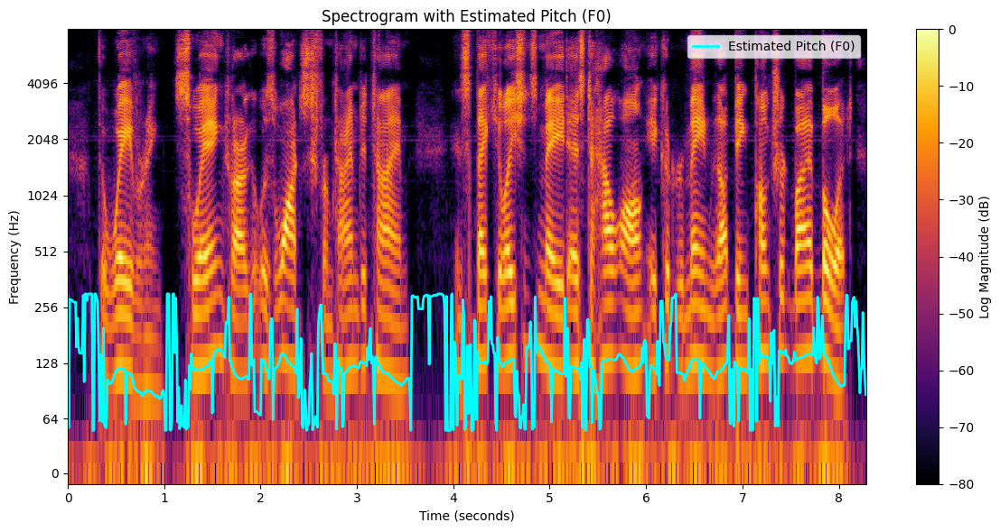

Likely Female Voice (Mean Pitch: 137 Hz)
Speaker ID: 8063


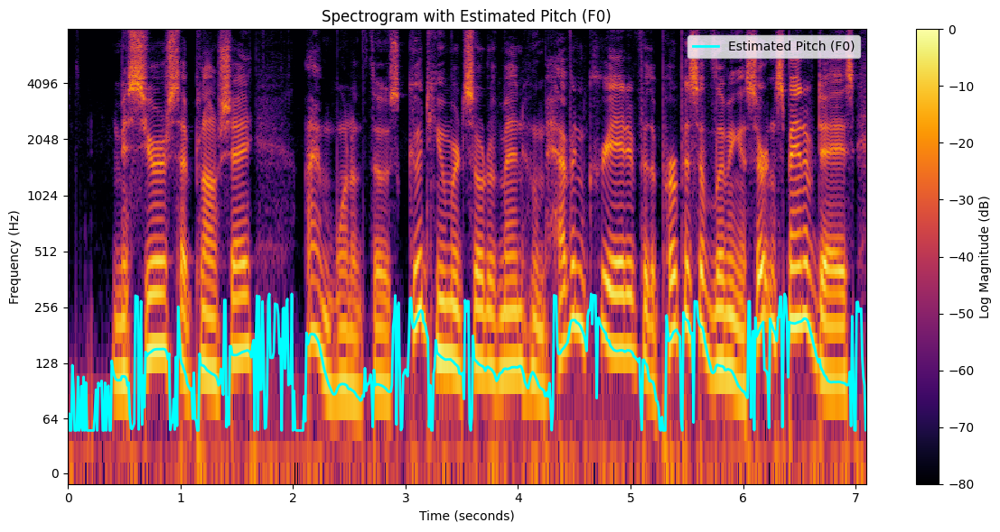

Likely Female Voice (Mean Pitch: 137 Hz)
Speaker ID: 27


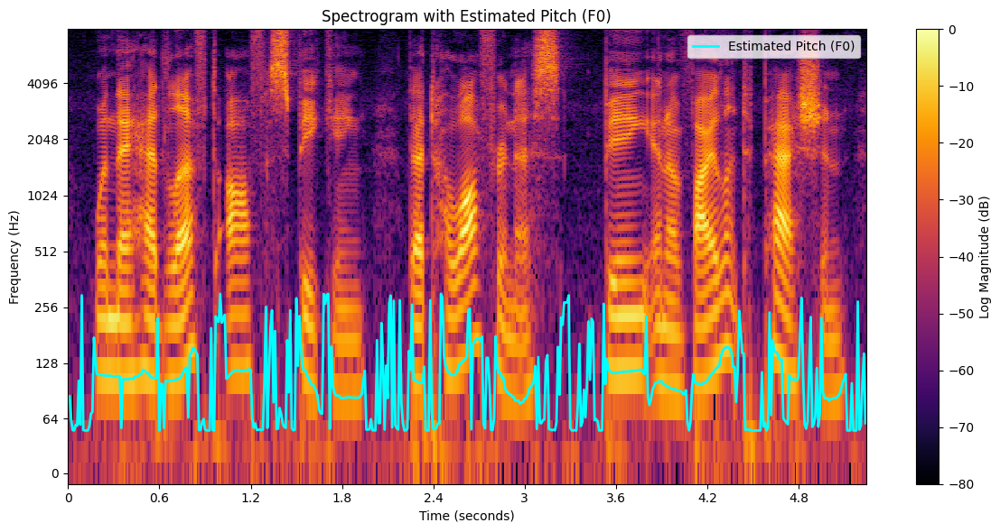

Likely Male Voice (Mean Pitch: 108 Hz)
Speaker ID: 1867


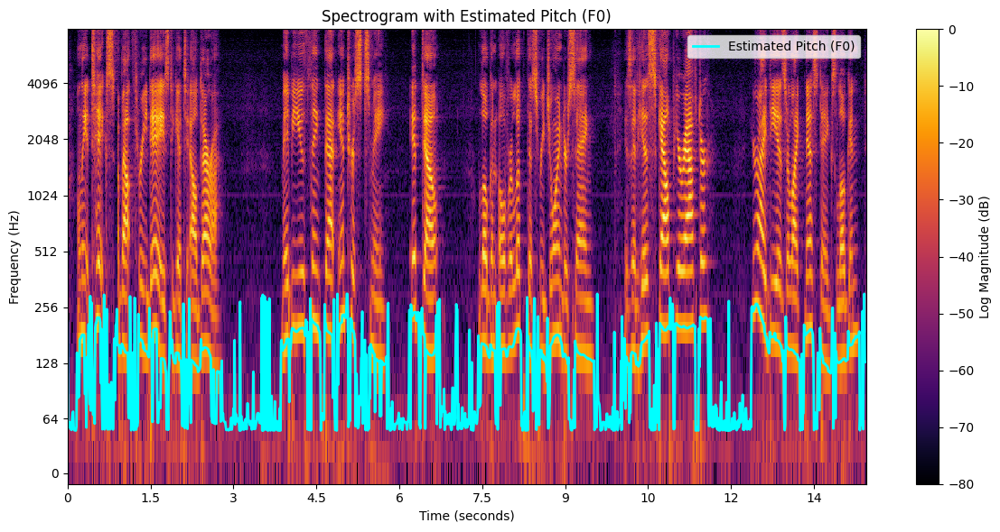

Likely Female Voice (Mean Pitch: 130 Hz)
Speaker ID: 118


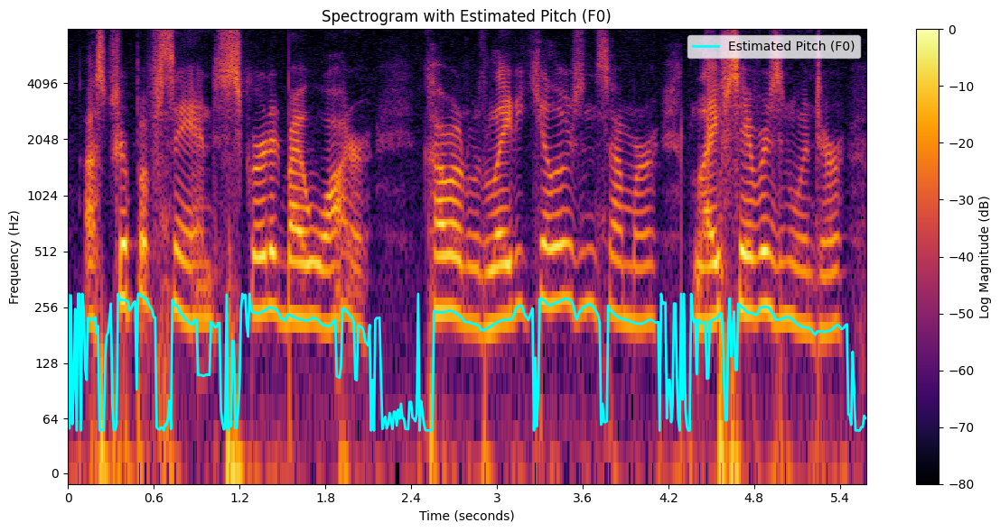

Likely Female Voice (Mean Pitch: 193 Hz)
Speaker ID: 211


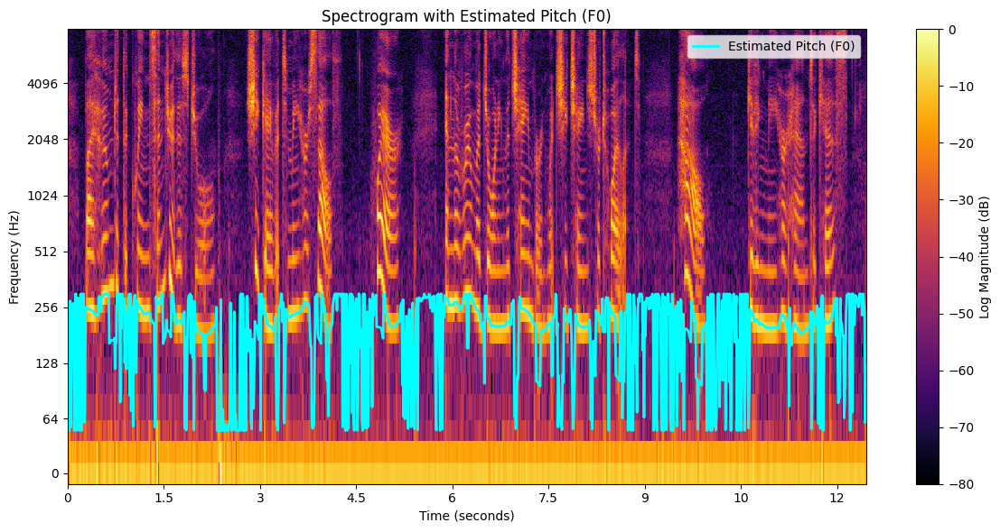

Likely Female Voice (Mean Pitch: 203 Hz)
Speaker ID: 730


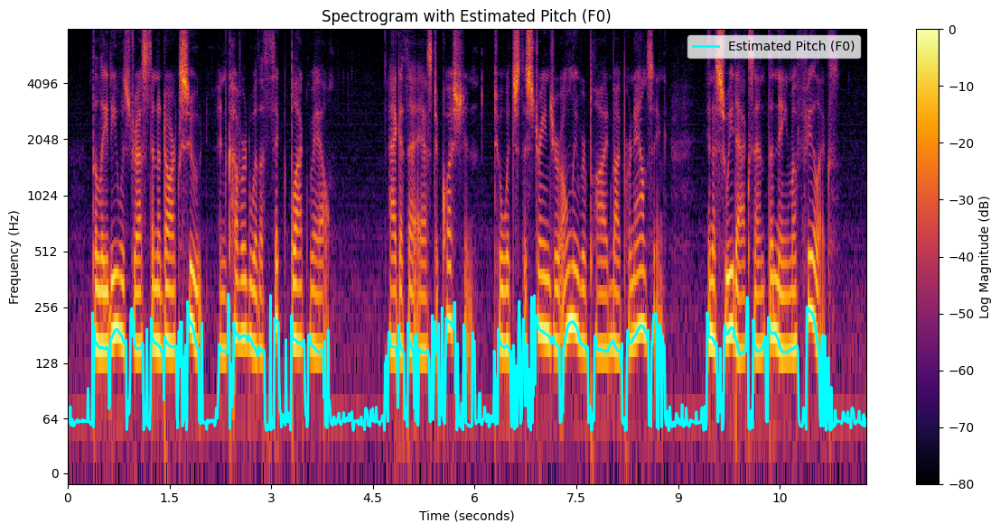

Likely Female Voice (Mean Pitch: 126 Hz)
Speaker ID: 2989


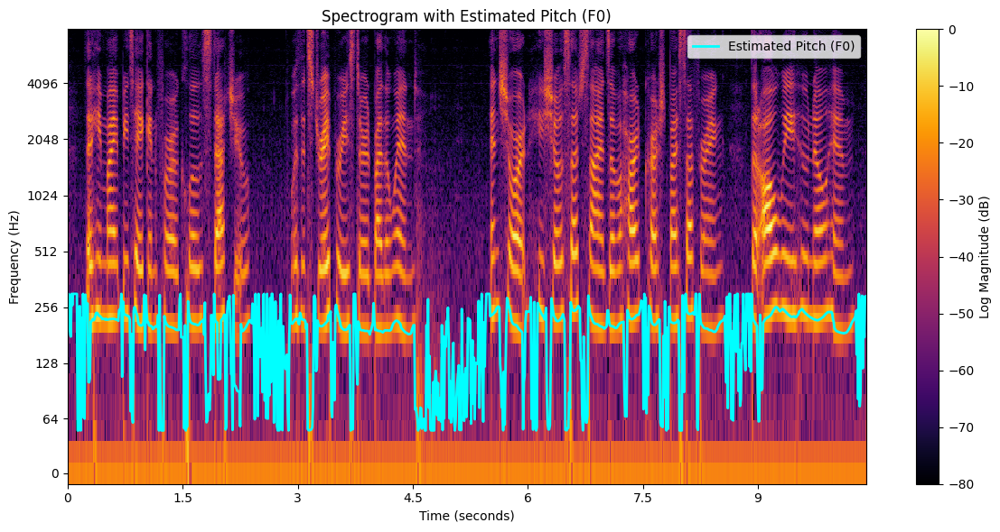

Likely Female Voice (Mean Pitch: 190 Hz)
Speaker ID: 4195


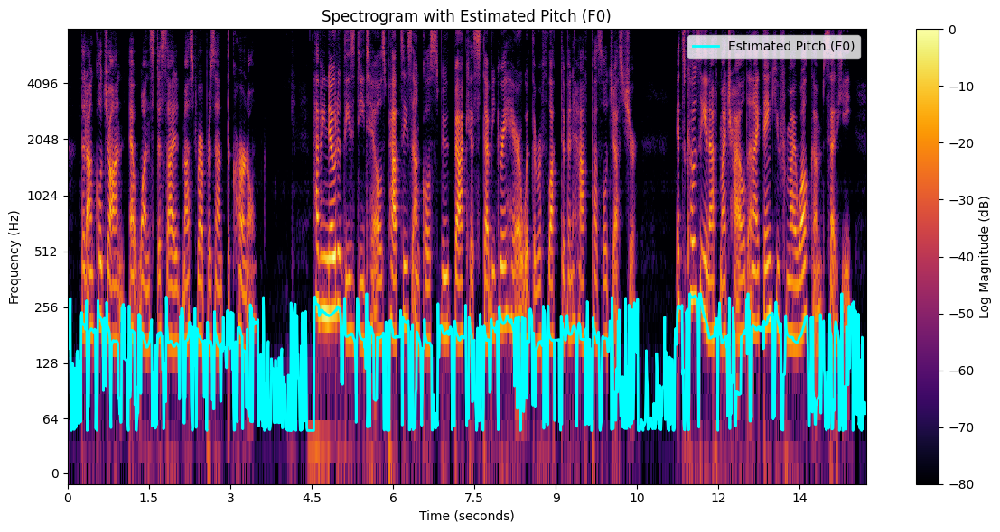

Likely Female Voice (Mean Pitch: 155 Hz)
Speaker ID: 125


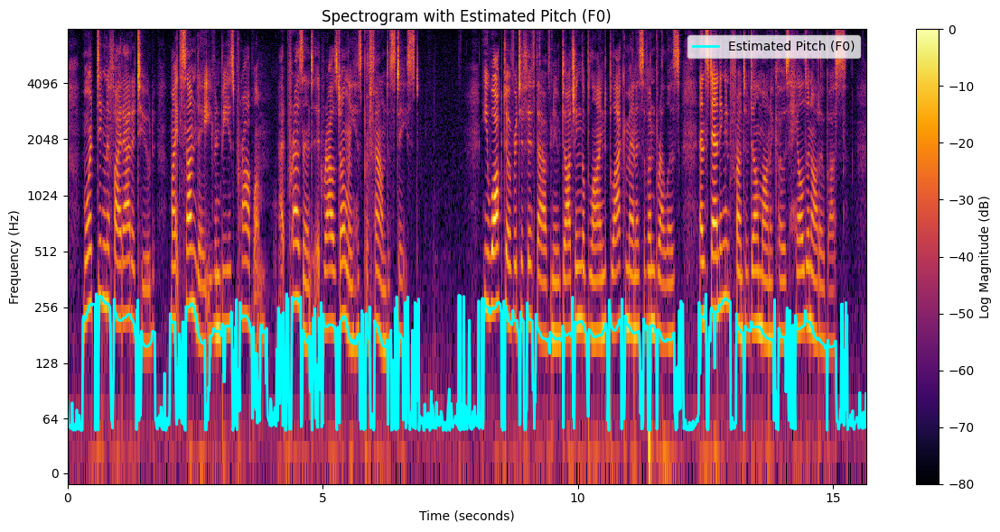

Likely Female Voice (Mean Pitch: 159 Hz)


In [ ]:
for speaker_id, split_data in speaker_split_data.items():
    print(f"Speaker ID: {speaker_id}")
    f0 = plot_spectrogram_with_pitch(speaker_split_data[speaker_id]['train'][0])
    mean_pitch = np.nanmean(f0)
    if mean_pitch < 120: # in genere l'uomo ha un pitch inferiore ai 120 Hz circa, fisso una soglia
        print("Likely Male Voice (Mean Pitch:", round(mean_pitch), "Hz)")
    else:
        print("Likely Female Voice (Mean Pitch:", round(mean_pitch), "Hz)")

In [22]:
def compute_mfcc(audio_path, n_mfcc=25, frame_length_ms=25, frame_hop_ms=10):
    """
    Questa funzione permette di calcolare gli MFCC per una singola traccia audio effettuando analisi STFT
    In questa versione usiamo i semplici MFCC come embedding
    Args:
    - audio_path (str): Path to the audio file.
    - n_mfcc (int): Number of MFCCs to extract.
    - frame_length_ms (int): Frame length in milliseconds.
    - frame_hop_ms (int): Hop length in milliseconds.
    Returns:
    - mfccs (numpy.ndarray): MFCCs for the audio file.
    """
    # Load audio
    y, sr = librosa.load(audio_path, sr=None)

    # Convert ms to samples
    frame_length = int(sr * frame_length_ms / 1000)
    hop_length = int(sr * frame_hop_ms / 1000)

    # print(f"Frame Length: {frame_length} samples")
    # print(f"Hop Length: {hop_length} samples")

    # Compute MFCCs
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc, n_fft=frame_length, hop_length=hop_length)
    # print(f"MFCC shape: {mfccs.shape}")

    return mfccs

def compute_max_shape_mfcc(audio_paths):
    """
    Dal momento che estraiamo 13 mfcc per ogni singola traccia audio, devo capire però quanti frames sto considerando per
    fare padding con il frame più lungo.
    """
    max_shape = (0, 0)  # (Frames, MFCCs)
    for audio_path in audio_paths:
        mfccs = compute_mfcc(audio_path) # (n_mfccs, frames)
        if mfccs.shape[1] > max_shape[1]:
            max_shape = (mfccs.shape[1], mfccs.shape[0])
    return max_shape

In [23]:
audio_paths = []
for speaker_id, split_data in speaker_split_data.items():
    audio_paths.extend(split_data['train'])
print(len(audio_paths))

1348


In [24]:
compute_max_shape_mfcc(audio_paths=audio_paths) # (1489, 25)

(1489, 25)

Calcolo la max_shape per poter fissare un padding successivamente ed allineare tutte le sequenze

In [ ]:
import pickle

with open('speaker_split_data.pkl', 'wb') as f:
    pickle.dump(speaker_split_data, f)

print("speaker_split_data saved successfully as speaker_split_data.pkl")

speaker_split_data saved successfully as speaker_split_data.pkl


In [ ]:
# with open('speaker_split_data.pkl', 'rb') as f:
#     loaded_speaker_split_data = pickle.load(f)

# print("speaker_split_data loaded successfully from speaker_split_data.pkl")
# print(f"Loaded data keys: {loaded_speaker_split_data.keys()}")


speaker_split_data loaded successfully from speaker_split_data.pkl
Loaded data keys: dict_keys(['4014', '8063', '27', '1867', '118', '211', '730', '2989', '4195', '125'])


# Applicazione del Deep Learning

Quello che vorremmo fare è andare ad estrarre i coefficienti MFCC da ogni traccia audio per ogni utente autorizzato ad entrare nel sistema, quindi addestrare un modello che riesca a riconoscere quest'ultimi

In [30]:
import torch
import torch.nn as nn
import torch.optim as optim
import librosa
import numpy as np
from sklearn.metrics import accuracy_score, roc_curve

def exctract_embeddings(audio_path, n_mfcc=25, frame_length_ms=25, frame_hop_ms=10, max_frames=1600):
    """
    Questa funzione permette di calcolare gli MFCC per una singola traccia audio effettuando analisi STFT
    In questa versione usiamo i semplici MFCC come embedding
    Args:
    - audio_path (str): Path to the audio file.
    - n_mfcc (int): Number of MFCCs to extract.
    - frame_length_ms (int): Frame length in milliseconds.
    - frame_hop_ms (int): Hop length in milliseconds.
    """
    # Load audio
    y, sr = librosa.load(audio_path, sr=None)
    # Convert ms to samples
    frame_length = int(sr * frame_length_ms / 1000)
    hop_length = int(sr * frame_hop_ms / 1000)
    # Compute MFCCs
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc, n_fft=frame_length, hop_length=hop_length)
    # Pad or truncate to fixed max_frames
    if mfccs.shape[1] < max_frames:
        pad_width = max_frames - mfccs.shape[1]
        mfccs = np.pad(mfccs, ((0, 0), (0, pad_width)), mode='constant')
    else:
        mfccs = mfccs[:, :max_frames]

    return torch.tensor(mfccs.T, dtype=torch.float32)  # Shape: (Frames, MFCCs)

Per la normale DNN ci accontentiamo dei coefficenti Cepstrali

In [32]:
# Load dataset and prepare training & test data
def load_data_dnn(speaker_audio_paths, n_mfcc=25, max_frames=1600):
    X_train, y_train, X_test, y_test = [], [], [], []
    speaker_to_index = {speaker: idx for idx, speaker in enumerate(speaker_audio_paths.keys())}
    for speaker_id, data in speaker_audio_paths.items():
        # Process training samples
        for audio_path in data["train"]:
            mfccs = exctract_embeddings(audio_path, n_mfcc=n_mfcc, max_frames=max_frames)
            X_train.append(mfccs.flatten())  # Flatten MFCCs for DNN input
            y_train.append(speaker_to_index[speaker_id])
        # Process test sample (single file per speaker)
        for audio_path in data["test"]:
            test_mfccs = exctract_embeddings(audio_path, n_mfcc=n_mfcc, max_frames=max_frames)
            X_test.append(test_mfccs.flatten())
            y_test.append(speaker_to_index[speaker_id])
    return (
        torch.stack(X_train), torch.tensor(y_train, dtype=torch.long),
        torch.stack(X_test), torch.tensor(y_test, dtype=torch.long),
        speaker_to_index
    )


In [ ]:
import torch

def load_data_rnn(speaker_audio_paths):
    X_train, y_train, X_test, y_test = [], [], [], []
    speaker_to_index = {speaker: idx for idx, speaker in enumerate(speaker_audio_paths.keys())}

    for speaker_id, data in speaker_audio_paths.items():
        # Process training samples
        for audio_path in data["train"]:
            mfccs = exctract_embeddings(audio_path)
            X_train.append(torch.tensor(mfccs))  # Keep sequential structure for RNN, per estrarre correlazioni spazio temporali
            y_train.append(speaker_to_index[speaker_id])

        # Process test sample
        for audio_path in data["test"]:
            test_mfccs = exctract_embeddings(audio_path)
            X_test.append(torch.tensor(test_mfccs))
            y_test.append(speaker_to_index[speaker_id])

    return (
        torch.nn.utils.rnn.pad_sequence(X_train, batch_first=True),  # Pad sequences
        torch.tensor(y_train, dtype=torch.long),
        torch.nn.utils.rnn.pad_sequence(X_test, batch_first=True),
        torch.tensor(y_test, dtype=torch.long),
        speaker_to_index
    )

In [ ]:
def load_data_cnn_lstm(speaker_audio_paths):
    X_train, y_train, X_test, y_test = [], [], [], []
    speaker_to_index = {speaker: idx for idx, speaker in enumerate(speaker_audio_paths.keys())}

    for speaker_id, data in speaker_audio_paths.items():
        # Process training samples
        for audio_path in data["train"]:
            # exctract_embeddings returns (Frames, MFCCs)
            mfccs = exctract_embeddings(audio_path)
            X_train.append(mfccs) # Append tensor (Frames, MFCCs)
            y_train.append(speaker_to_index[speaker_id])

        # Process test samples
        for audio_path in data["test"]:
            # exctract_embeddings returns (Frames, MFCCs)
            test_mfccs = exctract_embeddings(audio_path)
            X_test.append(test_mfccs) # Append tensor (Frames, MFCCs)
            y_test.append(speaker_to_index[speaker_id])

    # Pad sequences to the same length
    # pad_sequence expects a list of tensors with shape (sequence_length, features)
    # and returns a padded tensor with shape (Batch, max_sequence_length, features)
    X_train_padded = torch.nn.utils.rnn.pad_sequence(X_train, batch_first=True)
    X_test_padded = torch.nn.utils.rnn.pad_sequence(X_test, batch_first=True)

    X_train_cnn_input = X_train_padded
    X_test_cnn_input = X_test_padded


    return (
        X_train_cnn_input,
        torch.tensor(y_train, dtype=torch.long),
        X_test_cnn_input,
        torch.tensor(y_test, dtype=torch.long),
        speaker_to_index
    )

## Definizione dei modelli

In [ ]:
import torch
import torch.nn as nn

class SpeakerClassificationDNN(nn.Module):
    def __init__(self, input_dim, num_classes):
        super(SpeakerClassificationDNN, self).__init__()
        self.feature_extractor = nn.Sequential(
            nn.Linear(input_dim, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, 64),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(64, 32),
            nn.BatchNorm1d(32),
            nn.ReLU(),
            nn.Dropout(0.3),
        )
        self.classifier = nn.Linear(32, num_classes)  # Final layer for classification

    def forward(self, x):
        features = self.feature_extractor(x)  # Extract embeddings
        logits = self.classifier(features)  # Classification logits
        return logits  # Return both outputs

    def extract_embeddings(self, x):
        return self.feature_extractor(x)

In [ ]:
import torch
import torch.nn as nn

class SpeakerClassificationRNN(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_layers, num_classes):
        super(SpeakerClassificationRNN, self).__init__()

        self.rnn = nn.LSTM(
            input_size=input_dim,
            hidden_size=hidden_dim,
            num_layers=num_layers,
            batch_first=True,
            bidirectional=True
        )

        self.feature_extractor = nn.Sequential(
            nn.Linear(hidden_dim * 2, 64),
            nn.ReLU(),
            nn.Dropout(0.3)
        )

        self.classifier = nn.Linear(64, num_classes)  # Final classification layer

    def forward(self, x):
        rnn_out, _ = self.rnn(x)
        last_time_step = rnn_out[:, -1, :]  # Extract last time-step output
        embeddings = self.feature_extractor(last_time_step)  # Extract embeddings
        logits = self.classifier(embeddings)  # Classification output
        return logits  # Return both outputs

    def extract_embeddings(self, x):
        rnn_out, _ = self.rnn(x)
        last_time_step = rnn_out[:, -1, :]
        return self.feature_extractor(last_time_step)

    def extract_mean_embeddings(self, x):
        rnn_out, _ = self.rnn(x)
        mean_embedding = torch.mean(rnn_out, dim=1)
        return self.feature_extractor(mean_embedding)

In [160]:
import torch
import torch.nn as nn

class CNN_LSTM_SpeakerClassification(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_layers, num_classes):
        super(CNN_LSTM_SpeakerClassification, self).__init__()

        # CNN for feature extraction
        self.cnn = nn.Sequential(
            nn.Conv1d(in_channels=input_dim, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=2, stride=2),
            nn.Conv1d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=2, stride=2)
        )

        # LSTM for sequential modeling
        self.lstm = nn.LSTM(
            input_size=128,
            hidden_size=hidden_dim,
            num_layers=num_layers,
            batch_first=True,
            bidirectional=True
        )

        # Feature extractor
        self.feature_extractor = nn.Sequential(
            nn.Linear(hidden_dim * 2, 64),
            nn.ReLU(),
            nn.Dropout(0.3)
        )

        # Final classifier
        self.classifier = nn.Linear(64, num_classes)

    def forward(self, x):
        # CNN feature extraction
        x = x.permute(0, 2, 1)  # Adjust input shape for Conv1d (Batch, MFCC, Frames)
        cnn_out = self.cnn(x)
        cnn_out = cnn_out.permute(0, 2, 1)  # Convert back to (Batch, Frames, Features)

        # LSTM processing
        lstm_out, _ = self.lstm(cnn_out)
        last_time_step = lstm_out[:, -1, :]  # Extract last time-step output

        # Extract embeddings & classify
        embeddings = self.feature_extractor(last_time_step)
        logits = self.classifier(embeddings)

        return logits

    def extract_embeddings(self, x):
        x = x.permute(0, 2, 1)  # Adjust input shape for CNN
        cnn_out = self.cnn(x)
        cnn_out = cnn_out.permute(0, 2, 1)  # Convert back to (Batch, Frames, Features)

        lstm_out, _ = self.lstm(cnn_out)
        last_time_step = lstm_out[:, -1, :]

        return self.feature_extractor(last_time_step)

    def extract_mean_embeddings(self,x):
        x = x.permute(0, 2, 1)  # Adjust input shape for CNN
        cnn_out = self.cnn(x)
        cnn_out = cnn_out.permute(0, 2, 1)  # Convert back to (Batch, Frames, Features)
        lstm_out, _ = self.lstm(cnn_out)
        mean_embedding = torch.mean(lstm_out, dim=1)
        return self.feature_extractor(mean_embedding)

# Partiamo con la DNN

In [38]:
import torch
import numpy as np
from sklearn.metrics import accuracy_score, f1_score
from tqdm import tqdm

X_train, y_train, X_test, y_test, speaker_to_index = load_data_dnn(speaker_split_data)

# Initialize model
model = SpeakerClassificationDNN(X_train.shape[1], len(speaker_to_index))

# Define loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=0.001)

# Parametri per early stopping
patience = 30  # Numero di epoche senza miglioramenti prima di fermarsi
best_f1 = 0
counter = 0
best_model_state = None

In [39]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

torch.Size([1348, 40000])
torch.Size([1348])
torch.Size([144, 40000])
torch.Size([144])


In [ ]:
# Training Loop con early stopping e salvataggio del miglior modello
for epoch in tqdm(range(100), desc="Training Progress", unit="epoch"):
    model.train()
    optimizer.zero_grad()
    output = model(X_train)  # Forward pass
    loss = criterion(output, y_train)  # Compute loss
    loss.backward()  # Backpropagation
    optimizer.step()  # Update weights

    # Validation Step
    with torch.no_grad():
        val_preds = model(X_test).argmax(dim=1)  # Get predicted classes
        val_loss = criterion(model(X_test), y_test)  # Compute validation loss

    # Compute Metrics
    accuracy = accuracy_score(y_test.numpy(), val_preds.numpy())
    f1 = f1_score(y_test.numpy(), val_preds.numpy(), average="weighted")

    print(f"Epoch {epoch+1}, Loss: {loss.item():.4f}, Val Loss: {val_loss.item():.4f}, Accuracy: {accuracy * 100:.2f}%, F1-score: {f1:.4f}")

    # # Early Stopping
    if f1 >= best_f1:
        best_f1 = f1
        print(f"Miglior f1 salvata all'epoca {epoch+1}")
        best_model_state = model.state_dict()
        counter = 0  # Reset counter
    else:
        counter += 1

# Salvataggio del miglior modello
torch.save(best_model_state, "best_model_dnn.pth")
print("Miglior modello salvato con F1-score:", best_f1)

Training Progress:   1%|          | 1/100 [00:00<01:27,  1.14epoch/s]

Epoch 1, Loss: 2.4324, Val Loss: 2.2641, Accuracy: 14.58%, F1-score: 0.1331
Miglior f1 salvata all'epoca 1


Training Progress:   2%|▏         | 2/100 [00:01<01:04,  1.53epoch/s]

Epoch 2, Loss: 2.2185, Val Loss: 2.1970, Accuracy: 18.06%, F1-score: 0.1646
Miglior f1 salvata all'epoca 2


Training Progress:   3%|▎         | 3/100 [00:01<00:56,  1.71epoch/s]

Epoch 3, Loss: 2.1485, Val Loss: 2.1090, Accuracy: 25.00%, F1-score: 0.2210
Miglior f1 salvata all'epoca 3


Training Progress:   4%|▍         | 4/100 [00:02<00:52,  1.82epoch/s]

Epoch 4, Loss: 2.0456, Val Loss: 2.0339, Accuracy: 29.17%, F1-score: 0.2586
Miglior f1 salvata all'epoca 4


Training Progress:   5%|▌         | 5/100 [00:02<00:50,  1.87epoch/s]

Epoch 5, Loss: 1.9881, Val Loss: 1.9735, Accuracy: 32.64%, F1-score: 0.2946
Miglior f1 salvata all'epoca 5


Training Progress:   6%|▌         | 6/100 [00:03<00:48,  1.92epoch/s]

Epoch 6, Loss: 1.9569, Val Loss: 1.9285, Accuracy: 29.86%, F1-score: 0.2796


Training Progress:   7%|▋         | 7/100 [00:03<00:48,  1.93epoch/s]

Epoch 7, Loss: 1.9116, Val Loss: 1.8556, Accuracy: 40.97%, F1-score: 0.3869
Miglior f1 salvata all'epoca 7


Training Progress:   8%|▊         | 8/100 [00:04<00:47,  1.96epoch/s]

Epoch 8, Loss: 1.8455, Val Loss: 1.8402, Accuracy: 44.44%, F1-score: 0.4320
Miglior f1 salvata all'epoca 8


Training Progress:   9%|▉         | 9/100 [00:04<00:46,  1.97epoch/s]

Epoch 9, Loss: 1.8185, Val Loss: 1.8865, Accuracy: 45.83%, F1-score: 0.4210


Training Progress:  10%|█         | 10/100 [00:05<00:45,  1.99epoch/s]

Epoch 10, Loss: 1.7670, Val Loss: 1.8122, Accuracy: 47.92%, F1-score: 0.4701
Miglior f1 salvata all'epoca 10


Training Progress:  11%|█         | 11/100 [00:05<00:44,  1.98epoch/s]

Epoch 11, Loss: 1.7286, Val Loss: 1.7374, Accuracy: 50.00%, F1-score: 0.4787
Miglior f1 salvata all'epoca 11


Training Progress:  12%|█▏        | 12/100 [00:06<00:44,  1.98epoch/s]

Epoch 12, Loss: 1.6935, Val Loss: 1.6827, Accuracy: 45.83%, F1-score: 0.4490


Training Progress:  13%|█▎        | 13/100 [00:06<00:43,  1.98epoch/s]

Epoch 13, Loss: 1.6790, Val Loss: 1.6837, Accuracy: 56.94%, F1-score: 0.5537
Miglior f1 salvata all'epoca 13


Training Progress:  14%|█▍        | 14/100 [00:07<00:42,  2.00epoch/s]

Epoch 14, Loss: 1.6209, Val Loss: 1.6604, Accuracy: 54.17%, F1-score: 0.5238


Training Progress:  15%|█▌        | 15/100 [00:07<00:42,  1.98epoch/s]

Epoch 15, Loss: 1.6055, Val Loss: 1.6300, Accuracy: 56.94%, F1-score: 0.5437


Training Progress:  16%|█▌        | 16/100 [00:08<00:42,  2.00epoch/s]

Epoch 16, Loss: 1.5672, Val Loss: 1.5936, Accuracy: 61.11%, F1-score: 0.5979
Miglior f1 salvata all'epoca 16


Training Progress:  17%|█▋        | 17/100 [00:08<00:41,  1.99epoch/s]

Epoch 17, Loss: 1.5306, Val Loss: 1.5544, Accuracy: 69.44%, F1-score: 0.6903
Miglior f1 salvata all'epoca 17


Training Progress:  18%|█▊        | 18/100 [00:09<00:41,  1.99epoch/s]

Epoch 18, Loss: 1.5024, Val Loss: 1.5296, Accuracy: 66.67%, F1-score: 0.6638


Training Progress:  19%|█▉        | 19/100 [00:09<00:40,  1.98epoch/s]

Epoch 19, Loss: 1.4809, Val Loss: 1.5411, Accuracy: 64.58%, F1-score: 0.6184


Training Progress:  20%|██        | 20/100 [00:10<00:40,  1.99epoch/s]

Epoch 20, Loss: 1.4530, Val Loss: 1.5276, Accuracy: 68.75%, F1-score: 0.6752


Training Progress:  21%|██        | 21/100 [00:11<00:46,  1.71epoch/s]

Epoch 21, Loss: 1.4270, Val Loss: 1.4585, Accuracy: 71.53%, F1-score: 0.7053
Miglior f1 salvata all'epoca 21


Training Progress:  22%|██▏       | 22/100 [00:12<00:51,  1.52epoch/s]

Epoch 22, Loss: 1.3970, Val Loss: 1.4620, Accuracy: 70.83%, F1-score: 0.7024


Training Progress:  23%|██▎       | 23/100 [00:12<00:53,  1.44epoch/s]

Epoch 23, Loss: 1.3807, Val Loss: 1.4405, Accuracy: 75.00%, F1-score: 0.7313
Miglior f1 salvata all'epoca 23


Training Progress:  24%|██▍       | 24/100 [00:13<00:49,  1.55epoch/s]

Epoch 24, Loss: 1.3475, Val Loss: 1.3516, Accuracy: 76.39%, F1-score: 0.7619
Miglior f1 salvata all'epoca 24


Training Progress:  25%|██▌       | 25/100 [00:13<00:45,  1.67epoch/s]

Epoch 25, Loss: 1.3079, Val Loss: 1.3607, Accuracy: 79.17%, F1-score: 0.7874
Miglior f1 salvata all'epoca 25


Training Progress:  26%|██▌       | 26/100 [00:14<00:42,  1.75epoch/s]

Epoch 26, Loss: 1.3114, Val Loss: 1.3584, Accuracy: 74.31%, F1-score: 0.7349


Training Progress:  27%|██▋       | 27/100 [00:14<00:40,  1.82epoch/s]

Epoch 27, Loss: 1.2751, Val Loss: 1.3325, Accuracy: 79.17%, F1-score: 0.7895
Miglior f1 salvata all'epoca 27


Training Progress:  28%|██▊       | 28/100 [00:15<00:38,  1.87epoch/s]

Epoch 28, Loss: 1.2524, Val Loss: 1.2847, Accuracy: 79.17%, F1-score: 0.7901
Miglior f1 salvata all'epoca 28


Training Progress:  29%|██▉       | 29/100 [00:15<00:37,  1.91epoch/s]

Epoch 29, Loss: 1.2473, Val Loss: 1.3002, Accuracy: 78.47%, F1-score: 0.7807


Training Progress:  30%|███       | 30/100 [00:16<00:36,  1.94epoch/s]

Epoch 30, Loss: 1.1875, Val Loss: 1.2149, Accuracy: 84.03%, F1-score: 0.8361
Miglior f1 salvata all'epoca 30


Training Progress:  31%|███       | 31/100 [00:16<00:35,  1.97epoch/s]

Epoch 31, Loss: 1.1862, Val Loss: 1.2519, Accuracy: 81.94%, F1-score: 0.8180


Training Progress:  32%|███▏      | 32/100 [00:17<00:34,  1.97epoch/s]

Epoch 32, Loss: 1.1695, Val Loss: 1.2364, Accuracy: 79.17%, F1-score: 0.7844


Training Progress:  33%|███▎      | 33/100 [00:17<00:33,  2.00epoch/s]

Epoch 33, Loss: 1.1416, Val Loss: 1.1726, Accuracy: 82.64%, F1-score: 0.8253


Training Progress:  34%|███▍      | 34/100 [00:18<00:33,  1.98epoch/s]

Epoch 34, Loss: 1.1357, Val Loss: 1.1935, Accuracy: 88.19%, F1-score: 0.8794
Miglior f1 salvata all'epoca 34


Training Progress:  35%|███▌      | 35/100 [00:18<00:32,  1.99epoch/s]

Epoch 35, Loss: 1.1038, Val Loss: 1.1496, Accuracy: 84.03%, F1-score: 0.8380


Training Progress:  36%|███▌      | 36/100 [00:19<00:32,  1.99epoch/s]

Epoch 36, Loss: 1.0859, Val Loss: 1.1649, Accuracy: 81.94%, F1-score: 0.8182


Training Progress:  37%|███▋      | 37/100 [00:19<00:31,  2.01epoch/s]

Epoch 37, Loss: 1.0791, Val Loss: 1.1071, Accuracy: 88.19%, F1-score: 0.8804
Miglior f1 salvata all'epoca 37


Training Progress:  38%|███▊      | 38/100 [00:20<00:30,  2.01epoch/s]

Epoch 38, Loss: 1.0513, Val Loss: 1.0998, Accuracy: 84.72%, F1-score: 0.8464


Training Progress:  39%|███▉      | 39/100 [00:20<00:30,  2.03epoch/s]

Epoch 39, Loss: 1.0400, Val Loss: 1.0881, Accuracy: 88.89%, F1-score: 0.8878
Miglior f1 salvata all'epoca 39


Training Progress:  40%|████      | 40/100 [00:21<00:29,  2.03epoch/s]

Epoch 40, Loss: 1.0176, Val Loss: 1.1318, Accuracy: 90.28%, F1-score: 0.9031
Miglior f1 salvata all'epoca 40


Training Progress:  41%|████      | 41/100 [00:21<00:29,  2.02epoch/s]

Epoch 41, Loss: 1.0035, Val Loss: 1.1052, Accuracy: 87.50%, F1-score: 0.8754


Training Progress:  42%|████▏     | 42/100 [00:22<00:28,  2.01epoch/s]

Epoch 42, Loss: 0.9902, Val Loss: 1.0796, Accuracy: 88.19%, F1-score: 0.8824


Training Progress:  43%|████▎     | 43/100 [00:22<00:28,  2.02epoch/s]

Epoch 43, Loss: 0.9691, Val Loss: 1.0074, Accuracy: 89.58%, F1-score: 0.8937


Training Progress:  44%|████▍     | 44/100 [00:23<00:31,  1.78epoch/s]

Epoch 44, Loss: 0.9614, Val Loss: 1.0770, Accuracy: 93.75%, F1-score: 0.9369
Miglior f1 salvata all'epoca 44


Training Progress:  45%|████▌     | 45/100 [00:24<00:34,  1.59epoch/s]

Epoch 45, Loss: 0.9429, Val Loss: 1.0273, Accuracy: 89.58%, F1-score: 0.8946


Training Progress:  46%|████▌     | 46/100 [00:25<00:36,  1.48epoch/s]

Epoch 46, Loss: 0.9234, Val Loss: 0.9865, Accuracy: 91.67%, F1-score: 0.9173


Training Progress:  47%|████▋     | 47/100 [00:25<00:33,  1.56epoch/s]

Epoch 47, Loss: 0.9104, Val Loss: 0.9161, Accuracy: 90.97%, F1-score: 0.9105


Training Progress:  48%|████▊     | 48/100 [00:26<00:30,  1.68epoch/s]

Epoch 48, Loss: 0.8896, Val Loss: 0.9327, Accuracy: 88.89%, F1-score: 0.8892


Training Progress:  49%|████▉     | 49/100 [00:26<00:28,  1.77epoch/s]

Epoch 49, Loss: 0.8712, Val Loss: 0.9338, Accuracy: 90.97%, F1-score: 0.9090


Training Progress:  50%|█████     | 50/100 [00:27<00:27,  1.85epoch/s]

Epoch 50, Loss: 0.8742, Val Loss: 0.8803, Accuracy: 91.67%, F1-score: 0.9162


Training Progress:  51%|█████     | 51/100 [00:27<00:26,  1.84epoch/s]

Epoch 51, Loss: 0.8511, Val Loss: 0.8492, Accuracy: 90.97%, F1-score: 0.9088


Training Progress:  52%|█████▏    | 52/100 [00:28<00:25,  1.90epoch/s]

Epoch 52, Loss: 0.8264, Val Loss: 0.8912, Accuracy: 95.83%, F1-score: 0.9584
Miglior f1 salvata all'epoca 52


Training Progress:  53%|█████▎    | 53/100 [00:28<00:24,  1.94epoch/s]

Epoch 53, Loss: 0.8215, Val Loss: 0.8499, Accuracy: 93.75%, F1-score: 0.9371


Training Progress:  54%|█████▍    | 54/100 [00:29<00:23,  1.98epoch/s]

Epoch 54, Loss: 0.8076, Val Loss: 0.9107, Accuracy: 95.14%, F1-score: 0.9512


Training Progress:  55%|█████▌    | 55/100 [00:29<00:22,  1.98epoch/s]

Epoch 55, Loss: 0.8122, Val Loss: 0.8704, Accuracy: 88.89%, F1-score: 0.8891


Training Progress:  56%|█████▌    | 56/100 [00:30<00:22,  1.97epoch/s]

Epoch 56, Loss: 0.7874, Val Loss: 0.8777, Accuracy: 94.44%, F1-score: 0.9444


Training Progress:  57%|█████▋    | 57/100 [00:30<00:21,  1.97epoch/s]

Epoch 57, Loss: 0.7586, Val Loss: 0.8619, Accuracy: 93.75%, F1-score: 0.9376


Training Progress:  58%|█████▊    | 58/100 [00:31<00:21,  2.00epoch/s]

Epoch 58, Loss: 0.7610, Val Loss: 0.7874, Accuracy: 93.75%, F1-score: 0.9373


Training Progress:  59%|█████▉    | 59/100 [00:31<00:20,  2.02epoch/s]

Epoch 59, Loss: 0.7341, Val Loss: 0.7791, Accuracy: 93.06%, F1-score: 0.9305


Training Progress:  60%|██████    | 60/100 [00:32<00:19,  2.02epoch/s]

Epoch 60, Loss: 0.7332, Val Loss: 0.7841, Accuracy: 94.44%, F1-score: 0.9448


Training Progress:  61%|██████    | 61/100 [00:32<00:19,  2.02epoch/s]

Epoch 61, Loss: 0.7272, Val Loss: 0.7510, Accuracy: 94.44%, F1-score: 0.9435


Training Progress:  62%|██████▏   | 62/100 [00:33<00:18,  2.02epoch/s]

Epoch 62, Loss: 0.7137, Val Loss: 0.7854, Accuracy: 96.53%, F1-score: 0.9656
Miglior f1 salvata all'epoca 62


Training Progress:  63%|██████▎   | 63/100 [00:33<00:18,  2.05epoch/s]

Epoch 63, Loss: 0.7110, Val Loss: 0.7574, Accuracy: 95.83%, F1-score: 0.9588


Training Progress:  64%|██████▍   | 64/100 [00:34<00:17,  2.03epoch/s]

Epoch 64, Loss: 0.6910, Val Loss: 0.7618, Accuracy: 95.14%, F1-score: 0.9513


Training Progress:  65%|██████▌   | 65/100 [00:34<00:17,  2.05epoch/s]

Epoch 65, Loss: 0.6659, Val Loss: 0.6962, Accuracy: 95.14%, F1-score: 0.9514


Training Progress:  66%|██████▌   | 66/100 [00:35<00:16,  2.04epoch/s]

Epoch 66, Loss: 0.6655, Val Loss: 0.7181, Accuracy: 94.44%, F1-score: 0.9447


Training Progress:  67%|██████▋   | 67/100 [00:35<00:17,  1.88epoch/s]

Epoch 67, Loss: 0.6346, Val Loss: 0.7882, Accuracy: 97.22%, F1-score: 0.9724
Miglior f1 salvata all'epoca 67


Training Progress:  68%|██████▊   | 68/100 [00:36<00:19,  1.63epoch/s]

Epoch 68, Loss: 0.6531, Val Loss: 0.7342, Accuracy: 95.14%, F1-score: 0.9520


Training Progress:  69%|██████▉   | 69/100 [00:37<00:20,  1.50epoch/s]

Epoch 69, Loss: 0.6397, Val Loss: 0.6159, Accuracy: 95.83%, F1-score: 0.9575


Training Progress:  70%|███████   | 70/100 [00:37<00:19,  1.54epoch/s]

Epoch 70, Loss: 0.6236, Val Loss: 0.7088, Accuracy: 92.36%, F1-score: 0.9241


Training Progress:  71%|███████   | 71/100 [00:38<00:17,  1.65epoch/s]

Epoch 71, Loss: 0.6143, Val Loss: 0.6861, Accuracy: 96.53%, F1-score: 0.9654


Training Progress:  72%|███████▏  | 72/100 [00:38<00:15,  1.76epoch/s]

Epoch 72, Loss: 0.6102, Val Loss: 0.6370, Accuracy: 96.53%, F1-score: 0.9648


Training Progress:  73%|███████▎  | 73/100 [00:39<00:14,  1.83epoch/s]

Epoch 73, Loss: 0.5916, Val Loss: 0.6438, Accuracy: 95.83%, F1-score: 0.9580


Training Progress:  74%|███████▍  | 74/100 [00:39<00:13,  1.89epoch/s]

Epoch 74, Loss: 0.5836, Val Loss: 0.6418, Accuracy: 96.53%, F1-score: 0.9657


Training Progress:  75%|███████▌  | 75/100 [00:40<00:12,  1.93epoch/s]

Epoch 75, Loss: 0.5571, Val Loss: 0.6742, Accuracy: 97.22%, F1-score: 0.9722


Training Progress:  76%|███████▌  | 76/100 [00:40<00:12,  1.97epoch/s]

Epoch 76, Loss: 0.5587, Val Loss: 0.5773, Accuracy: 97.22%, F1-score: 0.9724


Training Progress:  77%|███████▋  | 77/100 [00:41<00:11,  1.99epoch/s]

Epoch 77, Loss: 0.5607, Val Loss: 0.6489, Accuracy: 95.83%, F1-score: 0.9587


Training Progress:  78%|███████▊  | 78/100 [00:41<00:10,  2.00epoch/s]

Epoch 78, Loss: 0.5482, Val Loss: 0.6100, Accuracy: 98.61%, F1-score: 0.9861
Miglior f1 salvata all'epoca 78


Training Progress:  79%|███████▉  | 79/100 [00:42<00:10,  2.00epoch/s]

Epoch 79, Loss: 0.5569, Val Loss: 0.6815, Accuracy: 95.83%, F1-score: 0.9577


Training Progress:  80%|████████  | 80/100 [00:42<00:09,  2.02epoch/s]

Epoch 80, Loss: 0.5449, Val Loss: 0.6748, Accuracy: 96.53%, F1-score: 0.9656


Training Progress:  81%|████████  | 81/100 [00:43<00:09,  2.03epoch/s]

Epoch 81, Loss: 0.5172, Val Loss: 0.5877, Accuracy: 95.83%, F1-score: 0.9584


Training Progress:  82%|████████▏ | 82/100 [00:43<00:08,  2.02epoch/s]

Epoch 82, Loss: 0.5242, Val Loss: 0.5961, Accuracy: 97.92%, F1-score: 0.9794


Training Progress:  83%|████████▎ | 83/100 [00:44<00:08,  2.02epoch/s]

Epoch 83, Loss: 0.5216, Val Loss: 0.5483, Accuracy: 96.53%, F1-score: 0.9655


Training Progress:  84%|████████▍ | 84/100 [00:44<00:07,  2.03epoch/s]

Epoch 84, Loss: 0.5028, Val Loss: 0.5619, Accuracy: 94.44%, F1-score: 0.9440


Training Progress:  85%|████████▌ | 85/100 [00:45<00:07,  2.03epoch/s]

Epoch 85, Loss: 0.4869, Val Loss: 0.5482, Accuracy: 97.92%, F1-score: 0.9792


Training Progress:  86%|████████▌ | 86/100 [00:45<00:06,  2.05epoch/s]

Epoch 86, Loss: 0.4899, Val Loss: 0.5330, Accuracy: 96.53%, F1-score: 0.9650


Training Progress:  87%|████████▋ | 87/100 [00:46<00:06,  2.06epoch/s]

Epoch 87, Loss: 0.4727, Val Loss: 0.5326, Accuracy: 95.14%, F1-score: 0.9512


Training Progress:  88%|████████▊ | 88/100 [00:46<00:05,  2.03epoch/s]

Epoch 88, Loss: 0.4949, Val Loss: 0.4996, Accuracy: 95.83%, F1-score: 0.9580


Training Progress:  89%|████████▉ | 89/100 [00:47<00:05,  2.03epoch/s]

Epoch 89, Loss: 0.4752, Val Loss: 0.5426, Accuracy: 95.14%, F1-score: 0.9517


Training Progress:  90%|█████████ | 90/100 [00:47<00:05,  1.92epoch/s]

Epoch 90, Loss: 0.4613, Val Loss: 0.5647, Accuracy: 97.22%, F1-score: 0.9722


Training Progress:  91%|█████████ | 91/100 [00:48<00:05,  1.64epoch/s]

Epoch 91, Loss: 0.4597, Val Loss: 0.4675, Accuracy: 98.61%, F1-score: 0.9861
Miglior f1 salvata all'epoca 91


Training Progress:  92%|█████████▏| 92/100 [00:49<00:05,  1.49epoch/s]

Epoch 92, Loss: 0.4459, Val Loss: 0.5073, Accuracy: 97.22%, F1-score: 0.9724


Training Progress:  93%|█████████▎| 93/100 [00:50<00:04,  1.46epoch/s]

Epoch 93, Loss: 0.4293, Val Loss: 0.5905, Accuracy: 97.22%, F1-score: 0.9720


Training Progress:  94%|█████████▍| 94/100 [00:50<00:03,  1.59epoch/s]

Epoch 94, Loss: 0.4444, Val Loss: 0.5035, Accuracy: 97.22%, F1-score: 0.9722


Training Progress:  95%|█████████▌| 95/100 [00:51<00:02,  1.71epoch/s]

Epoch 95, Loss: 0.4299, Val Loss: 0.4631, Accuracy: 97.92%, F1-score: 0.9793


Training Progress:  96%|█████████▌| 96/100 [00:51<00:02,  1.79epoch/s]

Epoch 96, Loss: 0.4309, Val Loss: 0.5059, Accuracy: 96.53%, F1-score: 0.9654


Training Progress:  97%|█████████▋| 97/100 [00:52<00:01,  1.86epoch/s]

Epoch 97, Loss: 0.4000, Val Loss: 0.4876, Accuracy: 94.44%, F1-score: 0.9455


Training Progress:  98%|█████████▊| 98/100 [00:52<00:01,  1.90epoch/s]

Epoch 98, Loss: 0.4133, Val Loss: 0.5186, Accuracy: 99.31%, F1-score: 0.9930
Miglior f1 salvata all'epoca 98


Training Progress:  99%|█████████▉| 99/100 [00:53<00:00,  1.93epoch/s]

Epoch 99, Loss: 0.4016, Val Loss: 0.4614, Accuracy: 97.92%, F1-score: 0.9791


Training Progress: 100%|██████████| 100/100 [00:53<00:00,  1.87epoch/s]

Epoch 100, Loss: 0.3961, Val Loss: 0.4246, Accuracy: 97.22%, F1-score: 0.9722
Miglior modello salvato con F1-score: 0.993045267489712


## Valutazione su nuovi utenti

In [ ]:
# Load the best model state
model = SpeakerClassificationDNN(X_train.shape[1], len(speaker_to_index))
model.load_state_dict(torch.load("best_model_dnn.pth"))
model.eval()  # Set the model to evaluation mode

# Calculate predictions on the test set
with torch.no_grad():
    y_preds = model(X_test).argmax(dim=1)

# y_test contains the true labels

# Print the true and predicted labels
print("\nTrue Test Labels (y_test):")
print(y_test.numpy())

print("\nPredicted Test Labels (y_preds):")
print(y_preds.numpy())


True Test Labels (y_test):
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2
 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 8 8 8 8 8 8 8 8 8 8 8 8 8 8 9 9 9 9 9 9 9 9 9 9 9 9 9]

Predicted Test Labels (y_preds):
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2
 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 8 8 8 8 8 8 8 8 8 8 8 8 8 8 9 9 9 9 9 9 9 9 9 9 9 9 9]


In [42]:
# Compute Accuracy
accuracy = accuracy_score(y_test.numpy(), y_preds.numpy())
print(f"Test Accuracy: {accuracy * 100:.2f}%")

# You can add other multiclass metrics here
from sklearn.metrics import classification_report

print("\nClassification Report:")
# The target_names argument can make the report more readable
print(classification_report(y_test.numpy(), y_preds.numpy(), target_names=[str(i) for i in speaker_to_index.keys()]))

Test Accuracy: 100.00%

Classification Report:
              precision    recall  f1-score   support

        4014       1.00      1.00      1.00        16
        8063       1.00      1.00      1.00        15
          27       1.00      1.00      1.00        13
        1867       1.00      1.00      1.00        13
         118       1.00      1.00      1.00        13
         211       1.00      1.00      1.00        16
         730       1.00      1.00      1.00        16
        2989       1.00      1.00      1.00        15
        4195       1.00      1.00      1.00        14
         125       1.00      1.00      1.00        13

    accuracy                           1.00       144
   macro avg       1.00      1.00      1.00       144
weighted avg       1.00      1.00      1.00       144



In [43]:
import os
import json

# Save predictions and classification report
preds_filename = "dnn_predictions.npy"
report_filename = "dnn_classification_report.txt"

np.save(preds_filename, y_preds.numpy())

report = classification_report(y_test.numpy(), y_preds.numpy(), target_names=[str(i) for i in speaker_to_index.keys()])

with open(report_filename, "w") as f:
    f.write(report)

print(f"Predictions saved to {preds_filename}")
print(f"Classification report saved to {report_filename}")

Predictions saved to dnn_predictions.npy
Classification report saved to dnn_classification_report.txt


Adesso vogliamo simulare uno scenario dove nuovi utenti non autorizzati cercando di entrare nel sistema. Quindi prendiamo gli utenti CHE NON FANNO PARTE DEL TRAINING SET.  

In [44]:
all_speaker_ids = set(speakers.keys()) # insieme di speaker ID
selected_ids = set(speaker_split_data.keys()) # insieme di speaker selezionati
impostor_ids = list(all_speaker_ids - selected_ids) # insieme di impostori

In [45]:
print(len(all_speaker_ids))
print(len(selected_ids))
print(len(impostor_ids))

331
10
321


In [46]:
import random

num_impostors = 10
files_per_impostor = 10

unauthorized_audio_paths = []
unauthorized_speaker_labels = []

for spk_id in random.sample(impostor_ids, min(num_impostors, len(impostor_ids))):
    paths = speakers[spk_id]['audio_paths']
    if paths:
        selected = paths[:files_per_impostor]
        unauthorized_audio_paths.extend(selected)
        unauthorized_speaker_labels.extend([spk_id] * len(selected))

print(f"Extracted {len(unauthorized_audio_paths)} audio files from {len(set(unauthorized_speaker_labels))} impostor speakers.")

Extracted 100 audio files from 10 impostor speakers.


In [47]:
speaker_split_data_paths = list(speaker_split_data.values())
speaker_split_data_paths = [item for sublist in speaker_split_data_paths for item in sublist]

In [49]:
import torch
import numpy as np
from tqdm import tqdm
from sklearn.metrics import accuracy_score, f1_score
from sklearn.mixture import GaussianMixture
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt
import librosa
import torch.nn as nn
import torch.optim as optim

X_train, y_train, X_test, y_test, speaker_to_index = load_data_dnn(speaker_split_data)
model = SpeakerClassificationDNN(X_train.shape[1], len(speaker_to_index))
# Load the best model state from the saved file
try:
    model.load_state_dict(torch.load("best_model_dnn.pth"))
    print("Loaded best_model_dnn.pth")
except FileNotFoundError:
    print("best_model_dnn.pth not found. Ensure you have trained and saved the model.")
    # You might want to handle this error appropriately, perhaps re-train or exit

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
model.eval() # Set the model to evaluation mode

# Function to extract embeddings from model
def extract_embeddings_dnn(audio_path, model, device, n_mfcc=25, max_frames=1600):
    """
    Extracts flattened MFCC embeddings from an audio file using the trained DNN model.
    """
    # Extract MFCC features using the same function as for training data
    features = exctract_embeddings(audio_path, n_mfcc=n_mfcc, max_frames=max_frames)
    # Flatten the features to match the DNN input shape
    features_flattened = features.flatten()
    # Convert to PyTorch tensor and add a batch dimension
    features_tensor = torch.tensor(features_flattened).unsqueeze(0).to(device) # Add batch dimension
    # Extract embeddings using the model's extract_embeddings method
    # The model's extract_embeddings method expects input shaped like (batch_size, input_dim)
    # which is (1, max_frames * n_mfcc) after flattening and unsqueezing
    embeddings = model.extract_embeddings(features_tensor)
    return embeddings.squeeze().cpu().detach().numpy() # Remove batch dimension and convert to numpy

# Process impostor samples
X_impostors = []
for path in tqdm(unauthorized_audio_paths, desc="Extracting impostor embeddings"):
    try:
        embedding = extract_embeddings_dnn(path, model, device)
        X_impostors.append(embedding)
    except Exception as e:
        print(f"Error processing {path}: {e}")
        continue # Skip this file and continue

# Process genuine speaker samples
X_genuine = []
# The original code used `speaker_split_data_paths` which contained lists of paths like `path['test']`.
# You need to iterate through the actual audio paths for the test set of the selected speakers.
genuine_audio_paths = []
for speaker_id, data in speaker_split_data.items():
    genuine_audio_paths.extend(data['test'])


for path in tqdm(genuine_audio_paths, desc="Extracting genuine embeddings"):
    try:
        embedding = extract_embeddings_dnn(path, model, device)
        X_genuine.append(embedding)
    except Exception as e:
        print(f"Error processing {path}: {e}")
        continue # Skip this file and continue


# Convert to numpy array for PLDA
X_impostors = np.array(X_impostors)
X_genuine = np.array(X_genuine)

print(f"Embeddings extracted: X_impostors shape: {X_impostors.shape}, X_genuine shape: {X_genuine.shape}")

Loaded best_model_dnn.pth


Extracting impostor embeddings:   0%|          | 0/100 [00:00<?, ?it/s]<ipython-input-49-f52e3ff8a6e0>:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  features_tensor = torch.tensor(features_flattened).unsqueeze(0).to(device) # Add batch dimension
Extracting genuine embeddings: 100%|██████████| 144/144 [00:02<00:00, 53.95it/s]

Embeddings extracted: X_impostors shape: (100, 32), X_genuine shape: (144, 32)


In [ ]:
from sklearn.mixture import GaussianMixture
import numpy as np

plda_model = GaussianMixture(n_components=2, covariance_type='full') # usiamo come backend GMM-UBM
plda_model.fit(X_genuine)  # Train PLDA on genuine samples

# Compute likelihood ratios (PLDA Scores)
genuine_scores = plda_model.score_samples(X_genuine)
impostor_scores = plda_model.score_samples(X_impostors)

# Compute EER as before
y_true_eer = np.concatenate([np.ones(len(genuine_scores)), np.zeros(len(impostor_scores))])
y_scores_eer = np.concatenate([genuine_scores, impostor_scores])

fpr, tpr, thresholds = roc_curve(y_true_eer, y_scores_eer)
fnr = 1 - tpr
eer_idx = np.nanargmin(np.abs(fnr - fpr)) #trovo il minimo
eer = fpr[eer_idx]
eer_threshold = thresholds[eer_idx]

print(f"\n🔐 Equal Error Rate (EER): {eer:.4f}")
print(f"Threshold at EER: {eer_threshold:.4f}")


🔐 Equal Error Rate (EER): 0.0300
Threshold at EER: 2.1435


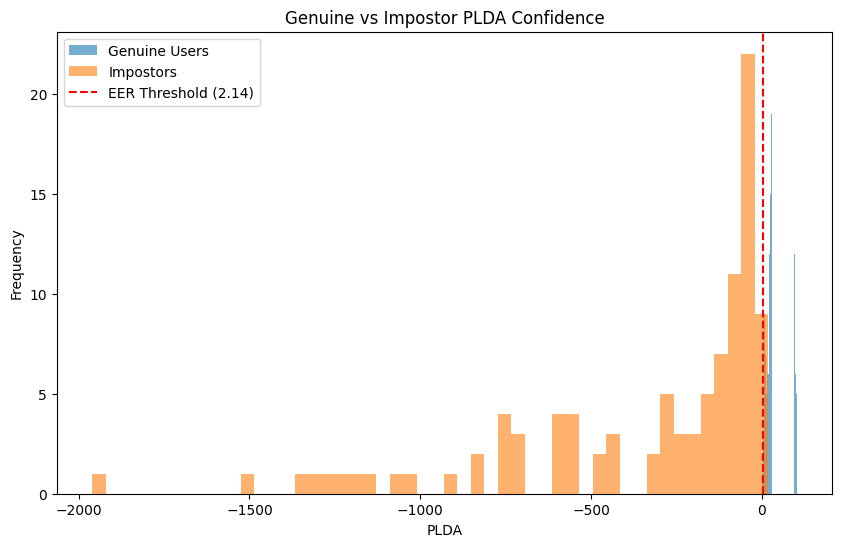

In [51]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.hist(genuine_scores, bins=50, alpha=0.6, label="Genuine Users")
plt.hist(impostor_scores, bins=50, alpha=0.6, label="Impostors")
plt.axvline(eer_threshold, color="red", linestyle="--", label=f"EER Threshold ({eer_threshold:.2f})")
plt.xlabel("PLDA")
plt.ylabel("Frequency")
plt.title("Genuine vs Impostor PLDA Confidence")
plt.legend()
plt.show()


PLDA con embeddings dell'ultimo layer stavolta, quindi non bottleneck

In [52]:
X_impostors = []
X_genuine = []
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Function to extract embeddings from model
def extract_embeddings_lastlayer(audio_path, model, device):
    """
    Extracts flattened MFCC embeddings from an audio file using the trained DNN model.
    """
    # Extract MFCC features using the same function as for training data
    features = exctract_embeddings(audio_path)
    # Flatten the features to match the DNN input shape
    features_flattened = features.flatten()
    # Convert to PyTorch tensor and add a batch dimension
    features_tensor = torch.tensor(features_flattened).unsqueeze(0).to(device) # Add batch dimension
    # Extract embeddings using the model's extract_embeddings method
    # The model's extract_embeddings method expects input shaped like (batch_size, input_dim)
    # which is (1, max_frames * n_mfcc) after flattening and unsqueezing
    embeddings = model(features_tensor)
    return embeddings.squeeze().cpu().detach().numpy() # Remove batch dimension and convert to numpy

for path in tqdm(unauthorized_audio_paths, desc="Extracting features"):
    embeddings = extract_embeddings_lastlayer(path, model, device)
    X_impostors.append(embeddings)


for path in tqdm(genuine_audio_paths, desc="Extracting features"):
    embeddings = extract_embeddings_lastlayer(path, model, device)
    X_genuine.append(embeddings)

X_impostors = np.array(X_impostors)
X_genuine = np.array(X_genuine)
print(f"Embeddings extracted: X_impostors shape: {X_impostors.shape}, X_genuine shape: {X_genuine.shape}")

Using device: cuda


Extracting features:   0%|          | 0/100 [00:00<?, ?it/s]<ipython-input-52-9b1096b5c2b4>:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  features_tensor = torch.tensor(features_flattened).unsqueeze(0).to(device) # Add batch dimension
Extracting features: 100%|██████████| 144/144 [00:02<00:00, 54.92it/s]

Embeddings extracted: X_impostors shape: (100, 10), X_genuine shape: (144, 10)


In [ ]:
from sklearn.mixture import GaussianMixture
import numpy as np

plda_model = GaussianMixture(n_components=2, covariance_type='full')
plda_model.fit(X_genuine)  # Train PLDA on genuine samples

# Compute likelihood ratios (PLDA Scores)
genuine_scores = plda_model.score_samples(X_genuine)
impostor_scores = plda_model.score_samples(X_impostors)

# Compute EER as before
y_true_eer = np.concatenate([np.ones(len(genuine_scores)), np.zeros(len(impostor_scores))])
y_scores_eer = np.concatenate([genuine_scores, impostor_scores])

fpr, tpr, thresholds = roc_curve(y_true_eer, y_scores_eer)
fnr = 1 - tpr
eer_idx = np.nanargmin(np.abs(fnr - fpr))
eer = fpr[eer_idx]
eer_threshold = thresholds[eer_idx]

print(f"\n🔐 Equal Error Rate (EER): {eer:.4f}")
print(f"Threshold at EER: {eer_threshold:.4f}")


🔐 Equal Error Rate (EER): 0.1300
Threshold at EER: -6.0590


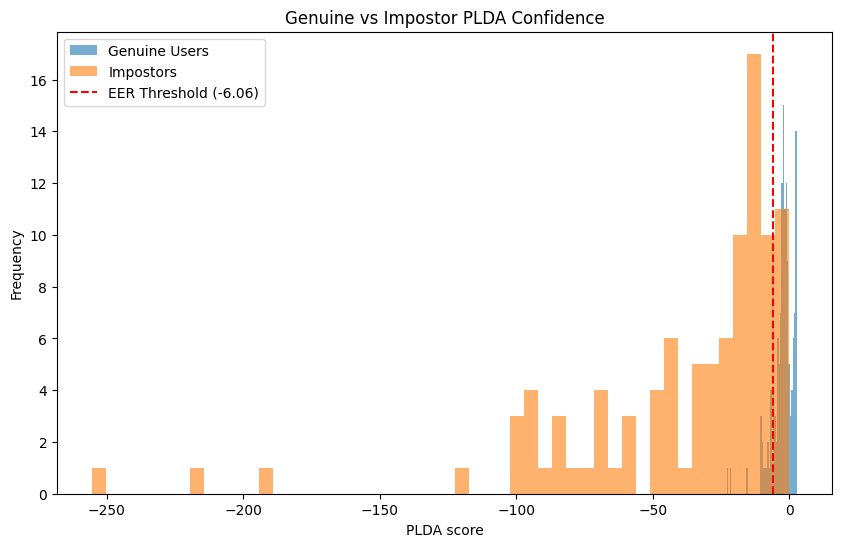

In [54]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.hist(genuine_scores, bins=50, alpha=0.6, label="Genuine Users")
plt.hist(impostor_scores, bins=50, alpha=0.6, label="Impostors")
plt.axvline(eer_threshold, color="red", linestyle="--", label=f"EER Threshold ({eer_threshold:.2f})")
plt.xlabel("PLDA score")
plt.ylabel("Frequency")
plt.title("Genuine vs Impostor PLDA Confidence")
plt.legend()
plt.show()


# Addestramento RNN

In [195]:
# prompt: free X_train and other params from memory

# Clear memory
del X_train
del y_train
del X_test
del y_test

import gc
gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()

In [196]:
import torch
torch.cuda.empty_cache()

In [205]:
X_train, y_train, X_test, y_test, speaker_to_index = load_data_rnn(speaker_split_data)

# Initialize model
input_dim = X_train.shape[2]  # Number of MFCC coefficients
hidden_dim = 128
num_layers = 2
num_classes = len(speaker_to_index)

model = SpeakerClassificationRNN(input_dim, hidden_dim, num_layers, num_classes)

# Define loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=2e-4)

# Parametri per early stopping
patience = 30  # Numero di epoche senza miglioramenti prima di fermarsi
best_f1 = 0
counter = 0
best_model_state = None

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

X_train = X_train.to(device)
y_train = y_train.to(device)
X_test = X_test.to(device)
y_test = y_test.to(device)
model.to(device)

<ipython-input-34-4067765ff4ba>:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  X_train.append(torch.tensor(mfccs))  # Keep sequential structure for RNN
<ipython-input-34-4067765ff4ba>:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  X_test.append(torch.tensor(test_mfccs))


torch.Size([1348, 1600, 25])
torch.Size([1348])
torch.Size([144, 1600, 25])
torch.Size([144])
Using device: cuda


SpeakerClassificationRNN(
  (rnn): LSTM(25, 128, num_layers=2, batch_first=True, bidirectional=True)
  (feature_extractor): Sequential(
    (0): Linear(in_features=256, out_features=64, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.3, inplace=False)
  )
  (classifier): Linear(in_features=64, out_features=10, bias=True)
)

In [206]:
total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Number of trainable parameters: {total_params}")

Number of trainable parameters: 571082


In [207]:
from torch.utils.data import Dataset, DataLoader # Import Dataset and DataLoader
class AudioDataset(Dataset):
    def __init__(self, X, y):
        """
        Args:
        - X: Tensor of input features (MFCCs, Spectrograms)
        - y: Corresponding labels.
        """
        self.X = X
        self.y = y

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

# Assuming X_train, y_train, X_test, y_test are Tensors
train_dataset = AudioDataset(X_train, y_train)
test_dataset = AudioDataset(X_test, y_test)

# Define DataLoader with batch size and shuffling
batch_size = 32  # Adjust based on memory constraints
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [ ]:
best_f1 = 0.0
patience = 30
counter = 0

for epoch in tqdm(range(300), desc="Training Progress", unit="epoch"):
    model.train()
    epoch_loss = 0
    train_preds, train_labels = [], []

    for X_batch, y_batch in train_loader:  # Loop through batches
        optimizer.zero_grad()
        output = model(X_batch)
        loss = criterion(output, y_batch)
        loss.backward()
        optimizer.step()
        preds = torch.softmax( output, dim=1)
        y_preds = torch.argmax(preds, dim=1)
        epoch_loss += loss.item()
        train_preds.extend(y_preds.cpu().numpy())
        train_labels.extend(y_batch.cpu().numpy())


    # Validation Step
    model.eval()
    with torch.no_grad():
        val_preds, val_labels = [], []
        val_loss_total = 0

        for X_batch, y_batch in test_loader:
            val_output = model(X_batch)
            val_loss = criterion(val_output, y_batch)
            val_loss_total += val_loss.item()

            val_preds.extend(val_output.argmax(dim=1).cpu().numpy())
            val_labels.extend(y_batch.cpu().numpy())

    # Compute validation metrics
    val_accuracy = accuracy_score(val_labels, val_preds)
    val_f1 = f1_score(val_labels, val_preds, average="macro")

    print(f"Epoch {epoch+1}, Val Loss: {val_loss_total:.4f}, Val Accuracy: {val_accuracy * 100:.2f}%, Val F1: {val_f1:.4f}")

    # Early Stopping Logic
    if val_f1 >= best_f1:
        best_f1 = val_f1
        print(f"Best F1-score saved at epoch {epoch+1}")
        best_model_state = model.state_dict()
        counter = 0
    else:
        counter += 1

Training Progress:   0%|          | 1/300 [00:03<18:23,  3.69s/epoch]

Epoch 1, Val Loss: 11.4976, Val Accuracy: 11.11%, Val F1: 0.0200
Best F1-score saved at epoch 1


Training Progress:   1%|          | 2/300 [00:07<18:03,  3.63s/epoch]

Epoch 2, Val Loss: 11.5015, Val Accuracy: 11.81%, Val F1: 0.0323
Best F1-score saved at epoch 2


Training Progress:   1%|          | 3/300 [00:10<17:53,  3.61s/epoch]

Epoch 3, Val Loss: 11.5021, Val Accuracy: 11.11%, Val F1: 0.0204


Training Progress:   1%|▏         | 4/300 [00:14<17:47,  3.60s/epoch]

Epoch 4, Val Loss: 11.4991, Val Accuracy: 11.81%, Val F1: 0.0299


Training Progress:   2%|▏         | 5/300 [00:18<17:42,  3.60s/epoch]

Epoch 5, Val Loss: 11.5047, Val Accuracy: 11.81%, Val F1: 0.0334
Best F1-score saved at epoch 5


Training Progress:   2%|▏         | 6/300 [00:21<17:38,  3.60s/epoch]

Epoch 6, Val Loss: 11.5125, Val Accuracy: 10.42%, Val F1: 0.0321


Training Progress:   2%|▏         | 7/300 [00:25<17:35,  3.60s/epoch]

Epoch 7, Val Loss: 11.4889, Val Accuracy: 10.42%, Val F1: 0.0308


Training Progress:   3%|▎         | 8/300 [00:28<17:35,  3.61s/epoch]

Epoch 8, Val Loss: 11.6132, Val Accuracy: 11.11%, Val F1: 0.0401
Best F1-score saved at epoch 8


Training Progress:   3%|▎         | 9/300 [00:32<17:40,  3.64s/epoch]

Epoch 9, Val Loss: 11.4086, Val Accuracy: 11.81%, Val F1: 0.0338


Training Progress:   3%|▎         | 10/300 [00:36<17:45,  3.68s/epoch]

Epoch 10, Val Loss: 11.3716, Val Accuracy: 15.28%, Val F1: 0.0898
Best F1-score saved at epoch 10


Training Progress:   4%|▎         | 11/300 [00:40<17:51,  3.71s/epoch]

Epoch 11, Val Loss: 11.3400, Val Accuracy: 14.58%, Val F1: 0.0657


Training Progress:   4%|▍         | 12/300 [00:43<17:57,  3.74s/epoch]

Epoch 12, Val Loss: 11.1519, Val Accuracy: 19.44%, Val F1: 0.1288
Best F1-score saved at epoch 12


Training Progress:   4%|▍         | 13/300 [00:47<17:58,  3.76s/epoch]

Epoch 13, Val Loss: 10.4574, Val Accuracy: 28.47%, Val F1: 0.2546
Best F1-score saved at epoch 13


Training Progress:   5%|▍         | 14/300 [00:51<17:55,  3.76s/epoch]

Epoch 14, Val Loss: 9.1851, Val Accuracy: 27.78%, Val F1: 0.1521


Training Progress:   5%|▌         | 15/300 [00:55<17:51,  3.76s/epoch]

Epoch 15, Val Loss: 10.1360, Val Accuracy: 20.14%, Val F1: 0.1024


Training Progress:   5%|▌         | 16/300 [00:59<17:47,  3.76s/epoch]

Epoch 16, Val Loss: 8.7844, Val Accuracy: 36.11%, Val F1: 0.2547
Best F1-score saved at epoch 16


Training Progress:   6%|▌         | 17/300 [01:02<17:43,  3.76s/epoch]

Epoch 17, Val Loss: 9.7317, Val Accuracy: 27.78%, Val F1: 0.2173


Training Progress:   6%|▌         | 18/300 [01:06<17:36,  3.75s/epoch]

Epoch 18, Val Loss: 9.4265, Val Accuracy: 41.67%, Val F1: 0.3206
Best F1-score saved at epoch 18


Training Progress:   6%|▋         | 19/300 [01:10<17:31,  3.74s/epoch]

Epoch 19, Val Loss: 8.0334, Val Accuracy: 43.75%, Val F1: 0.3469
Best F1-score saved at epoch 19


Training Progress:   7%|▋         | 20/300 [01:13<17:26,  3.74s/epoch]

Epoch 20, Val Loss: 8.5953, Val Accuracy: 31.94%, Val F1: 0.2588


Training Progress:   7%|▋         | 21/300 [01:17<17:19,  3.73s/epoch]

Epoch 21, Val Loss: 7.1781, Val Accuracy: 39.58%, Val F1: 0.3016


Training Progress:   7%|▋         | 22/300 [01:21<17:16,  3.73s/epoch]

Epoch 22, Val Loss: 8.3240, Val Accuracy: 41.67%, Val F1: 0.3360


Training Progress:   8%|▊         | 23/300 [01:25<17:11,  3.72s/epoch]

Epoch 23, Val Loss: 7.0843, Val Accuracy: 48.61%, Val F1: 0.3989
Best F1-score saved at epoch 23


Training Progress:   8%|▊         | 24/300 [01:28<17:06,  3.72s/epoch]

Epoch 24, Val Loss: 8.0702, Val Accuracy: 43.75%, Val F1: 0.3409


Training Progress:   8%|▊         | 25/300 [01:32<17:04,  3.73s/epoch]

Epoch 25, Val Loss: 6.6180, Val Accuracy: 50.00%, Val F1: 0.4432
Best F1-score saved at epoch 25


Training Progress:   9%|▊         | 26/300 [01:36<16:59,  3.72s/epoch]

Epoch 26, Val Loss: 7.1657, Val Accuracy: 47.92%, Val F1: 0.4149


Training Progress:   9%|▉         | 27/300 [01:39<16:54,  3.72s/epoch]

Epoch 27, Val Loss: 6.3932, Val Accuracy: 54.86%, Val F1: 0.5079
Best F1-score saved at epoch 27


Training Progress:   9%|▉         | 28/300 [01:43<16:51,  3.72s/epoch]

Epoch 28, Val Loss: 5.8008, Val Accuracy: 60.42%, Val F1: 0.5458
Best F1-score saved at epoch 28


Training Progress:  10%|▉         | 29/300 [01:47<16:48,  3.72s/epoch]

Epoch 29, Val Loss: 6.3772, Val Accuracy: 56.94%, Val F1: 0.4989


Training Progress:  10%|█         | 30/300 [01:51<16:43,  3.72s/epoch]

Epoch 30, Val Loss: 5.6757, Val Accuracy: 59.03%, Val F1: 0.5547
Best F1-score saved at epoch 30


Training Progress:  10%|█         | 31/300 [01:54<16:41,  3.72s/epoch]

Epoch 31, Val Loss: 5.8881, Val Accuracy: 56.25%, Val F1: 0.5126


Training Progress:  11%|█         | 32/300 [01:58<16:40,  3.73s/epoch]

Epoch 32, Val Loss: 5.4697, Val Accuracy: 63.89%, Val F1: 0.5993
Best F1-score saved at epoch 32


Training Progress:  11%|█         | 33/300 [02:02<16:37,  3.73s/epoch]

Epoch 33, Val Loss: 6.2563, Val Accuracy: 50.00%, Val F1: 0.4582


Training Progress:  11%|█▏        | 34/300 [02:06<16:34,  3.74s/epoch]

Epoch 34, Val Loss: 6.4537, Val Accuracy: 49.31%, Val F1: 0.4535


Training Progress:  12%|█▏        | 35/300 [02:09<16:31,  3.74s/epoch]

Epoch 35, Val Loss: 5.6170, Val Accuracy: 61.11%, Val F1: 0.5541


Training Progress:  12%|█▏        | 36/300 [02:13<16:27,  3.74s/epoch]

Epoch 36, Val Loss: 4.7365, Val Accuracy: 68.75%, Val F1: 0.6439
Best F1-score saved at epoch 36


Training Progress:  12%|█▏        | 37/300 [02:17<16:23,  3.74s/epoch]

Epoch 37, Val Loss: 5.1198, Val Accuracy: 67.36%, Val F1: 0.6508
Best F1-score saved at epoch 37


Training Progress:  13%|█▎        | 38/300 [02:21<16:18,  3.74s/epoch]

Epoch 38, Val Loss: 4.9283, Val Accuracy: 65.28%, Val F1: 0.5972


Training Progress:  13%|█▎        | 39/300 [02:24<16:14,  3.73s/epoch]

Epoch 39, Val Loss: 4.2038, Val Accuracy: 70.14%, Val F1: 0.6621
Best F1-score saved at epoch 39


Training Progress:  13%|█▎        | 40/300 [02:28<16:10,  3.73s/epoch]

Epoch 40, Val Loss: 4.1162, Val Accuracy: 75.00%, Val F1: 0.7168
Best F1-score saved at epoch 40


Training Progress:  14%|█▎        | 41/300 [02:32<16:06,  3.73s/epoch]

Epoch 41, Val Loss: 3.5561, Val Accuracy: 81.25%, Val F1: 0.7908
Best F1-score saved at epoch 41


Training Progress:  14%|█▍        | 42/300 [02:35<16:02,  3.73s/epoch]

Epoch 42, Val Loss: 3.1764, Val Accuracy: 81.94%, Val F1: 0.8061
Best F1-score saved at epoch 42


Training Progress:  14%|█▍        | 43/300 [02:39<15:57,  3.73s/epoch]

Epoch 43, Val Loss: 3.2893, Val Accuracy: 77.78%, Val F1: 0.7463


Training Progress:  15%|█▍        | 44/300 [02:43<15:52,  3.72s/epoch]

Epoch 44, Val Loss: 3.1796, Val Accuracy: 75.69%, Val F1: 0.7423


Training Progress:  15%|█▌        | 45/300 [02:47<15:49,  3.72s/epoch]

Epoch 45, Val Loss: 3.5440, Val Accuracy: 80.56%, Val F1: 0.7931


Training Progress:  15%|█▌        | 46/300 [02:50<15:46,  3.73s/epoch]

Epoch 46, Val Loss: 2.6484, Val Accuracy: 85.42%, Val F1: 0.8432
Best F1-score saved at epoch 46


Training Progress:  16%|█▌        | 47/300 [02:54<15:42,  3.73s/epoch]

Epoch 47, Val Loss: 2.7921, Val Accuracy: 83.33%, Val F1: 0.8159


Training Progress:  16%|█▌        | 48/300 [02:58<15:39,  3.73s/epoch]

Epoch 48, Val Loss: 2.9960, Val Accuracy: 84.72%, Val F1: 0.8341


Training Progress:  16%|█▋        | 49/300 [03:02<15:35,  3.73s/epoch]

Epoch 49, Val Loss: 2.2853, Val Accuracy: 90.97%, Val F1: 0.9048
Best F1-score saved at epoch 49


Training Progress:  17%|█▋        | 50/300 [03:05<15:30,  3.72s/epoch]

Epoch 50, Val Loss: 2.5368, Val Accuracy: 90.28%, Val F1: 0.8974


Training Progress:  17%|█▋        | 51/300 [03:09<15:27,  3.73s/epoch]

Epoch 51, Val Loss: 2.6693, Val Accuracy: 82.64%, Val F1: 0.8057


Training Progress:  17%|█▋        | 52/300 [03:13<15:23,  3.72s/epoch]

Epoch 52, Val Loss: 2.3118, Val Accuracy: 87.50%, Val F1: 0.8677


Training Progress:  18%|█▊        | 53/300 [03:16<15:18,  3.72s/epoch]

Epoch 53, Val Loss: 2.3433, Val Accuracy: 88.19%, Val F1: 0.8714


Training Progress:  18%|█▊        | 54/300 [03:20<15:15,  3.72s/epoch]

Epoch 54, Val Loss: 2.1784, Val Accuracy: 88.19%, Val F1: 0.8766


Training Progress:  18%|█▊        | 55/300 [03:24<15:12,  3.72s/epoch]

Epoch 55, Val Loss: 1.9904, Val Accuracy: 93.06%, Val F1: 0.9278
Best F1-score saved at epoch 55


Training Progress:  19%|█▊        | 56/300 [03:28<15:07,  3.72s/epoch]

Epoch 56, Val Loss: 2.5308, Val Accuracy: 88.19%, Val F1: 0.8748


Training Progress:  19%|█▉        | 57/300 [03:31<15:05,  3.73s/epoch]

Epoch 57, Val Loss: 2.3289, Val Accuracy: 88.89%, Val F1: 0.8797


Training Progress:  19%|█▉        | 58/300 [03:35<15:03,  3.73s/epoch]

Epoch 58, Val Loss: 3.4696, Val Accuracy: 75.00%, Val F1: 0.7497


Training Progress:  20%|█▉        | 59/300 [03:39<14:59,  3.73s/epoch]

Epoch 59, Val Loss: 3.3241, Val Accuracy: 82.64%, Val F1: 0.8233


Training Progress:  20%|██        | 60/300 [03:43<14:56,  3.74s/epoch]

Epoch 60, Val Loss: 2.9546, Val Accuracy: 82.64%, Val F1: 0.8140


Training Progress:  20%|██        | 61/300 [03:46<14:53,  3.74s/epoch]

Epoch 61, Val Loss: 2.2166, Val Accuracy: 87.50%, Val F1: 0.8705


Training Progress:  21%|██        | 62/300 [03:50<14:49,  3.74s/epoch]

Epoch 62, Val Loss: 1.7052, Val Accuracy: 90.28%, Val F1: 0.8973


Training Progress:  21%|██        | 63/300 [03:54<14:44,  3.73s/epoch]

Epoch 63, Val Loss: 1.3110, Val Accuracy: 94.44%, Val F1: 0.9417
Best F1-score saved at epoch 63


Training Progress:  21%|██▏       | 64/300 [03:57<14:40,  3.73s/epoch]

Epoch 64, Val Loss: 1.4960, Val Accuracy: 93.06%, Val F1: 0.9282


Training Progress:  22%|██▏       | 65/300 [04:01<14:36,  3.73s/epoch]

Epoch 65, Val Loss: 1.4962, Val Accuracy: 91.67%, Val F1: 0.9125


Training Progress:  22%|██▏       | 66/300 [04:05<14:33,  3.73s/epoch]

Epoch 66, Val Loss: 1.3271, Val Accuracy: 92.36%, Val F1: 0.9198


Training Progress:  22%|██▏       | 67/300 [04:09<14:29,  3.73s/epoch]

Epoch 67, Val Loss: 1.0799, Val Accuracy: 93.06%, Val F1: 0.9281


Training Progress:  23%|██▎       | 68/300 [04:12<14:25,  3.73s/epoch]

Epoch 68, Val Loss: 1.1435, Val Accuracy: 92.36%, Val F1: 0.9214


Training Progress:  23%|██▎       | 69/300 [04:16<14:21,  3.73s/epoch]

Epoch 69, Val Loss: 1.0124, Val Accuracy: 94.44%, Val F1: 0.9416


Training Progress:  23%|██▎       | 70/300 [04:20<14:17,  3.73s/epoch]

Epoch 70, Val Loss: 0.9934, Val Accuracy: 94.44%, Val F1: 0.9410


Training Progress:  24%|██▎       | 71/300 [04:24<14:14,  3.73s/epoch]

Epoch 71, Val Loss: 0.8627, Val Accuracy: 94.44%, Val F1: 0.9410


Training Progress:  24%|██▍       | 72/300 [04:27<14:11,  3.73s/epoch]

Epoch 72, Val Loss: 1.1847, Val Accuracy: 93.06%, Val F1: 0.9289


Training Progress:  24%|██▍       | 73/300 [04:31<14:07,  3.73s/epoch]

Epoch 73, Val Loss: 0.9384, Val Accuracy: 95.83%, Val F1: 0.9575
Best F1-score saved at epoch 73


Training Progress:  25%|██▍       | 74/300 [04:35<14:07,  3.75s/epoch]

Epoch 74, Val Loss: 0.9438, Val Accuracy: 94.44%, Val F1: 0.9441


Training Progress:  25%|██▌       | 75/300 [04:39<14:03,  3.75s/epoch]

Epoch 75, Val Loss: 0.9611, Val Accuracy: 95.14%, Val F1: 0.9505


Training Progress:  25%|██▌       | 76/300 [04:42<13:58,  3.74s/epoch]

Epoch 76, Val Loss: 1.0900, Val Accuracy: 91.67%, Val F1: 0.9117


Training Progress:  26%|██▌       | 77/300 [04:46<13:53,  3.74s/epoch]

Epoch 77, Val Loss: 0.8716, Val Accuracy: 95.14%, Val F1: 0.9496


Training Progress:  26%|██▌       | 78/300 [04:50<13:49,  3.73s/epoch]

Epoch 78, Val Loss: 0.8120, Val Accuracy: 94.44%, Val F1: 0.9419


Training Progress:  26%|██▋       | 79/300 [04:54<13:45,  3.73s/epoch]

Epoch 79, Val Loss: 0.8523, Val Accuracy: 93.75%, Val F1: 0.9359


Training Progress:  27%|██▋       | 80/300 [04:57<13:40,  3.73s/epoch]

Epoch 80, Val Loss: 0.9937, Val Accuracy: 93.75%, Val F1: 0.9352


Training Progress:  27%|██▋       | 81/300 [05:01<13:37,  3.73s/epoch]

Epoch 81, Val Loss: 0.6749, Val Accuracy: 95.83%, Val F1: 0.9573


Training Progress:  27%|██▋       | 82/300 [05:05<13:33,  3.73s/epoch]

Epoch 82, Val Loss: 1.0120, Val Accuracy: 94.44%, Val F1: 0.9415


Training Progress:  28%|██▊       | 83/300 [05:08<13:30,  3.74s/epoch]

Epoch 83, Val Loss: 0.8165, Val Accuracy: 95.14%, Val F1: 0.9490


Training Progress:  28%|██▊       | 84/300 [05:12<13:25,  3.73s/epoch]

Epoch 84, Val Loss: 0.5663, Val Accuracy: 95.83%, Val F1: 0.9571


Training Progress:  28%|██▊       | 85/300 [05:16<13:21,  3.73s/epoch]

Epoch 85, Val Loss: 0.5752, Val Accuracy: 95.83%, Val F1: 0.9567


Training Progress:  29%|██▊       | 86/300 [05:20<13:17,  3.73s/epoch]

Epoch 86, Val Loss: 0.7947, Val Accuracy: 93.75%, Val F1: 0.9370


Training Progress:  29%|██▉       | 87/300 [05:23<13:13,  3.73s/epoch]

Epoch 87, Val Loss: 0.6163, Val Accuracy: 94.44%, Val F1: 0.9434


Training Progress:  29%|██▉       | 88/300 [05:27<13:10,  3.73s/epoch]

Epoch 88, Val Loss: 0.5698, Val Accuracy: 95.14%, Val F1: 0.9498


Training Progress:  30%|██▉       | 89/300 [05:31<13:06,  3.73s/epoch]

Epoch 89, Val Loss: 0.6421, Val Accuracy: 94.44%, Val F1: 0.9439


Training Progress:  30%|███       | 90/300 [05:35<13:01,  3.72s/epoch]

Epoch 90, Val Loss: 0.5008, Val Accuracy: 96.53%, Val F1: 0.9629
Best F1-score saved at epoch 90


Training Progress:  30%|███       | 91/300 [05:38<12:57,  3.72s/epoch]

Epoch 91, Val Loss: 0.5146, Val Accuracy: 95.83%, Val F1: 0.9561


Training Progress:  31%|███       | 92/300 [05:42<12:54,  3.72s/epoch]

Epoch 92, Val Loss: 0.4874, Val Accuracy: 95.83%, Val F1: 0.9559


Training Progress:  31%|███       | 93/300 [05:46<12:50,  3.72s/epoch]

Epoch 93, Val Loss: 0.5390, Val Accuracy: 96.53%, Val F1: 0.9629
Best F1-score saved at epoch 93


Training Progress:  31%|███▏      | 94/300 [05:49<12:46,  3.72s/epoch]

Epoch 94, Val Loss: 0.6176, Val Accuracy: 95.14%, Val F1: 0.9494


Training Progress:  32%|███▏      | 95/300 [05:53<12:42,  3.72s/epoch]

Epoch 95, Val Loss: 0.7575, Val Accuracy: 94.44%, Val F1: 0.9411


Training Progress:  32%|███▏      | 96/300 [05:57<12:38,  3.72s/epoch]

Epoch 96, Val Loss: 0.6367, Val Accuracy: 95.83%, Val F1: 0.9567


Training Progress:  32%|███▏      | 97/300 [06:01<12:36,  3.73s/epoch]

Epoch 97, Val Loss: 0.9184, Val Accuracy: 93.75%, Val F1: 0.9343


Training Progress:  33%|███▎      | 98/300 [06:04<12:33,  3.73s/epoch]

Epoch 98, Val Loss: 1.0474, Val Accuracy: 93.75%, Val F1: 0.9332


Training Progress:  33%|███▎      | 99/300 [06:08<12:29,  3.73s/epoch]

Epoch 99, Val Loss: 0.6499, Val Accuracy: 95.14%, Val F1: 0.9487


Training Progress:  33%|███▎      | 100/300 [06:12<12:24,  3.72s/epoch]

Epoch 100, Val Loss: 0.7112, Val Accuracy: 95.14%, Val F1: 0.9496


Training Progress:  34%|███▎      | 101/300 [06:15<12:21,  3.72s/epoch]

Epoch 101, Val Loss: 0.4896, Val Accuracy: 95.83%, Val F1: 0.9575


Training Progress:  34%|███▍      | 102/300 [06:19<12:17,  3.72s/epoch]

Epoch 102, Val Loss: 0.4197, Val Accuracy: 97.22%, Val F1: 0.9715
Best F1-score saved at epoch 102


Training Progress:  34%|███▍      | 103/300 [06:23<12:13,  3.72s/epoch]

Epoch 103, Val Loss: 0.4113, Val Accuracy: 97.22%, Val F1: 0.9712


Training Progress:  35%|███▍      | 104/300 [06:27<12:10,  3.73s/epoch]

Epoch 104, Val Loss: 0.6571, Val Accuracy: 96.53%, Val F1: 0.9637


Training Progress:  35%|███▌      | 105/300 [06:30<12:06,  3.72s/epoch]

Epoch 105, Val Loss: 0.7773, Val Accuracy: 95.83%, Val F1: 0.9562


Training Progress:  35%|███▌      | 106/300 [06:34<12:01,  3.72s/epoch]

Epoch 106, Val Loss: 0.5604, Val Accuracy: 96.53%, Val F1: 0.9632


Training Progress:  36%|███▌      | 107/300 [06:38<11:57,  3.72s/epoch]

Epoch 107, Val Loss: 0.6032, Val Accuracy: 96.53%, Val F1: 0.9632


Training Progress:  36%|███▌      | 108/300 [06:42<11:54,  3.72s/epoch]

Epoch 108, Val Loss: 0.5353, Val Accuracy: 95.83%, Val F1: 0.9562


Training Progress:  36%|███▋      | 109/300 [06:45<11:50,  3.72s/epoch]

Epoch 109, Val Loss: 0.5454, Val Accuracy: 95.83%, Val F1: 0.9562


Training Progress:  37%|███▋      | 110/300 [06:49<11:47,  3.72s/epoch]

Epoch 110, Val Loss: 0.6064, Val Accuracy: 95.83%, Val F1: 0.9562


Training Progress:  37%|███▋      | 111/300 [06:53<11:43,  3.72s/epoch]

Epoch 111, Val Loss: 0.5546, Val Accuracy: 95.83%, Val F1: 0.9562


Training Progress:  37%|███▋      | 112/300 [06:56<11:39,  3.72s/epoch]

Epoch 112, Val Loss: 0.5763, Val Accuracy: 95.83%, Val F1: 0.9562


Training Progress:  38%|███▊      | 113/300 [07:00<11:35,  3.72s/epoch]

Epoch 113, Val Loss: 0.4437, Val Accuracy: 97.22%, Val F1: 0.9699


Training Progress:  38%|███▊      | 114/300 [07:04<11:32,  3.72s/epoch]

Epoch 114, Val Loss: 0.3645, Val Accuracy: 97.22%, Val F1: 0.9706


Training Progress:  38%|███▊      | 115/300 [07:08<11:29,  3.72s/epoch]

Epoch 115, Val Loss: 0.3555, Val Accuracy: 97.22%, Val F1: 0.9706


Training Progress:  39%|███▊      | 116/300 [07:11<11:25,  3.72s/epoch]

Epoch 116, Val Loss: 0.4324, Val Accuracy: 96.53%, Val F1: 0.9619


Training Progress:  39%|███▉      | 117/300 [07:15<11:21,  3.73s/epoch]

Epoch 117, Val Loss: 0.3104, Val Accuracy: 98.61%, Val F1: 0.9852
Best F1-score saved at epoch 117


Training Progress:  39%|███▉      | 118/300 [07:19<11:18,  3.73s/epoch]

Epoch 118, Val Loss: 0.4324, Val Accuracy: 97.22%, Val F1: 0.9718


Training Progress:  40%|███▉      | 119/300 [07:23<11:15,  3.73s/epoch]

Epoch 119, Val Loss: 0.3951, Val Accuracy: 96.53%, Val F1: 0.9640


Training Progress:  40%|████      | 120/300 [07:26<11:11,  3.73s/epoch]

Epoch 120, Val Loss: 0.3798, Val Accuracy: 97.92%, Val F1: 0.9782


Training Progress:  40%|████      | 121/300 [07:30<11:07,  3.73s/epoch]

Epoch 121, Val Loss: 0.3531, Val Accuracy: 97.92%, Val F1: 0.9778


Training Progress:  41%|████      | 122/300 [07:34<11:03,  3.73s/epoch]

Epoch 122, Val Loss: 0.4996, Val Accuracy: 97.22%, Val F1: 0.9707


Training Progress:  41%|████      | 123/300 [07:37<10:59,  3.73s/epoch]

Epoch 123, Val Loss: 0.3733, Val Accuracy: 98.61%, Val F1: 0.9852
Best F1-score saved at epoch 123


Training Progress:  41%|████▏     | 124/300 [07:41<10:56,  3.73s/epoch]

Epoch 124, Val Loss: 0.3900, Val Accuracy: 97.92%, Val F1: 0.9787


Training Progress:  42%|████▏     | 125/300 [07:45<10:52,  3.73s/epoch]

Epoch 125, Val Loss: 0.3496, Val Accuracy: 97.92%, Val F1: 0.9787


Training Progress:  42%|████▏     | 126/300 [07:49<10:48,  3.73s/epoch]

Epoch 126, Val Loss: 0.3305, Val Accuracy: 97.92%, Val F1: 0.9787


Training Progress:  42%|████▏     | 127/300 [07:52<10:44,  3.73s/epoch]

Epoch 127, Val Loss: 0.4718, Val Accuracy: 97.22%, Val F1: 0.9707


Training Progress:  43%|████▎     | 128/300 [07:56<10:41,  3.73s/epoch]

Epoch 128, Val Loss: 0.4595, Val Accuracy: 96.53%, Val F1: 0.9640


Training Progress:  43%|████▎     | 129/300 [08:00<10:37,  3.73s/epoch]

Epoch 129, Val Loss: 0.4039, Val Accuracy: 97.22%, Val F1: 0.9707


Training Progress:  43%|████▎     | 130/300 [08:04<10:34,  3.73s/epoch]

Epoch 130, Val Loss: 0.7018, Val Accuracy: 95.14%, Val F1: 0.9490


Training Progress:  44%|████▎     | 131/300 [08:07<10:29,  3.73s/epoch]

Epoch 131, Val Loss: 0.5628, Val Accuracy: 95.83%, Val F1: 0.9561


Training Progress:  44%|████▍     | 132/300 [08:11<10:26,  3.73s/epoch]

Epoch 132, Val Loss: 0.5299, Val Accuracy: 96.53%, Val F1: 0.9640


Training Progress:  44%|████▍     | 133/300 [08:15<10:22,  3.73s/epoch]

Epoch 133, Val Loss: 0.5394, Val Accuracy: 96.53%, Val F1: 0.9640


Training Progress:  45%|████▍     | 134/300 [08:18<10:18,  3.73s/epoch]

Epoch 134, Val Loss: 0.5142, Val Accuracy: 96.53%, Val F1: 0.9646


Training Progress:  45%|████▌     | 135/300 [08:22<10:14,  3.73s/epoch]

Epoch 135, Val Loss: 0.5027, Val Accuracy: 96.53%, Val F1: 0.9640


Training Progress:  45%|████▌     | 136/300 [08:26<10:11,  3.73s/epoch]

Epoch 136, Val Loss: 0.5276, Val Accuracy: 96.53%, Val F1: 0.9640


Training Progress:  46%|████▌     | 137/300 [08:30<10:07,  3.73s/epoch]

Epoch 137, Val Loss: 0.5470, Val Accuracy: 96.53%, Val F1: 0.9640


Training Progress:  46%|████▌     | 138/300 [08:33<10:03,  3.72s/epoch]

Epoch 138, Val Loss: 0.5558, Val Accuracy: 96.53%, Val F1: 0.9640


Training Progress:  46%|████▋     | 139/300 [08:37<10:00,  3.73s/epoch]

Epoch 139, Val Loss: 0.5648, Val Accuracy: 96.53%, Val F1: 0.9646


Training Progress:  47%|████▋     | 140/300 [08:41<10:00,  3.75s/epoch]

Epoch 140, Val Loss: 0.5680, Val Accuracy: 95.83%, Val F1: 0.9575


Training Progress:  47%|████▋     | 141/300 [08:45<09:56,  3.75s/epoch]

Epoch 141, Val Loss: 0.5374, Val Accuracy: 95.83%, Val F1: 0.9575


Training Progress:  47%|████▋     | 142/300 [08:48<09:52,  3.75s/epoch]

Epoch 142, Val Loss: 0.5459, Val Accuracy: 95.83%, Val F1: 0.9575


Training Progress:  48%|████▊     | 143/300 [08:52<09:47,  3.74s/epoch]

Epoch 143, Val Loss: 0.5945, Val Accuracy: 95.83%, Val F1: 0.9571


Training Progress:  48%|████▊     | 144/300 [08:56<09:43,  3.74s/epoch]

Epoch 144, Val Loss: 0.5310, Val Accuracy: 95.83%, Val F1: 0.9571


Training Progress:  48%|████▊     | 145/300 [09:00<09:40,  3.75s/epoch]

Epoch 145, Val Loss: 0.4915, Val Accuracy: 96.53%, Val F1: 0.9638


Training Progress:  49%|████▊     | 146/300 [09:03<09:37,  3.75s/epoch]

Epoch 146, Val Loss: 0.5062, Val Accuracy: 96.53%, Val F1: 0.9638


Training Progress:  49%|████▉     | 147/300 [09:07<09:33,  3.75s/epoch]

Epoch 147, Val Loss: 0.5651, Val Accuracy: 95.83%, Val F1: 0.9571


Training Progress:  49%|████▉     | 148/300 [09:11<09:29,  3.75s/epoch]

Epoch 148, Val Loss: 0.5203, Val Accuracy: 96.53%, Val F1: 0.9642


Training Progress:  50%|████▉     | 149/300 [09:15<09:24,  3.74s/epoch]

Epoch 149, Val Loss: 0.5264, Val Accuracy: 96.53%, Val F1: 0.9642


Training Progress:  50%|█████     | 150/300 [09:18<09:20,  3.74s/epoch]

Epoch 150, Val Loss: 0.5160, Val Accuracy: 95.83%, Val F1: 0.9575


Training Progress:  50%|█████     | 151/300 [09:22<09:17,  3.74s/epoch]

Epoch 151, Val Loss: 0.5445, Val Accuracy: 95.83%, Val F1: 0.9571


Training Progress:  51%|█████     | 152/300 [09:26<09:12,  3.73s/epoch]

Epoch 152, Val Loss: 0.5104, Val Accuracy: 96.53%, Val F1: 0.9638


Training Progress:  51%|█████     | 153/300 [09:30<09:09,  3.74s/epoch]

Epoch 153, Val Loss: 0.5718, Val Accuracy: 97.22%, Val F1: 0.9705


Training Progress:  51%|█████▏    | 154/300 [09:33<09:04,  3.73s/epoch]

Epoch 154, Val Loss: 0.6298, Val Accuracy: 97.22%, Val F1: 0.9709


Training Progress:  52%|█████▏    | 155/300 [09:37<09:00,  3.73s/epoch]

Epoch 155, Val Loss: 0.5291, Val Accuracy: 97.22%, Val F1: 0.9705


Training Progress:  52%|█████▏    | 156/300 [09:41<08:57,  3.73s/epoch]

Epoch 156, Val Loss: 0.5606, Val Accuracy: 97.22%, Val F1: 0.9705


Training Progress:  52%|█████▏    | 157/300 [09:44<08:53,  3.73s/epoch]

Epoch 157, Val Loss: 0.5670, Val Accuracy: 97.22%, Val F1: 0.9705


Training Progress:  53%|█████▎    | 158/300 [09:48<08:49,  3.73s/epoch]

Epoch 158, Val Loss: 0.5710, Val Accuracy: 96.53%, Val F1: 0.9633


Training Progress:  53%|█████▎    | 159/300 [09:52<08:46,  3.73s/epoch]

Epoch 159, Val Loss: 0.5520, Val Accuracy: 97.22%, Val F1: 0.9705


Training Progress:  53%|█████▎    | 160/300 [09:56<08:41,  3.73s/epoch]

Epoch 160, Val Loss: 0.5677, Val Accuracy: 96.53%, Val F1: 0.9633


Training Progress:  54%|█████▎    | 161/300 [09:59<08:38,  3.73s/epoch]

Epoch 161, Val Loss: 0.5697, Val Accuracy: 97.22%, Val F1: 0.9705


Training Progress:  54%|█████▍    | 162/300 [10:03<08:34,  3.73s/epoch]

Epoch 162, Val Loss: 0.5713, Val Accuracy: 97.22%, Val F1: 0.9705


Training Progress:  54%|█████▍    | 163/300 [10:07<08:31,  3.73s/epoch]

Epoch 163, Val Loss: 0.6865, Val Accuracy: 96.53%, Val F1: 0.9633


Training Progress:  55%|█████▍    | 164/300 [10:11<08:27,  3.73s/epoch]

Epoch 164, Val Loss: 0.6714, Val Accuracy: 96.53%, Val F1: 0.9633


Training Progress:  55%|█████▌    | 165/300 [10:14<08:23,  3.73s/epoch]

Epoch 165, Val Loss: 0.6567, Val Accuracy: 96.53%, Val F1: 0.9633


Training Progress:  55%|█████▌    | 166/300 [10:18<08:19,  3.73s/epoch]

Epoch 166, Val Loss: 0.6759, Val Accuracy: 96.53%, Val F1: 0.9633


Training Progress:  56%|█████▌    | 167/300 [10:22<08:15,  3.72s/epoch]

Epoch 167, Val Loss: 0.6808, Val Accuracy: 96.53%, Val F1: 0.9633


Training Progress:  56%|█████▌    | 168/300 [10:25<08:11,  3.72s/epoch]

Epoch 168, Val Loss: 0.6642, Val Accuracy: 96.53%, Val F1: 0.9633


Training Progress:  56%|█████▋    | 169/300 [10:29<08:07,  3.72s/epoch]

Epoch 169, Val Loss: 0.6464, Val Accuracy: 96.53%, Val F1: 0.9633


Training Progress:  57%|█████▋    | 170/300 [10:33<08:03,  3.72s/epoch]

Epoch 170, Val Loss: 0.6133, Val Accuracy: 96.53%, Val F1: 0.9633


Training Progress:  57%|█████▋    | 171/300 [10:37<08:00,  3.72s/epoch]

Epoch 171, Val Loss: 0.6142, Val Accuracy: 96.53%, Val F1: 0.9633


Training Progress:  57%|█████▋    | 172/300 [10:40<07:56,  3.72s/epoch]

Epoch 172, Val Loss: 0.5948, Val Accuracy: 96.53%, Val F1: 0.9633


Training Progress:  58%|█████▊    | 173/300 [10:44<07:53,  3.73s/epoch]

Epoch 173, Val Loss: 0.5994, Val Accuracy: 96.53%, Val F1: 0.9633


Training Progress:  58%|█████▊    | 174/300 [10:48<07:49,  3.72s/epoch]

Epoch 174, Val Loss: 0.5996, Val Accuracy: 96.53%, Val F1: 0.9633


Training Progress:  58%|█████▊    | 175/300 [10:51<07:45,  3.73s/epoch]

Epoch 175, Val Loss: 1.2648, Val Accuracy: 93.06%, Val F1: 0.9288


Training Progress:  59%|█████▊    | 176/300 [10:55<07:42,  3.73s/epoch]

Epoch 176, Val Loss: 0.6579, Val Accuracy: 96.53%, Val F1: 0.9632


Training Progress:  59%|█████▉    | 177/300 [10:59<07:38,  3.73s/epoch]

Epoch 177, Val Loss: 0.7203, Val Accuracy: 97.22%, Val F1: 0.9700


Training Progress:  59%|█████▉    | 178/300 [11:03<07:34,  3.73s/epoch]

Epoch 178, Val Loss: 0.1853, Val Accuracy: 99.31%, Val F1: 0.9933
Best F1-score saved at epoch 178


Training Progress:  60%|█████▉    | 179/300 [11:06<07:31,  3.73s/epoch]

Epoch 179, Val Loss: 0.6130, Val Accuracy: 95.83%, Val F1: 0.9564


Training Progress:  60%|██████    | 180/300 [11:10<07:27,  3.73s/epoch]

Epoch 180, Val Loss: 0.4654, Val Accuracy: 97.22%, Val F1: 0.9707


Training Progress:  60%|██████    | 181/300 [11:14<07:23,  3.73s/epoch]

Epoch 181, Val Loss: 0.7492, Val Accuracy: 93.06%, Val F1: 0.9279


Training Progress:  61%|██████    | 182/300 [11:18<07:19,  3.73s/epoch]

Epoch 182, Val Loss: 1.3331, Val Accuracy: 92.36%, Val F1: 0.9181


Training Progress:  61%|██████    | 183/300 [11:21<07:15,  3.72s/epoch]

Epoch 183, Val Loss: 0.7633, Val Accuracy: 93.75%, Val F1: 0.9334


Training Progress:  61%|██████▏   | 184/300 [11:25<07:11,  3.72s/epoch]

Epoch 184, Val Loss: 0.4257, Val Accuracy: 97.92%, Val F1: 0.9778


Training Progress:  62%|██████▏   | 185/300 [11:29<07:08,  3.73s/epoch]

Epoch 185, Val Loss: 0.4498, Val Accuracy: 97.92%, Val F1: 0.9778


Training Progress:  62%|██████▏   | 186/300 [11:32<07:04,  3.73s/epoch]

Epoch 186, Val Loss: 0.5217, Val Accuracy: 97.22%, Val F1: 0.9710


Training Progress:  62%|██████▏   | 187/300 [11:36<07:00,  3.72s/epoch]

Epoch 187, Val Loss: 0.5572, Val Accuracy: 97.22%, Val F1: 0.9710


Training Progress:  63%|██████▎   | 188/300 [11:40<06:56,  3.72s/epoch]

Epoch 188, Val Loss: 0.6565, Val Accuracy: 95.83%, Val F1: 0.9567


Training Progress:  63%|██████▎   | 189/300 [11:44<06:53,  3.73s/epoch]

Epoch 189, Val Loss: 0.4368, Val Accuracy: 97.92%, Val F1: 0.9778


Training Progress:  63%|██████▎   | 190/300 [11:47<06:49,  3.72s/epoch]

Epoch 190, Val Loss: 0.4717, Val Accuracy: 97.22%, Val F1: 0.9709


Training Progress:  64%|██████▎   | 191/300 [11:51<06:45,  3.72s/epoch]

Epoch 191, Val Loss: 1.2008, Val Accuracy: 94.44%, Val F1: 0.9440


Training Progress:  64%|██████▍   | 192/300 [11:55<06:42,  3.72s/epoch]

Epoch 192, Val Loss: 0.6336, Val Accuracy: 96.53%, Val F1: 0.9630


Training Progress:  64%|██████▍   | 193/300 [11:59<06:38,  3.72s/epoch]

Epoch 193, Val Loss: 0.7029, Val Accuracy: 95.14%, Val F1: 0.9488


Training Progress:  65%|██████▍   | 194/300 [12:02<06:34,  3.72s/epoch]

Epoch 194, Val Loss: 1.5582, Val Accuracy: 93.75%, Val F1: 0.9351


Training Progress:  65%|██████▌   | 195/300 [12:06<06:31,  3.73s/epoch]

Epoch 195, Val Loss: 0.7282, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  65%|██████▌   | 196/300 [12:10<06:27,  3.73s/epoch]

Epoch 196, Val Loss: 0.8322, Val Accuracy: 96.53%, Val F1: 0.9643


Training Progress:  66%|██████▌   | 197/300 [12:13<06:23,  3.73s/epoch]

Epoch 197, Val Loss: 0.7706, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  66%|██████▌   | 198/300 [12:17<06:20,  3.73s/epoch]

Epoch 198, Val Loss: 0.7008, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  66%|██████▋   | 199/300 [12:21<06:16,  3.73s/epoch]

Epoch 199, Val Loss: 0.6835, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  67%|██████▋   | 200/300 [12:25<06:12,  3.72s/epoch]

Epoch 200, Val Loss: 0.7890, Val Accuracy: 96.53%, Val F1: 0.9643


Training Progress:  67%|██████▋   | 201/300 [12:28<06:08,  3.72s/epoch]

Epoch 201, Val Loss: 0.7327, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  67%|██████▋   | 202/300 [12:32<06:04,  3.72s/epoch]

Epoch 202, Val Loss: 0.7705, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  68%|██████▊   | 203/300 [12:36<06:01,  3.72s/epoch]

Epoch 203, Val Loss: 0.7123, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  68%|██████▊   | 204/300 [12:40<05:57,  3.72s/epoch]

Epoch 204, Val Loss: 0.6594, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  68%|██████▊   | 205/300 [12:43<05:53,  3.73s/epoch]

Epoch 205, Val Loss: 0.6557, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  69%|██████▊   | 206/300 [12:47<05:50,  3.72s/epoch]

Epoch 206, Val Loss: 0.7125, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  69%|██████▉   | 207/300 [12:51<05:46,  3.73s/epoch]

Epoch 207, Val Loss: 0.7349, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  69%|██████▉   | 208/300 [12:54<05:42,  3.72s/epoch]

Epoch 208, Val Loss: 0.7406, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  70%|██████▉   | 209/300 [12:58<05:38,  3.72s/epoch]

Epoch 209, Val Loss: 0.7478, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  70%|███████   | 210/300 [13:02<05:34,  3.72s/epoch]

Epoch 210, Val Loss: 0.7452, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  70%|███████   | 211/300 [13:06<05:31,  3.73s/epoch]

Epoch 211, Val Loss: 0.8095, Val Accuracy: 96.53%, Val F1: 0.9643


Training Progress:  71%|███████   | 212/300 [13:09<05:27,  3.73s/epoch]

Epoch 212, Val Loss: 0.8449, Val Accuracy: 96.53%, Val F1: 0.9643


Training Progress:  71%|███████   | 213/300 [13:13<05:24,  3.73s/epoch]

Epoch 213, Val Loss: 0.8585, Val Accuracy: 96.53%, Val F1: 0.9643


Training Progress:  71%|███████▏  | 214/300 [13:17<05:20,  3.73s/epoch]

Epoch 214, Val Loss: 0.8931, Val Accuracy: 96.53%, Val F1: 0.9643


Training Progress:  72%|███████▏  | 215/300 [13:20<05:16,  3.73s/epoch]

Epoch 215, Val Loss: 0.8895, Val Accuracy: 96.53%, Val F1: 0.9643


Training Progress:  72%|███████▏  | 216/300 [13:24<05:13,  3.73s/epoch]

Epoch 216, Val Loss: 0.8733, Val Accuracy: 96.53%, Val F1: 0.9643


Training Progress:  72%|███████▏  | 217/300 [13:28<05:09,  3.73s/epoch]

Epoch 217, Val Loss: 0.9291, Val Accuracy: 96.53%, Val F1: 0.9643


Training Progress:  73%|███████▎  | 218/300 [13:32<05:05,  3.73s/epoch]

Epoch 218, Val Loss: 0.9103, Val Accuracy: 96.53%, Val F1: 0.9643


Training Progress:  73%|███████▎  | 219/300 [13:35<05:01,  3.73s/epoch]

Epoch 219, Val Loss: 0.8938, Val Accuracy: 96.53%, Val F1: 0.9643


Training Progress:  73%|███████▎  | 220/300 [13:39<04:57,  3.72s/epoch]

Epoch 220, Val Loss: 1.0409, Val Accuracy: 95.14%, Val F1: 0.9498


Training Progress:  74%|███████▎  | 221/300 [13:43<04:54,  3.73s/epoch]

Epoch 221, Val Loss: 0.8599, Val Accuracy: 96.53%, Val F1: 0.9643


Training Progress:  74%|███████▍  | 222/300 [13:47<04:50,  3.73s/epoch]

Epoch 222, Val Loss: 0.8156, Val Accuracy: 96.53%, Val F1: 0.9643


Training Progress:  74%|███████▍  | 223/300 [13:50<04:46,  3.73s/epoch]

Epoch 223, Val Loss: 0.8169, Val Accuracy: 96.53%, Val F1: 0.9643


Training Progress:  75%|███████▍  | 224/300 [13:54<04:43,  3.73s/epoch]

Epoch 224, Val Loss: 0.7878, Val Accuracy: 96.53%, Val F1: 0.9643


Training Progress:  75%|███████▌  | 225/300 [13:58<04:39,  3.73s/epoch]

Epoch 225, Val Loss: 0.7978, Val Accuracy: 96.53%, Val F1: 0.9643


Training Progress:  75%|███████▌  | 226/300 [14:01<04:35,  3.72s/epoch]

Epoch 226, Val Loss: 0.8062, Val Accuracy: 96.53%, Val F1: 0.9643


Training Progress:  76%|███████▌  | 227/300 [14:05<04:32,  3.73s/epoch]

Epoch 227, Val Loss: 0.8199, Val Accuracy: 96.53%, Val F1: 0.9643


Training Progress:  76%|███████▌  | 228/300 [14:09<04:28,  3.73s/epoch]

Epoch 228, Val Loss: 0.8215, Val Accuracy: 96.53%, Val F1: 0.9643


Training Progress:  76%|███████▋  | 229/300 [14:13<04:24,  3.72s/epoch]

Epoch 229, Val Loss: 0.8090, Val Accuracy: 96.53%, Val F1: 0.9643


Training Progress:  77%|███████▋  | 230/300 [14:16<04:20,  3.72s/epoch]

Epoch 230, Val Loss: 0.7842, Val Accuracy: 96.53%, Val F1: 0.9643


Training Progress:  77%|███████▋  | 231/300 [14:20<04:17,  3.73s/epoch]

Epoch 231, Val Loss: 0.7836, Val Accuracy: 96.53%, Val F1: 0.9643


Training Progress:  77%|███████▋  | 232/300 [14:24<04:13,  3.73s/epoch]

Epoch 232, Val Loss: 0.7690, Val Accuracy: 96.53%, Val F1: 0.9643


Training Progress:  78%|███████▊  | 233/300 [14:28<04:09,  3.73s/epoch]

Epoch 233, Val Loss: 0.7652, Val Accuracy: 96.53%, Val F1: 0.9643


Training Progress:  78%|███████▊  | 234/300 [14:31<04:05,  3.73s/epoch]

Epoch 234, Val Loss: 0.7581, Val Accuracy: 96.53%, Val F1: 0.9643


Training Progress:  78%|███████▊  | 235/300 [14:35<04:02,  3.73s/epoch]

Epoch 235, Val Loss: 0.7513, Val Accuracy: 96.53%, Val F1: 0.9643


Training Progress:  79%|███████▊  | 236/300 [14:39<03:58,  3.73s/epoch]

Epoch 236, Val Loss: 0.7554, Val Accuracy: 96.53%, Val F1: 0.9643


Training Progress:  79%|███████▉  | 237/300 [14:42<03:55,  3.73s/epoch]

Epoch 237, Val Loss: 0.7193, Val Accuracy: 96.53%, Val F1: 0.9643


Training Progress:  79%|███████▉  | 238/300 [14:46<03:51,  3.74s/epoch]

Epoch 238, Val Loss: 0.7069, Val Accuracy: 96.53%, Val F1: 0.9643


Training Progress:  80%|███████▉  | 239/300 [14:50<03:47,  3.73s/epoch]

Epoch 239, Val Loss: 0.7508, Val Accuracy: 96.53%, Val F1: 0.9643


Training Progress:  80%|████████  | 240/300 [14:54<03:43,  3.73s/epoch]

Epoch 240, Val Loss: 0.8724, Val Accuracy: 95.83%, Val F1: 0.9566


Training Progress:  80%|████████  | 241/300 [14:57<03:40,  3.73s/epoch]

Epoch 241, Val Loss: 1.1155, Val Accuracy: 95.83%, Val F1: 0.9550


Training Progress:  81%|████████  | 242/300 [15:01<03:36,  3.73s/epoch]

Epoch 242, Val Loss: 1.1515, Val Accuracy: 94.44%, Val F1: 0.9402


Training Progress:  81%|████████  | 243/300 [15:05<03:32,  3.73s/epoch]

Epoch 243, Val Loss: 1.0354, Val Accuracy: 95.14%, Val F1: 0.9483


Training Progress:  81%|████████▏ | 244/300 [15:09<03:28,  3.73s/epoch]

Epoch 244, Val Loss: 1.1600, Val Accuracy: 94.44%, Val F1: 0.9405


Training Progress:  82%|████████▏ | 245/300 [15:12<03:24,  3.73s/epoch]

Epoch 245, Val Loss: 0.6463, Val Accuracy: 97.22%, Val F1: 0.9711


Training Progress:  82%|████████▏ | 246/300 [15:16<03:20,  3.72s/epoch]

Epoch 246, Val Loss: 0.7262, Val Accuracy: 96.53%, Val F1: 0.9638


Training Progress:  82%|████████▏ | 247/300 [15:20<03:17,  3.72s/epoch]

Epoch 247, Val Loss: 0.7306, Val Accuracy: 97.22%, Val F1: 0.9711


Training Progress:  83%|████████▎ | 248/300 [15:23<03:13,  3.72s/epoch]

Epoch 248, Val Loss: 0.7125, Val Accuracy: 97.22%, Val F1: 0.9711


Training Progress:  83%|████████▎ | 249/300 [15:27<03:09,  3.72s/epoch]

Epoch 249, Val Loss: 0.7344, Val Accuracy: 97.22%, Val F1: 0.9711


Training Progress:  83%|████████▎ | 250/300 [15:31<03:05,  3.72s/epoch]

Epoch 250, Val Loss: 0.7608, Val Accuracy: 96.53%, Val F1: 0.9641


Training Progress:  84%|████████▎ | 251/300 [15:35<03:02,  3.72s/epoch]

Epoch 251, Val Loss: 0.5093, Val Accuracy: 97.92%, Val F1: 0.9785


Training Progress:  84%|████████▍ | 252/300 [15:38<02:58,  3.72s/epoch]

Epoch 252, Val Loss: 0.4852, Val Accuracy: 97.92%, Val F1: 0.9785


Training Progress:  84%|████████▍ | 253/300 [15:42<02:54,  3.71s/epoch]

Epoch 253, Val Loss: 0.4288, Val Accuracy: 97.92%, Val F1: 0.9785


Training Progress:  85%|████████▍ | 254/300 [15:46<02:51,  3.72s/epoch]

Epoch 254, Val Loss: 0.4856, Val Accuracy: 97.92%, Val F1: 0.9785


Training Progress:  85%|████████▌ | 255/300 [15:49<02:47,  3.72s/epoch]

Epoch 255, Val Loss: 0.5240, Val Accuracy: 97.92%, Val F1: 0.9785


Training Progress:  85%|████████▌ | 256/300 [15:53<02:43,  3.72s/epoch]

Epoch 256, Val Loss: 0.4324, Val Accuracy: 97.22%, Val F1: 0.9711


Training Progress:  86%|████████▌ | 257/300 [15:57<02:39,  3.72s/epoch]

Epoch 257, Val Loss: 0.5588, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  86%|████████▌ | 258/300 [16:01<02:36,  3.72s/epoch]

Epoch 258, Val Loss: 0.3905, Val Accuracy: 97.92%, Val F1: 0.9785


Training Progress:  86%|████████▋ | 259/300 [16:04<02:32,  3.71s/epoch]

Epoch 259, Val Loss: 0.4502, Val Accuracy: 97.22%, Val F1: 0.9711


Training Progress:  87%|████████▋ | 260/300 [16:08<02:28,  3.71s/epoch]

Epoch 260, Val Loss: 0.5323, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  87%|████████▋ | 261/300 [16:12<02:25,  3.72s/epoch]

Epoch 261, Val Loss: 0.4754, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  87%|████████▋ | 262/300 [16:16<02:21,  3.72s/epoch]

Epoch 262, Val Loss: 0.5807, Val Accuracy: 97.22%, Val F1: 0.9724


Training Progress:  88%|████████▊ | 263/300 [16:19<02:17,  3.72s/epoch]

Epoch 263, Val Loss: 0.5752, Val Accuracy: 96.53%, Val F1: 0.9638


Training Progress:  88%|████████▊ | 264/300 [16:23<02:14,  3.72s/epoch]

Epoch 264, Val Loss: 0.5317, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  88%|████████▊ | 265/300 [16:27<02:10,  3.72s/epoch]

Epoch 265, Val Loss: 0.5382, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  89%|████████▊ | 266/300 [16:30<02:06,  3.72s/epoch]

Epoch 266, Val Loss: 0.5283, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  89%|████████▉ | 267/300 [16:34<02:02,  3.72s/epoch]

Epoch 267, Val Loss: 0.5370, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  89%|████████▉ | 268/300 [16:38<01:59,  3.73s/epoch]

Epoch 268, Val Loss: 0.5550, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  90%|████████▉ | 269/300 [16:42<01:55,  3.72s/epoch]

Epoch 269, Val Loss: 0.5616, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  90%|█████████ | 270/300 [16:45<01:51,  3.72s/epoch]

Epoch 270, Val Loss: 0.5581, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  90%|█████████ | 271/300 [16:49<01:47,  3.72s/epoch]

Epoch 271, Val Loss: 0.5890, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  91%|█████████ | 272/300 [16:53<01:44,  3.72s/epoch]

Epoch 272, Val Loss: 0.5678, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  91%|█████████ | 273/300 [16:56<01:40,  3.72s/epoch]

Epoch 273, Val Loss: 0.5700, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  91%|█████████▏| 274/300 [17:00<01:36,  3.72s/epoch]

Epoch 274, Val Loss: 0.5713, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  92%|█████████▏| 275/300 [17:04<01:33,  3.72s/epoch]

Epoch 275, Val Loss: 0.5673, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  92%|█████████▏| 276/300 [17:08<01:29,  3.72s/epoch]

Epoch 276, Val Loss: 0.5737, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  92%|█████████▏| 277/300 [17:11<01:25,  3.72s/epoch]

Epoch 277, Val Loss: 0.5714, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  93%|█████████▎| 278/300 [17:15<01:21,  3.72s/epoch]

Epoch 278, Val Loss: 0.5328, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  93%|█████████▎| 279/300 [17:19<01:17,  3.71s/epoch]

Epoch 279, Val Loss: 0.5596, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  93%|█████████▎| 280/300 [17:22<01:14,  3.72s/epoch]

Epoch 280, Val Loss: 0.6119, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  94%|█████████▎| 281/300 [17:26<01:10,  3.71s/epoch]

Epoch 281, Val Loss: 0.5868, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  94%|█████████▍| 282/300 [17:30<01:06,  3.72s/epoch]

Epoch 282, Val Loss: 1.0588, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  94%|█████████▍| 283/300 [17:34<01:03,  3.72s/epoch]

Epoch 283, Val Loss: 1.2682, Val Accuracy: 94.44%, Val F1: 0.9422


Training Progress:  95%|█████████▍| 284/300 [17:37<00:59,  3.72s/epoch]

Epoch 284, Val Loss: 0.9346, Val Accuracy: 95.14%, Val F1: 0.9504


Training Progress:  95%|█████████▌| 285/300 [17:41<00:55,  3.71s/epoch]

Epoch 285, Val Loss: 0.7007, Val Accuracy: 95.83%, Val F1: 0.9573


Training Progress:  95%|█████████▌| 286/300 [17:45<00:52,  3.71s/epoch]

Epoch 286, Val Loss: 0.6738, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  96%|█████████▌| 287/300 [17:48<00:48,  3.71s/epoch]

Epoch 287, Val Loss: 0.7133, Val Accuracy: 95.83%, Val F1: 0.9554


Training Progress:  96%|█████████▌| 288/300 [17:52<00:44,  3.71s/epoch]

Epoch 288, Val Loss: 0.7447, Val Accuracy: 95.83%, Val F1: 0.9554


Training Progress:  96%|█████████▋| 289/300 [17:56<00:40,  3.71s/epoch]

Epoch 289, Val Loss: 0.7125, Val Accuracy: 95.83%, Val F1: 0.9554


Training Progress:  97%|█████████▋| 290/300 [18:00<00:37,  3.71s/epoch]

Epoch 290, Val Loss: 0.9172, Val Accuracy: 95.14%, Val F1: 0.9480


Training Progress:  97%|█████████▋| 291/300 [18:03<00:33,  3.71s/epoch]

Epoch 291, Val Loss: 0.6464, Val Accuracy: 97.22%, Val F1: 0.9715


Training Progress:  97%|█████████▋| 292/300 [18:07<00:29,  3.71s/epoch]

Epoch 292, Val Loss: 0.6206, Val Accuracy: 96.53%, Val F1: 0.9638


Training Progress:  98%|█████████▊| 293/300 [18:11<00:26,  3.72s/epoch]

Epoch 293, Val Loss: 0.6171, Val Accuracy: 96.53%, Val F1: 0.9640


Training Progress:  98%|█████████▊| 294/300 [18:14<00:22,  3.72s/epoch]

Epoch 294, Val Loss: 0.6226, Val Accuracy: 95.83%, Val F1: 0.9563


Training Progress:  98%|█████████▊| 295/300 [18:18<00:18,  3.72s/epoch]

Epoch 295, Val Loss: 0.6314, Val Accuracy: 96.53%, Val F1: 0.9644


Training Progress:  99%|█████████▊| 296/300 [18:22<00:14,  3.71s/epoch]

Epoch 296, Val Loss: 0.6495, Val Accuracy: 96.53%, Val F1: 0.9644


Training Progress:  99%|█████████▉| 297/300 [18:26<00:11,  3.72s/epoch]

Epoch 297, Val Loss: 0.6653, Val Accuracy: 96.53%, Val F1: 0.9644


Training Progress:  99%|█████████▉| 298/300 [18:29<00:07,  3.72s/epoch]

Epoch 298, Val Loss: 0.6802, Val Accuracy: 95.83%, Val F1: 0.9563


Training Progress: 100%|█████████▉| 299/300 [18:33<00:03,  3.72s/epoch]

Epoch 299, Val Loss: 0.6641, Val Accuracy: 96.53%, Val F1: 0.9644


Training Progress: 100%|██████████| 300/300 [18:37<00:00,  3.72s/epoch]

Epoch 300, Val Loss: 0.6471, Val Accuracy: 96.53%, Val F1: 0.9644


In [209]:
# Save the best model
torch.save(best_model_state, "best_model_rnn.pth")
print("Best model saved with F1-score:", best_f1)

Best model saved with F1-score: 0.9932659932659933


In [210]:
# Load the best model state
best_model = SpeakerClassificationRNN(input_dim, hidden_dim, num_layers, num_classes)
best_model.load_state_dict(torch.load("best_model_rnn.pth"))
best_model.to(device)
best_model.eval() # Set the model to evaluation mode

# Calculate predictions on the test set using the DataLoader
test_preds, test_labels = [], []
test_loss_total = 0

with torch.no_grad():
    for X_batch, y_batch in test_loader:
        test_output = best_model(X_batch)
        test_loss = criterion(test_output, y_batch)
        test_loss_total += test_loss.item()
        test_preds.extend(test_output.argmax(dim=1).cpu().numpy())
        test_labels.extend(y_batch.cpu().numpy())

# Compute Accuracy
accuracy = accuracy_score(test_labels, test_preds)
print(f"Test Accuracy: {accuracy * 100:.2f}%")

# Print Classification Report
print("\nClassification Report:")
# The target_names argument can make the report more readable
print(classification_report(test_labels, test_preds, target_names=[str(i) for i in speaker_to_index.keys()]))

Test Accuracy: 96.53%

Classification Report:
              precision    recall  f1-score   support

        4014       0.94      1.00      0.97        16
        8063       1.00      1.00      1.00        15
          27       0.87      1.00      0.93        13
        1867       1.00      1.00      1.00        13
         118       0.93      1.00      0.96        13
         211       1.00      1.00      1.00        16
         730       0.93      0.88      0.90        16
        2989       1.00      1.00      1.00        15
        4195       1.00      0.79      0.88        14
         125       1.00      1.00      1.00        13

    accuracy                           0.97       144
   macro avg       0.97      0.97      0.96       144
weighted avg       0.97      0.97      0.96       144



In [213]:
import os
import json

# Save predictions and classification report
preds_filename = "rnn_predictions.npy"
report_filename = "rnn_classification_report.txt"

# np.save(preds_filename, test_preds.numpy())

report = classification_report(test_labels, test_preds, target_names=[str(i) for i in speaker_to_index.keys()])

with open(report_filename, "w") as f:
    f.write(report)

# print(f"Predictions saved to {preds_filename}")
print(f"Classification report saved to {report_filename}")

Classification report saved to rnn_classification_report.txt


## PLDA con gli embedding del layer degli embedding

In [ ]:
import torch
import numpy as np
from tqdm import tqdm
from sklearn.metrics import accuracy_score, f1_score
from sklearn.mixture import GaussianMixture
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt
import librosa
import torch.nn as nn
import torch.optim as optim

best_model = SpeakerClassificationRNN(input_dim, hidden_dim, num_layers, num_classes)
# Load the best model state from the saved file
try:
    model.load_state_dict(torch.load("best_model_rnn.pth"))
    print("Loaded best_model_rnn.pth")
except FileNotFoundError:
    print("best_model_rnn.pth not found. Ensure you have trained and saved the model.")
    # You might want to handle this error appropriately, perhaps re-train or exit

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
best_model.to(device)
best_model.eval() # Set the model to evaluation mode

# Function to extract embeddings from model
def extract_embeddings_lastlayerRNN(audio_path, model, device):
    """
    Extracts flattened MFCC embeddings from an audio file using the trained DNN model.
    """
    # Extract MFCC features using the same function as for training data
    features = exctract_embeddings(audio_path)
    # Convert to PyTorch tensor and add a batch dimension
    features_tensor = torch.tensor(features).unsqueeze(0).to(device) # Add batch dimension
    # Extract embeddings using the model's extract_embeddings method
    # The model's extract_embeddings method expects input shaped like (batch_size, input_dim)
    # which is (1, max_frames * n_mfcc) after flattening and unsqueezing
    embeddings = model.extract_mean_embeddings(features_tensor)
    return embeddings.squeeze().cpu().detach().numpy() # Remove batch dimension and convert to numpy

# Process impostor samples
X_impostors = []
for path in tqdm(unauthorized_audio_paths, desc="Extracting impostor embeddings"):
    try:
        embedding = extract_embeddings_lastlayerRNN(path, best_model, device)
        X_impostors.append(embedding)
    except Exception as e:
        print(f"Error processing {path}: {e}")
        continue # Skip this file and continue

# Process genuine speaker samples
X_genuine = []
genuine_audio_paths = []
for speaker_id, data in speaker_split_data.items():
    genuine_audio_paths.extend(data['test'])


for path in tqdm(genuine_audio_paths, desc="Extracting genuine embeddings"):
    try:
        embedding = extract_embeddings_lastlayerRNN(path, best_model, device)
        X_genuine.append(embedding)
    except Exception as e:
        print(f"Error processing {path}: {e}")
        continue # Skip this file and continue


# Convert to numpy array for PLDA
X_impostors = np.array(X_impostors)
X_genuine = np.array(X_genuine)

print(f"Embeddings extracted: X_impostors shape: {X_impostors.shape}, X_genuine shape: {X_genuine.shape}")

Loaded best_model_rnn.pth


Extracting impostor embeddings:   0%|          | 0/100 [00:00<?, ?it/s]<ipython-input-214-fde7898dd866>:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  features_tensor = torch.tensor(features).unsqueeze(0).to(device) # Add batch dimension
Extracting genuine embeddings: 100%|██████████| 144/144 [00:06<00:00, 22.78it/s]

Embeddings extracted: X_impostors shape: (100, 64), X_genuine shape: (144, 64)


In [ ]:
from sklearn.mixture import GaussianMixture
import numpy as np

plda_model = GaussianMixture(n_components=2, covariance_type='full')
plda_model.fit(X_genuine)  # Train PLDA on genuine samples

# Compute likelihood ratios (PLDA Scores)
genuine_scores = plda_model.score_samples(X_genuine)
impostor_scores = plda_model.score_samples(X_impostors)

# Compute EER as before
y_true_eer = np.concatenate([np.ones(len(genuine_scores)), np.zeros(len(impostor_scores))])
y_scores_eer = np.concatenate([genuine_scores, impostor_scores])

fpr, tpr, thresholds = roc_curve(y_true_eer, y_scores_eer)
fnr = 1 - tpr
eer_idx = np.nanargmin(np.abs(fnr - fpr))
eer = fpr[eer_idx]
eer_threshold = thresholds[eer_idx]

print(f"\n🔐 Equal Error Rate (EER): {eer:.4f}")
print(f"Threshold at EER: {eer_threshold:.4f}")


🔐 Equal Error Rate (EER): 0.1200
Threshold at EER: 292.0899


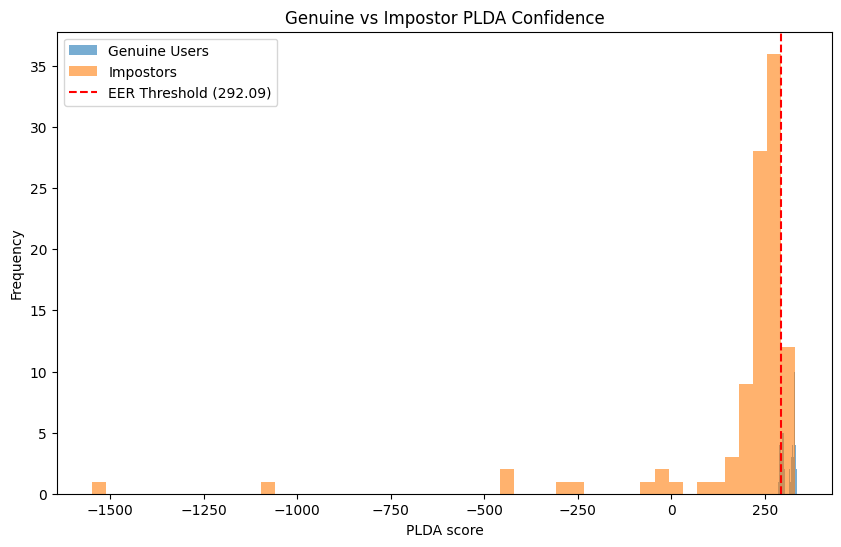

In [216]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.hist(genuine_scores, bins=50, alpha=0.6, label="Genuine Users")
plt.hist(impostor_scores, bins=50, alpha=0.6, label="Impostors")
plt.axvline(eer_threshold, color="red", linestyle="--", label=f"EER Threshold ({eer_threshold:.2f})")
plt.xlabel("PLDA score")
plt.ylabel("Frequency")
plt.title("Genuine vs Impostor PLDA Confidence")
plt.legend()
plt.show()


## PLDA con gli embedding dell'ultimo layer

In [217]:
X_impostors = []
X_genuine = []
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Function to extract embeddings from model
def extract_embeddings_lastlayer(audio_path, model, device):
    """
    Extracts flattened MFCC embeddings from an audio file using the trained DNN model.
    """
    # Extract MFCC features using the same function as for training data
    features = exctract_embeddings(audio_path)
    # Flatten the features to match the DNN input shape
    features_flattened = features
    # Convert to PyTorch tensor and add a batch dimension
    features_tensor = torch.tensor(features_flattened).unsqueeze(0).to(device) # Add batch dimension
    # Extract embeddings using the model's extract_embeddings method
    # The model's extract_embeddings method expects input shaped like (batch_size, input_dim)
    # which is (1, max_frames * n_mfcc) after flattening and unsqueezing
    embeddings = model(features_tensor)
    return embeddings.squeeze().cpu().detach().numpy() # Remove batch dimension and convert to numpy

for path in tqdm(unauthorized_audio_paths, desc="Extracting features"):
    embeddings = extract_embeddings_lastlayer(path, best_model, device)
    X_impostors.append(embeddings)


for path in tqdm(genuine_audio_paths, desc="Extracting features"):
    embeddings = extract_embeddings_lastlayer(path, best_model, device)
    X_genuine.append(embeddings)

X_impostors = np.array(X_impostors)
X_genuine = np.array(X_genuine)
print(f"Embeddings extracted: X_impostors shape: {X_impostors.shape}, X_genuine shape: {X_genuine.shape}")

Using device: cuda


Extracting features:   0%|          | 0/100 [00:00<?, ?it/s]<ipython-input-217-1c401560c79e>:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  features_tensor = torch.tensor(features_flattened).unsqueeze(0).to(device) # Add batch dimension
Extracting features: 100%|██████████| 144/144 [00:05<00:00, 27.57it/s]

Embeddings extracted: X_impostors shape: (100, 10), X_genuine shape: (144, 10)


In [218]:
from sklearn.mixture import GaussianMixture
import numpy as np

# Assume embeddings are already extracted
# X_genuine and X_impostors contain speaker embeddings

plda_model = GaussianMixture(n_components=2, covariance_type='full')
plda_model.fit(X_genuine)  # Train PLDA on genuine samples

# Compute likelihood ratios (PLDA Scores)
genuine_scores = plda_model.score_samples(X_genuine)
impostor_scores = plda_model.score_samples(X_impostors)

# Compute EER as before
y_true_eer = np.concatenate([np.ones(len(genuine_scores)), np.zeros(len(impostor_scores))])
y_scores_eer = np.concatenate([genuine_scores, impostor_scores])

fpr, tpr, thresholds = roc_curve(y_true_eer, y_scores_eer)
fnr = 1 - tpr
eer_idx = np.nanargmin(np.abs(fnr - fpr))
eer = fpr[eer_idx]
eer_threshold = thresholds[eer_idx]

print(f"\n🔐 Equal Error Rate (EER): {eer:.4f}")
print(f"Threshold at EER: {eer_threshold:.4f}")


🔐 Equal Error Rate (EER): 0.4600
Threshold at EER: 59.0996


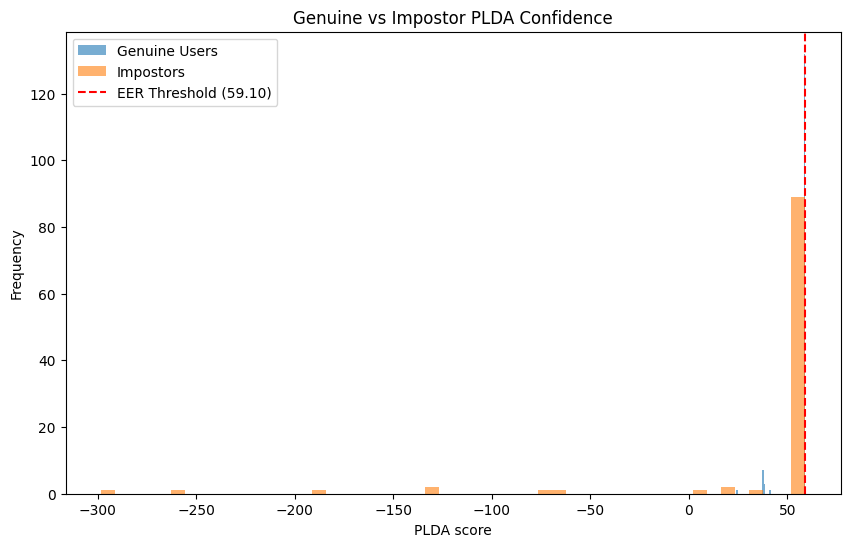

In [219]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.hist(genuine_scores, bins=50, alpha=0.6, label="Genuine Users")
plt.hist(impostor_scores, bins=50, alpha=0.6, label="Impostors")
plt.axvline(eer_threshold, color="red", linestyle="--", label=f"EER Threshold ({eer_threshold:.2f})")
plt.xlabel("PLDA score")
plt.ylabel("Frequency")
plt.title("Genuine vs Impostor PLDA Confidence")
plt.legend()
plt.show()


# CNN-LSTM

In [145]:
# Load data using CNN-LSTM friendly format
X_train, y_train, X_test, y_test, speaker_to_index = load_data_cnn_lstm(speaker_split_data)

In [146]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

# expected: (B,F,T) in embeddings (B, T, F) in model

torch.Size([1348, 1600, 25])
torch.Size([1348])
torch.Size([144, 1600, 25])
torch.Size([144])


In [167]:
# Initialize model
input_dim = X_train.shape[2]  # CNN expects MFCCs as input dimension
hidden_dim = 128
num_layers = 2
num_classes = len(speaker_to_index)

model = CNN_LSTM_SpeakerClassification(input_dim, hidden_dim, num_layers, num_classes)

# Define loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=2e-4, weight_decay=1e-4)

# Early stopping parameters
patience = 30  # Number of epochs without improvement before stopping
best_f1 = 0
counter = 0
best_model_state = None

# Print shapes for debugging
print(f"X_train shape: {X_train.shape}")  # Expected (batch, MFCCs, frames)
print(f"y_train shape: {y_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_test shape: {y_test.shape}")

# Move tensors and model to device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

X_train = X_train.to(device)
y_train = y_train.to(device)
X_test = X_test.to(device)
y_test = y_test.to(device)
model.to(device)

X_train shape: torch.Size([1348, 1600, 25])
y_train shape: torch.Size([1348])
X_test shape: torch.Size([144, 1600, 25])
y_test shape: torch.Size([144])
Using device: cuda


CNN_LSTM_SpeakerClassification(
  (cnn): Sequential(
    (0): Conv1d(25, 64, kernel_size=(3,), stride=(1,), padding=(1,))
    (1): ReLU()
    (2): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv1d(64, 128, kernel_size=(3,), stride=(1,), padding=(1,))
    (4): ReLU()
    (5): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (lstm): LSTM(128, 128, num_layers=2, batch_first=True, bidirectional=True)
  (feature_extractor): Sequential(
    (0): Linear(in_features=256, out_features=64, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.3, inplace=False)
  )
  (classifier): Linear(in_features=64, out_features=10, bias=True)
)

In [168]:
total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Number of trainable parameters: {total_params}")

Number of trainable parameters: 706122


In [169]:
from torch.utils.data import Dataset, DataLoader # Import Dataset and DataLoader
class AudioDataset(Dataset):
    def __init__(self, X, y):
        """
        Args:
        - X: Tensor of input features (MFCCs, Spectrograms)
        - y: Corresponding labels.
        """
        self.X = X
        self.y = y

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

# Assuming X_train, y_train, X_test, y_test are Tensors
train_dataset = AudioDataset(X_train, y_train)
test_dataset = AudioDataset(X_test, y_test)

# Define DataLoader with batch size and shuffling
batch_size = 32  # Adjust based on memory constraints
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [170]:
best_f1 = 0.0
patience = 30
counter = 0

for epoch in tqdm(range(300), desc="Training Progress", unit="epoch"):
    model.train()
    epoch_loss = 0
    train_preds, train_labels = [], []

    for X_batch, y_batch in train_loader:  # Loop through batches
        optimizer.zero_grad()
        # print(f"X_batch shape: {X_batch.shape}")
        # print(f"y_batch shape: {y_batch.shape}")
        output = model(X_batch)
        loss = criterion(output, y_batch)
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()
        train_preds.extend(output.argmax(dim=1).cpu().numpy())
        train_labels.extend(y_batch.cpu().numpy())


    # Validation Step
    model.eval()
    with torch.no_grad():
        val_preds, val_labels = [], []
        val_loss_total = 0

        for X_batch, y_batch in test_loader:
            val_output = model(X_batch)
            val_loss = criterion(val_output, y_batch)
            val_loss_total += val_loss.item()

            val_preds.extend(val_output.argmax(dim=1).cpu().numpy())
            val_labels.extend(y_batch.cpu().numpy())

    # Compute validation metrics
    val_accuracy = accuracy_score(val_labels, val_preds)
    val_f1 = f1_score(val_labels, val_preds, average="macro")

    print(f"Epoch {epoch+1}, Val Loss: {val_loss_total:.4f}, Val Accuracy: {val_accuracy * 100:.2f}%, Val F1: {val_f1:.4f}")

    # Early Stopping Logic
    if val_f1 >= best_f1:
        best_f1 = val_f1
        print(f"Best F1-score saved at epoch {epoch+1}")
        best_model_state = model.state_dict()
        counter = 0
    else:
        counter += 1

    # if counter >= patience:
    #     print(f"Early stopping at epoch {epoch+1}. Best F1-score: {best_f1:.4f}")
    #     break

Training Progress:   0%|          | 1/300 [00:01<06:47,  1.36s/epoch]

Epoch 1, Val Loss: 11.5116, Val Accuracy: 9.72%, Val F1: 0.0188
Best F1-score saved at epoch 1


Training Progress:   1%|          | 2/300 [00:02<06:40,  1.35s/epoch]

Epoch 2, Val Loss: 11.5221, Val Accuracy: 10.42%, Val F1: 0.0192
Best F1-score saved at epoch 2


Training Progress:   1%|          | 3/300 [00:04<06:38,  1.34s/epoch]

Epoch 3, Val Loss: 11.5202, Val Accuracy: 9.72%, Val F1: 0.0340
Best F1-score saved at epoch 3


Training Progress:   1%|▏         | 4/300 [00:05<06:34,  1.33s/epoch]

Epoch 4, Val Loss: 11.5265, Val Accuracy: 10.42%, Val F1: 0.0419
Best F1-score saved at epoch 4


Training Progress:   2%|▏         | 5/300 [00:06<06:18,  1.28s/epoch]

Epoch 5, Val Loss: 11.5371, Val Accuracy: 9.03%, Val F1: 0.0278


Training Progress:   2%|▏         | 6/300 [00:07<06:09,  1.26s/epoch]

Epoch 6, Val Loss: 11.5582, Val Accuracy: 11.11%, Val F1: 0.0385


Training Progress:   2%|▏         | 7/300 [00:08<06:02,  1.24s/epoch]

Epoch 7, Val Loss: 11.5140, Val Accuracy: 9.03%, Val F1: 0.0257


Training Progress:   3%|▎         | 8/300 [00:10<05:58,  1.23s/epoch]

Epoch 8, Val Loss: 11.0784, Val Accuracy: 16.67%, Val F1: 0.0928
Best F1-score saved at epoch 8


Training Progress:   3%|▎         | 9/300 [00:11<05:56,  1.23s/epoch]

Epoch 9, Val Loss: 10.2028, Val Accuracy: 15.97%, Val F1: 0.0711


Training Progress:   3%|▎         | 10/300 [00:12<05:55,  1.22s/epoch]

Epoch 10, Val Loss: 9.7843, Val Accuracy: 22.92%, Val F1: 0.1197
Best F1-score saved at epoch 10


Training Progress:   4%|▎         | 11/300 [00:13<05:53,  1.22s/epoch]

Epoch 11, Val Loss: 12.0037, Val Accuracy: 9.72%, Val F1: 0.0386


Training Progress:   4%|▍         | 12/300 [00:15<05:52,  1.22s/epoch]

Epoch 12, Val Loss: 9.9637, Val Accuracy: 19.44%, Val F1: 0.1132


Training Progress:   4%|▍         | 13/300 [00:16<05:51,  1.23s/epoch]

Epoch 13, Val Loss: 9.4974, Val Accuracy: 15.28%, Val F1: 0.0683


Training Progress:   5%|▍         | 14/300 [00:17<05:51,  1.23s/epoch]

Epoch 14, Val Loss: 11.1127, Val Accuracy: 12.50%, Val F1: 0.0472


Training Progress:   5%|▌         | 15/300 [00:18<05:49,  1.23s/epoch]

Epoch 15, Val Loss: 9.5038, Val Accuracy: 21.53%, Val F1: 0.1163


Training Progress:   5%|▌         | 16/300 [00:19<05:49,  1.23s/epoch]

Epoch 16, Val Loss: 8.9688, Val Accuracy: 24.31%, Val F1: 0.1467
Best F1-score saved at epoch 16


Training Progress:   6%|▌         | 17/300 [00:21<05:47,  1.23s/epoch]

Epoch 17, Val Loss: 9.1567, Val Accuracy: 22.22%, Val F1: 0.1355


Training Progress:   6%|▌         | 18/300 [00:22<05:46,  1.23s/epoch]

Epoch 18, Val Loss: 8.7895, Val Accuracy: 25.69%, Val F1: 0.2200
Best F1-score saved at epoch 18


Training Progress:   6%|▋         | 19/300 [00:23<05:45,  1.23s/epoch]

Epoch 19, Val Loss: 9.0507, Val Accuracy: 22.92%, Val F1: 0.1497


Training Progress:   7%|▋         | 20/300 [00:24<05:45,  1.23s/epoch]

Epoch 20, Val Loss: 13.3056, Val Accuracy: 14.58%, Val F1: 0.1029


Training Progress:   7%|▋         | 21/300 [00:26<05:43,  1.23s/epoch]

Epoch 21, Val Loss: 9.4467, Val Accuracy: 25.69%, Val F1: 0.1670


Training Progress:   7%|▋         | 22/300 [00:27<05:43,  1.23s/epoch]

Epoch 22, Val Loss: 8.6218, Val Accuracy: 29.86%, Val F1: 0.1853


Training Progress:   8%|▊         | 23/300 [00:28<05:43,  1.24s/epoch]

Epoch 23, Val Loss: 8.9010, Val Accuracy: 26.39%, Val F1: 0.1849


Training Progress:   8%|▊         | 24/300 [00:29<05:41,  1.24s/epoch]

Epoch 24, Val Loss: 8.3345, Val Accuracy: 28.47%, Val F1: 0.2323
Best F1-score saved at epoch 24


Training Progress:   8%|▊         | 25/300 [00:31<05:40,  1.24s/epoch]

Epoch 25, Val Loss: 7.9644, Val Accuracy: 30.56%, Val F1: 0.2351
Best F1-score saved at epoch 25


Training Progress:   9%|▊         | 26/300 [00:32<05:39,  1.24s/epoch]

Epoch 26, Val Loss: 8.5787, Val Accuracy: 25.00%, Val F1: 0.1746


Training Progress:   9%|▉         | 27/300 [00:33<05:37,  1.24s/epoch]

Epoch 27, Val Loss: 7.7213, Val Accuracy: 27.08%, Val F1: 0.1720


Training Progress:   9%|▉         | 28/300 [00:34<05:36,  1.24s/epoch]

Epoch 28, Val Loss: 8.6104, Val Accuracy: 36.81%, Val F1: 0.3498
Best F1-score saved at epoch 28


Training Progress:  10%|▉         | 29/300 [00:36<05:34,  1.23s/epoch]

Epoch 29, Val Loss: 7.5859, Val Accuracy: 31.25%, Val F1: 0.2403


Training Progress:  10%|█         | 30/300 [00:37<05:33,  1.23s/epoch]

Epoch 30, Val Loss: 7.0467, Val Accuracy: 41.67%, Val F1: 0.3533
Best F1-score saved at epoch 30


Training Progress:  10%|█         | 31/300 [00:38<05:31,  1.23s/epoch]

Epoch 31, Val Loss: 7.0984, Val Accuracy: 35.42%, Val F1: 0.2887


Training Progress:  11%|█         | 32/300 [00:39<05:30,  1.23s/epoch]

Epoch 32, Val Loss: 6.3766, Val Accuracy: 48.61%, Val F1: 0.4513
Best F1-score saved at epoch 32


Training Progress:  11%|█         | 33/300 [00:40<05:29,  1.23s/epoch]

Epoch 33, Val Loss: 9.0947, Val Accuracy: 18.06%, Val F1: 0.1335


Training Progress:  11%|█▏        | 34/300 [00:42<05:28,  1.23s/epoch]

Epoch 34, Val Loss: 8.0294, Val Accuracy: 34.03%, Val F1: 0.2559


Training Progress:  12%|█▏        | 35/300 [00:43<05:26,  1.23s/epoch]

Epoch 35, Val Loss: 7.2015, Val Accuracy: 43.06%, Val F1: 0.3344


Training Progress:  12%|█▏        | 36/300 [00:44<05:24,  1.23s/epoch]

Epoch 36, Val Loss: 6.9517, Val Accuracy: 38.89%, Val F1: 0.3251


Training Progress:  12%|█▏        | 37/300 [00:45<05:23,  1.23s/epoch]

Epoch 37, Val Loss: 6.2354, Val Accuracy: 45.14%, Val F1: 0.3896


Training Progress:  13%|█▎        | 38/300 [00:47<05:21,  1.23s/epoch]

Epoch 38, Val Loss: 6.3246, Val Accuracy: 40.28%, Val F1: 0.3623


Training Progress:  13%|█▎        | 39/300 [00:48<05:20,  1.23s/epoch]

Epoch 39, Val Loss: 5.8717, Val Accuracy: 47.92%, Val F1: 0.4199


Training Progress:  13%|█▎        | 40/300 [00:49<05:18,  1.23s/epoch]

Epoch 40, Val Loss: 6.8485, Val Accuracy: 35.42%, Val F1: 0.2575


Training Progress:  14%|█▎        | 41/300 [00:50<05:17,  1.22s/epoch]

Epoch 41, Val Loss: 7.5394, Val Accuracy: 36.11%, Val F1: 0.2490


Training Progress:  14%|█▍        | 42/300 [00:52<05:16,  1.23s/epoch]

Epoch 42, Val Loss: 6.4643, Val Accuracy: 41.67%, Val F1: 0.3449


Training Progress:  14%|█▍        | 43/300 [00:53<05:15,  1.23s/epoch]

Epoch 43, Val Loss: 5.5977, Val Accuracy: 43.06%, Val F1: 0.3334


Training Progress:  15%|█▍        | 44/300 [00:54<05:13,  1.22s/epoch]

Epoch 44, Val Loss: 5.6233, Val Accuracy: 49.31%, Val F1: 0.4314


Training Progress:  15%|█▌        | 45/300 [00:55<05:12,  1.22s/epoch]

Epoch 45, Val Loss: 5.4770, Val Accuracy: 46.53%, Val F1: 0.4042


Training Progress:  15%|█▌        | 46/300 [00:56<05:10,  1.22s/epoch]

Epoch 46, Val Loss: 5.0155, Val Accuracy: 52.08%, Val F1: 0.4620
Best F1-score saved at epoch 46


Training Progress:  16%|█▌        | 47/300 [00:58<05:08,  1.22s/epoch]

Epoch 47, Val Loss: 6.3125, Val Accuracy: 44.44%, Val F1: 0.4073


Training Progress:  16%|█▌        | 48/300 [00:59<05:07,  1.22s/epoch]

Epoch 48, Val Loss: 6.3278, Val Accuracy: 43.75%, Val F1: 0.3893


Training Progress:  16%|█▋        | 49/300 [01:00<05:05,  1.22s/epoch]

Epoch 49, Val Loss: 5.3163, Val Accuracy: 47.92%, Val F1: 0.4280


Training Progress:  17%|█▋        | 50/300 [01:01<05:04,  1.22s/epoch]

Epoch 50, Val Loss: 4.9461, Val Accuracy: 52.78%, Val F1: 0.4508


Training Progress:  17%|█▋        | 51/300 [01:02<05:02,  1.22s/epoch]

Epoch 51, Val Loss: 4.9237, Val Accuracy: 50.69%, Val F1: 0.4463


Training Progress:  17%|█▋        | 52/300 [01:04<05:01,  1.22s/epoch]

Epoch 52, Val Loss: 5.5253, Val Accuracy: 47.92%, Val F1: 0.4119


Training Progress:  18%|█▊        | 53/300 [01:05<05:01,  1.22s/epoch]

Epoch 53, Val Loss: 5.0268, Val Accuracy: 50.69%, Val F1: 0.4611


Training Progress:  18%|█▊        | 54/300 [01:06<05:00,  1.22s/epoch]

Epoch 54, Val Loss: 4.8354, Val Accuracy: 53.47%, Val F1: 0.4670
Best F1-score saved at epoch 54


Training Progress:  18%|█▊        | 55/300 [01:07<04:59,  1.22s/epoch]

Epoch 55, Val Loss: 5.1740, Val Accuracy: 56.25%, Val F1: 0.5439
Best F1-score saved at epoch 55


Training Progress:  19%|█▊        | 56/300 [01:09<04:57,  1.22s/epoch]

Epoch 56, Val Loss: 5.5520, Val Accuracy: 48.61%, Val F1: 0.3934


Training Progress:  19%|█▉        | 57/300 [01:10<04:55,  1.22s/epoch]

Epoch 57, Val Loss: 4.5642, Val Accuracy: 53.47%, Val F1: 0.4715


Training Progress:  19%|█▉        | 58/300 [01:11<04:54,  1.22s/epoch]

Epoch 58, Val Loss: 4.4835, Val Accuracy: 57.64%, Val F1: 0.5095


Training Progress:  20%|█▉        | 59/300 [01:12<04:52,  1.22s/epoch]

Epoch 59, Val Loss: 4.2489, Val Accuracy: 63.19%, Val F1: 0.5804
Best F1-score saved at epoch 59


Training Progress:  20%|██        | 60/300 [01:13<04:51,  1.21s/epoch]

Epoch 60, Val Loss: 3.9636, Val Accuracy: 61.11%, Val F1: 0.5494


Training Progress:  20%|██        | 61/300 [01:15<04:50,  1.21s/epoch]

Epoch 61, Val Loss: 8.2113, Val Accuracy: 31.25%, Val F1: 0.3145


Training Progress:  21%|██        | 62/300 [01:16<04:49,  1.21s/epoch]

Epoch 62, Val Loss: 4.1056, Val Accuracy: 61.11%, Val F1: 0.5363


Training Progress:  21%|██        | 63/300 [01:17<04:48,  1.22s/epoch]

Epoch 63, Val Loss: 4.2771, Val Accuracy: 64.58%, Val F1: 0.6053
Best F1-score saved at epoch 63


Training Progress:  21%|██▏       | 64/300 [01:18<04:51,  1.24s/epoch]

Epoch 64, Val Loss: 12.0230, Val Accuracy: 31.94%, Val F1: 0.2313


Training Progress:  22%|██▏       | 65/300 [01:20<04:48,  1.23s/epoch]

Epoch 65, Val Loss: 7.1229, Val Accuracy: 40.28%, Val F1: 0.3505


Training Progress:  22%|██▏       | 66/300 [01:21<04:46,  1.23s/epoch]

Epoch 66, Val Loss: 5.9886, Val Accuracy: 52.08%, Val F1: 0.4571


Training Progress:  22%|██▏       | 67/300 [01:22<04:44,  1.22s/epoch]

Epoch 67, Val Loss: 5.4996, Val Accuracy: 51.39%, Val F1: 0.4474


Training Progress:  23%|██▎       | 68/300 [01:23<04:47,  1.24s/epoch]

Epoch 68, Val Loss: 4.8774, Val Accuracy: 54.86%, Val F1: 0.5182


Training Progress:  23%|██▎       | 69/300 [01:24<04:44,  1.23s/epoch]

Epoch 69, Val Loss: 4.1856, Val Accuracy: 59.72%, Val F1: 0.5582


Training Progress:  23%|██▎       | 70/300 [01:26<04:42,  1.23s/epoch]

Epoch 70, Val Loss: 4.6056, Val Accuracy: 59.03%, Val F1: 0.5699


Training Progress:  24%|██▎       | 71/300 [01:27<04:40,  1.22s/epoch]

Epoch 71, Val Loss: 3.7908, Val Accuracy: 65.97%, Val F1: 0.6534
Best F1-score saved at epoch 71


Training Progress:  24%|██▍       | 72/300 [01:28<04:38,  1.22s/epoch]

Epoch 72, Val Loss: 4.0549, Val Accuracy: 64.58%, Val F1: 0.6258


Training Progress:  24%|██▍       | 73/300 [01:29<04:37,  1.22s/epoch]

Epoch 73, Val Loss: 3.5321, Val Accuracy: 66.67%, Val F1: 0.6322


Training Progress:  25%|██▍       | 74/300 [01:31<04:36,  1.22s/epoch]

Epoch 74, Val Loss: 3.2671, Val Accuracy: 71.53%, Val F1: 0.6956
Best F1-score saved at epoch 74


Training Progress:  25%|██▌       | 75/300 [01:32<04:34,  1.22s/epoch]

Epoch 75, Val Loss: 3.4278, Val Accuracy: 68.75%, Val F1: 0.6363


Training Progress:  25%|██▌       | 76/300 [01:33<04:33,  1.22s/epoch]

Epoch 76, Val Loss: 3.0592, Val Accuracy: 68.06%, Val F1: 0.6509


Training Progress:  26%|██▌       | 77/300 [01:34<04:32,  1.22s/epoch]

Epoch 77, Val Loss: 2.8844, Val Accuracy: 78.47%, Val F1: 0.7780
Best F1-score saved at epoch 77


Training Progress:  26%|██▌       | 78/300 [01:35<04:30,  1.22s/epoch]

Epoch 78, Val Loss: 2.6312, Val Accuracy: 80.56%, Val F1: 0.7789
Best F1-score saved at epoch 78


Training Progress:  26%|██▋       | 79/300 [01:37<04:28,  1.22s/epoch]

Epoch 79, Val Loss: 2.6973, Val Accuracy: 75.69%, Val F1: 0.7217


Training Progress:  27%|██▋       | 80/300 [01:38<04:27,  1.22s/epoch]

Epoch 80, Val Loss: 4.9146, Val Accuracy: 60.42%, Val F1: 0.5558


Training Progress:  27%|██▋       | 81/300 [01:39<04:26,  1.22s/epoch]

Epoch 81, Val Loss: 2.8662, Val Accuracy: 84.03%, Val F1: 0.8293
Best F1-score saved at epoch 81


Training Progress:  27%|██▋       | 82/300 [01:40<04:26,  1.22s/epoch]

Epoch 82, Val Loss: 2.3607, Val Accuracy: 81.25%, Val F1: 0.7750


Training Progress:  28%|██▊       | 83/300 [01:42<04:25,  1.22s/epoch]

Epoch 83, Val Loss: 2.2323, Val Accuracy: 83.33%, Val F1: 0.7924


Training Progress:  28%|██▊       | 84/300 [01:43<04:23,  1.22s/epoch]

Epoch 84, Val Loss: 1.8539, Val Accuracy: 89.58%, Val F1: 0.8770
Best F1-score saved at epoch 84


Training Progress:  28%|██▊       | 85/300 [01:44<04:22,  1.22s/epoch]

Epoch 85, Val Loss: 1.6870, Val Accuracy: 88.89%, Val F1: 0.8832
Best F1-score saved at epoch 85


Training Progress:  29%|██▊       | 86/300 [01:45<04:21,  1.22s/epoch]

Epoch 86, Val Loss: 1.4379, Val Accuracy: 94.44%, Val F1: 0.9353
Best F1-score saved at epoch 86


Training Progress:  29%|██▉       | 87/300 [01:46<04:20,  1.22s/epoch]

Epoch 87, Val Loss: 1.4153, Val Accuracy: 92.36%, Val F1: 0.9170


Training Progress:  29%|██▉       | 88/300 [01:48<04:18,  1.22s/epoch]

Epoch 88, Val Loss: 1.1801, Val Accuracy: 94.44%, Val F1: 0.9388
Best F1-score saved at epoch 88


Training Progress:  30%|██▉       | 89/300 [01:49<04:17,  1.22s/epoch]

Epoch 89, Val Loss: 1.4878, Val Accuracy: 87.50%, Val F1: 0.8521


Training Progress:  30%|███       | 90/300 [01:50<04:16,  1.22s/epoch]

Epoch 90, Val Loss: 1.3401, Val Accuracy: 89.58%, Val F1: 0.8624


Training Progress:  30%|███       | 91/300 [01:51<04:14,  1.22s/epoch]

Epoch 91, Val Loss: 1.4301, Val Accuracy: 93.75%, Val F1: 0.9312


Training Progress:  31%|███       | 92/300 [01:53<04:14,  1.22s/epoch]

Epoch 92, Val Loss: 1.2046, Val Accuracy: 92.36%, Val F1: 0.9116


Training Progress:  31%|███       | 93/300 [01:54<04:14,  1.23s/epoch]

Epoch 93, Val Loss: 1.3421, Val Accuracy: 90.28%, Val F1: 0.8840


Training Progress:  31%|███▏      | 94/300 [01:55<04:12,  1.23s/epoch]

Epoch 94, Val Loss: 1.2893, Val Accuracy: 89.58%, Val F1: 0.8649


Training Progress:  32%|███▏      | 95/300 [01:56<04:10,  1.22s/epoch]

Epoch 95, Val Loss: 6.2860, Val Accuracy: 54.17%, Val F1: 0.4867


Training Progress:  32%|███▏      | 96/300 [01:57<04:09,  1.22s/epoch]

Epoch 96, Val Loss: 2.4560, Val Accuracy: 81.94%, Val F1: 0.7720


Training Progress:  32%|███▏      | 97/300 [01:59<04:08,  1.22s/epoch]

Epoch 97, Val Loss: 2.4463, Val Accuracy: 83.33%, Val F1: 0.8173


Training Progress:  33%|███▎      | 98/300 [02:00<04:07,  1.22s/epoch]

Epoch 98, Val Loss: 1.6865, Val Accuracy: 86.81%, Val F1: 0.8556


Training Progress:  33%|███▎      | 99/300 [02:01<04:05,  1.22s/epoch]

Epoch 99, Val Loss: 1.4040, Val Accuracy: 88.89%, Val F1: 0.8781


Training Progress:  33%|███▎      | 100/300 [02:02<04:04,  1.22s/epoch]

Epoch 100, Val Loss: 1.3532, Val Accuracy: 88.89%, Val F1: 0.8488


Training Progress:  34%|███▎      | 101/300 [02:04<04:02,  1.22s/epoch]

Epoch 101, Val Loss: 1.2619, Val Accuracy: 90.28%, Val F1: 0.8913


Training Progress:  34%|███▍      | 102/300 [02:05<04:02,  1.22s/epoch]

Epoch 102, Val Loss: 1.4826, Val Accuracy: 87.50%, Val F1: 0.8645


Training Progress:  34%|███▍      | 103/300 [02:06<04:01,  1.23s/epoch]

Epoch 103, Val Loss: 1.1001, Val Accuracy: 92.36%, Val F1: 0.9023


Training Progress:  35%|███▍      | 104/300 [02:07<03:59,  1.22s/epoch]

Epoch 104, Val Loss: 1.0733, Val Accuracy: 91.67%, Val F1: 0.8969


Training Progress:  35%|███▌      | 105/300 [02:08<03:58,  1.22s/epoch]

Epoch 105, Val Loss: 1.0622, Val Accuracy: 88.19%, Val F1: 0.8608


Training Progress:  35%|███▌      | 106/300 [02:10<03:57,  1.22s/epoch]

Epoch 106, Val Loss: 1.1753, Val Accuracy: 92.36%, Val F1: 0.9101


Training Progress:  36%|███▌      | 107/300 [02:11<03:55,  1.22s/epoch]

Epoch 107, Val Loss: 3.5676, Val Accuracy: 70.83%, Val F1: 0.6724


Training Progress:  36%|███▌      | 108/300 [02:12<03:54,  1.22s/epoch]

Epoch 108, Val Loss: 2.3399, Val Accuracy: 83.33%, Val F1: 0.8148


Training Progress:  36%|███▋      | 109/300 [02:13<03:53,  1.22s/epoch]

Epoch 109, Val Loss: 2.1341, Val Accuracy: 82.64%, Val F1: 0.7928


Training Progress:  37%|███▋      | 110/300 [02:15<03:52,  1.22s/epoch]

Epoch 110, Val Loss: 1.7978, Val Accuracy: 86.81%, Val F1: 0.8583


Training Progress:  37%|███▋      | 111/300 [02:16<03:50,  1.22s/epoch]

Epoch 111, Val Loss: 1.4846, Val Accuracy: 87.50%, Val F1: 0.8655


Training Progress:  37%|███▋      | 112/300 [02:17<03:49,  1.22s/epoch]

Epoch 112, Val Loss: 1.4612, Val Accuracy: 88.19%, Val F1: 0.8713


Training Progress:  38%|███▊      | 113/300 [02:18<03:49,  1.23s/epoch]

Epoch 113, Val Loss: 1.3654, Val Accuracy: 88.89%, Val F1: 0.8792


Training Progress:  38%|███▊      | 114/300 [02:19<03:47,  1.23s/epoch]

Epoch 114, Val Loss: 1.3374, Val Accuracy: 90.28%, Val F1: 0.8916


Training Progress:  38%|███▊      | 115/300 [02:21<03:46,  1.22s/epoch]

Epoch 115, Val Loss: 1.2858, Val Accuracy: 88.89%, Val F1: 0.8775


Training Progress:  39%|███▊      | 116/300 [02:22<03:45,  1.22s/epoch]

Epoch 116, Val Loss: 1.3288, Val Accuracy: 90.97%, Val F1: 0.9013


Training Progress:  39%|███▉      | 117/300 [02:23<03:43,  1.22s/epoch]

Epoch 117, Val Loss: 1.4395, Val Accuracy: 87.50%, Val F1: 0.8316


Training Progress:  39%|███▉      | 118/300 [02:24<03:42,  1.22s/epoch]

Epoch 118, Val Loss: 1.6405, Val Accuracy: 88.19%, Val F1: 0.8731


Training Progress:  40%|███▉      | 119/300 [02:26<03:40,  1.22s/epoch]

Epoch 119, Val Loss: 1.4734, Val Accuracy: 91.67%, Val F1: 0.9099


Training Progress:  40%|████      | 120/300 [02:27<03:39,  1.22s/epoch]

Epoch 120, Val Loss: 1.1249, Val Accuracy: 91.67%, Val F1: 0.9076


Training Progress:  40%|████      | 121/300 [02:28<03:38,  1.22s/epoch]

Epoch 121, Val Loss: 1.1019, Val Accuracy: 93.06%, Val F1: 0.9242


Training Progress:  41%|████      | 122/300 [02:29<03:37,  1.22s/epoch]

Epoch 122, Val Loss: 1.2299, Val Accuracy: 91.67%, Val F1: 0.9095


Training Progress:  41%|████      | 123/300 [02:30<03:37,  1.23s/epoch]

Epoch 123, Val Loss: 1.0673, Val Accuracy: 92.36%, Val F1: 0.9152


Training Progress:  41%|████▏     | 124/300 [02:32<03:35,  1.22s/epoch]

Epoch 124, Val Loss: 1.0654, Val Accuracy: 92.36%, Val F1: 0.9176


Training Progress:  42%|████▏     | 125/300 [02:33<03:33,  1.22s/epoch]

Epoch 125, Val Loss: 1.0425, Val Accuracy: 94.44%, Val F1: 0.9396
Best F1-score saved at epoch 125


Training Progress:  42%|████▏     | 126/300 [02:34<03:32,  1.22s/epoch]

Epoch 126, Val Loss: 1.2103, Val Accuracy: 93.06%, Val F1: 0.9254


Training Progress:  42%|████▏     | 127/300 [02:35<03:31,  1.22s/epoch]

Epoch 127, Val Loss: 1.2611, Val Accuracy: 89.58%, Val F1: 0.8841


Training Progress:  43%|████▎     | 128/300 [02:37<03:29,  1.22s/epoch]

Epoch 128, Val Loss: 1.5142, Val Accuracy: 92.36%, Val F1: 0.9189


Training Progress:  43%|████▎     | 129/300 [02:38<03:28,  1.22s/epoch]

Epoch 129, Val Loss: 1.5747, Val Accuracy: 92.36%, Val F1: 0.9181


Training Progress:  43%|████▎     | 130/300 [02:39<03:27,  1.22s/epoch]

Epoch 130, Val Loss: 1.1595, Val Accuracy: 95.14%, Val F1: 0.9481
Best F1-score saved at epoch 130


Training Progress:  44%|████▎     | 131/300 [02:40<03:25,  1.22s/epoch]

Epoch 131, Val Loss: 1.1178, Val Accuracy: 94.44%, Val F1: 0.9406


Training Progress:  44%|████▍     | 132/300 [02:41<03:25,  1.22s/epoch]

Epoch 132, Val Loss: 1.6905, Val Accuracy: 87.50%, Val F1: 0.8702


Training Progress:  44%|████▍     | 133/300 [02:43<03:24,  1.22s/epoch]

Epoch 133, Val Loss: 1.3053, Val Accuracy: 90.28%, Val F1: 0.8977


Training Progress:  45%|████▍     | 134/300 [02:44<03:22,  1.22s/epoch]

Epoch 134, Val Loss: 1.1541, Val Accuracy: 90.28%, Val F1: 0.8595


Training Progress:  45%|████▌     | 135/300 [02:45<03:21,  1.22s/epoch]

Epoch 135, Val Loss: 1.0928, Val Accuracy: 93.75%, Val F1: 0.9316


Training Progress:  45%|████▌     | 136/300 [02:46<03:19,  1.22s/epoch]

Epoch 136, Val Loss: 1.3925, Val Accuracy: 93.75%, Val F1: 0.9323


Training Progress:  46%|████▌     | 137/300 [02:48<03:18,  1.22s/epoch]

Epoch 137, Val Loss: 1.0380, Val Accuracy: 91.67%, Val F1: 0.9071


Training Progress:  46%|████▌     | 138/300 [02:49<03:17,  1.22s/epoch]

Epoch 138, Val Loss: 0.9535, Val Accuracy: 95.14%, Val F1: 0.9473


Training Progress:  46%|████▋     | 139/300 [02:50<03:16,  1.22s/epoch]

Epoch 139, Val Loss: 1.0118, Val Accuracy: 92.36%, Val F1: 0.9141


Training Progress:  47%|████▋     | 140/300 [02:51<03:14,  1.22s/epoch]

Epoch 140, Val Loss: 0.8320, Val Accuracy: 94.44%, Val F1: 0.9372


Training Progress:  47%|████▋     | 141/300 [02:52<03:13,  1.22s/epoch]

Epoch 141, Val Loss: 0.8311, Val Accuracy: 96.53%, Val F1: 0.9620
Best F1-score saved at epoch 141


Training Progress:  47%|████▋     | 142/300 [02:54<03:12,  1.22s/epoch]

Epoch 142, Val Loss: 1.5023, Val Accuracy: 95.14%, Val F1: 0.9492


Training Progress:  48%|████▊     | 143/300 [02:55<03:12,  1.22s/epoch]

Epoch 143, Val Loss: 0.9679, Val Accuracy: 95.14%, Val F1: 0.9481


Training Progress:  48%|████▊     | 144/300 [02:56<03:10,  1.22s/epoch]

Epoch 144, Val Loss: 1.0765, Val Accuracy: 93.75%, Val F1: 0.9279


Training Progress:  48%|████▊     | 145/300 [02:57<03:09,  1.22s/epoch]

Epoch 145, Val Loss: 0.7757, Val Accuracy: 95.83%, Val F1: 0.9536


Training Progress:  49%|████▊     | 146/300 [02:59<03:07,  1.22s/epoch]

Epoch 146, Val Loss: 0.7273, Val Accuracy: 95.14%, Val F1: 0.9448


Training Progress:  49%|████▉     | 147/300 [03:00<03:06,  1.22s/epoch]

Epoch 147, Val Loss: 1.1896, Val Accuracy: 90.97%, Val F1: 0.8762


Training Progress:  49%|████▉     | 148/300 [03:01<03:05,  1.22s/epoch]

Epoch 148, Val Loss: 0.7229, Val Accuracy: 95.14%, Val F1: 0.9419


Training Progress:  50%|████▉     | 149/300 [03:02<03:03,  1.22s/epoch]

Epoch 149, Val Loss: 0.4245, Val Accuracy: 98.61%, Val F1: 0.9861
Best F1-score saved at epoch 149


Training Progress:  50%|█████     | 150/300 [03:03<03:02,  1.22s/epoch]

Epoch 150, Val Loss: 1.0903, Val Accuracy: 90.28%, Val F1: 0.8945


Training Progress:  50%|█████     | 151/300 [03:05<03:01,  1.22s/epoch]

Epoch 151, Val Loss: 0.6387, Val Accuracy: 97.92%, Val F1: 0.9774


Training Progress:  51%|█████     | 152/300 [03:06<03:00,  1.22s/epoch]

Epoch 152, Val Loss: 0.5249, Val Accuracy: 97.92%, Val F1: 0.9791


Training Progress:  51%|█████     | 153/300 [03:07<03:00,  1.22s/epoch]

Epoch 153, Val Loss: 0.2825, Val Accuracy: 99.31%, Val F1: 0.9933
Best F1-score saved at epoch 153


Training Progress:  51%|█████▏    | 154/300 [03:08<02:58,  1.22s/epoch]

Epoch 154, Val Loss: 0.3298, Val Accuracy: 98.61%, Val F1: 0.9868


Training Progress:  52%|█████▏    | 155/300 [03:10<02:56,  1.22s/epoch]

Epoch 155, Val Loss: 0.7488, Val Accuracy: 95.83%, Val F1: 0.9533


Training Progress:  52%|█████▏    | 156/300 [03:11<02:55,  1.22s/epoch]

Epoch 156, Val Loss: 0.3021, Val Accuracy: 99.31%, Val F1: 0.9933
Best F1-score saved at epoch 156


Training Progress:  52%|█████▏    | 157/300 [03:12<02:54,  1.22s/epoch]

Epoch 157, Val Loss: 0.2544, Val Accuracy: 99.31%, Val F1: 0.9933
Best F1-score saved at epoch 157


Training Progress:  53%|█████▎    | 158/300 [03:13<02:53,  1.22s/epoch]

Epoch 158, Val Loss: 0.2113, Val Accuracy: 99.31%, Val F1: 0.9933
Best F1-score saved at epoch 158


Training Progress:  53%|█████▎    | 159/300 [03:14<02:52,  1.22s/epoch]

Epoch 159, Val Loss: 0.1691, Val Accuracy: 99.31%, Val F1: 0.9933
Best F1-score saved at epoch 159


Training Progress:  53%|█████▎    | 160/300 [03:16<02:50,  1.22s/epoch]

Epoch 160, Val Loss: 0.1833, Val Accuracy: 98.61%, Val F1: 0.9868


Training Progress:  54%|█████▎    | 161/300 [03:17<02:49,  1.22s/epoch]

Epoch 161, Val Loss: 0.1693, Val Accuracy: 98.61%, Val F1: 0.9868


Training Progress:  54%|█████▍    | 162/300 [03:18<02:48,  1.22s/epoch]

Epoch 162, Val Loss: 0.1631, Val Accuracy: 99.31%, Val F1: 0.9933
Best F1-score saved at epoch 162


Training Progress:  54%|█████▍    | 163/300 [03:19<02:47,  1.22s/epoch]

Epoch 163, Val Loss: 0.1701, Val Accuracy: 99.31%, Val F1: 0.9933
Best F1-score saved at epoch 163


Training Progress:  55%|█████▍    | 164/300 [03:21<02:46,  1.22s/epoch]

Epoch 164, Val Loss: 0.1638, Val Accuracy: 99.31%, Val F1: 0.9933
Best F1-score saved at epoch 164


Training Progress:  55%|█████▌    | 165/300 [03:22<02:44,  1.22s/epoch]

Epoch 165, Val Loss: 0.1732, Val Accuracy: 99.31%, Val F1: 0.9933
Best F1-score saved at epoch 165


Training Progress:  55%|█████▌    | 166/300 [03:23<02:43,  1.22s/epoch]

Epoch 166, Val Loss: 0.1889, Val Accuracy: 99.31%, Val F1: 0.9933
Best F1-score saved at epoch 166


Training Progress:  56%|█████▌    | 167/300 [03:24<02:42,  1.22s/epoch]

Epoch 167, Val Loss: 0.1327, Val Accuracy: 99.31%, Val F1: 0.9933
Best F1-score saved at epoch 167


Training Progress:  56%|█████▌    | 168/300 [03:25<02:41,  1.22s/epoch]

Epoch 168, Val Loss: 0.2061, Val Accuracy: 98.61%, Val F1: 0.9868


Training Progress:  56%|█████▋    | 169/300 [03:27<02:39,  1.22s/epoch]

Epoch 169, Val Loss: 0.1428, Val Accuracy: 99.31%, Val F1: 0.9933
Best F1-score saved at epoch 169


Training Progress:  57%|█████▋    | 170/300 [03:28<02:38,  1.22s/epoch]

Epoch 170, Val Loss: 0.1132, Val Accuracy: 99.31%, Val F1: 0.9933
Best F1-score saved at epoch 170


Training Progress:  57%|█████▋    | 171/300 [03:29<02:37,  1.22s/epoch]

Epoch 171, Val Loss: 0.1538, Val Accuracy: 98.61%, Val F1: 0.9868


Training Progress:  57%|█████▋    | 172/300 [03:30<02:36,  1.22s/epoch]

Epoch 172, Val Loss: 0.1189, Val Accuracy: 98.61%, Val F1: 0.9868


Training Progress:  58%|█████▊    | 173/300 [03:31<02:35,  1.22s/epoch]

Epoch 173, Val Loss: 0.1653, Val Accuracy: 98.61%, Val F1: 0.9868


Training Progress:  58%|█████▊    | 174/300 [03:33<02:33,  1.22s/epoch]

Epoch 174, Val Loss: 0.0545, Val Accuracy: 100.00%, Val F1: 1.0000
Best F1-score saved at epoch 174


Training Progress:  58%|█████▊    | 175/300 [03:34<02:32,  1.22s/epoch]

Epoch 175, Val Loss: 0.1034, Val Accuracy: 99.31%, Val F1: 0.9933


Training Progress:  59%|█████▊    | 176/300 [03:35<02:31,  1.22s/epoch]

Epoch 176, Val Loss: 0.3147, Val Accuracy: 99.31%, Val F1: 0.9935


Training Progress:  59%|█████▉    | 177/300 [03:36<02:29,  1.22s/epoch]

Epoch 177, Val Loss: 0.3855, Val Accuracy: 97.92%, Val F1: 0.9791


Training Progress:  59%|█████▉    | 178/300 [03:38<02:28,  1.22s/epoch]

Epoch 178, Val Loss: 0.1984, Val Accuracy: 97.92%, Val F1: 0.9780


Training Progress:  60%|█████▉    | 179/300 [03:39<02:27,  1.22s/epoch]

Epoch 179, Val Loss: 0.2132, Val Accuracy: 98.61%, Val F1: 0.9852


Training Progress:  60%|██████    | 180/300 [03:40<02:26,  1.22s/epoch]

Epoch 180, Val Loss: 0.0873, Val Accuracy: 99.31%, Val F1: 0.9926


Training Progress:  60%|██████    | 181/300 [03:41<02:25,  1.22s/epoch]

Epoch 181, Val Loss: 0.3122, Val Accuracy: 98.61%, Val F1: 0.9858


Training Progress:  61%|██████    | 182/300 [03:42<02:24,  1.22s/epoch]

Epoch 182, Val Loss: 0.2756, Val Accuracy: 98.61%, Val F1: 0.9851


Training Progress:  61%|██████    | 183/300 [03:44<02:23,  1.22s/epoch]

Epoch 183, Val Loss: 0.1994, Val Accuracy: 99.31%, Val F1: 0.9923


Training Progress:  61%|██████▏   | 184/300 [03:45<02:21,  1.22s/epoch]

Epoch 184, Val Loss: 0.1823, Val Accuracy: 99.31%, Val F1: 0.9923


Training Progress:  62%|██████▏   | 185/300 [03:46<02:20,  1.22s/epoch]

Epoch 185, Val Loss: 0.1907, Val Accuracy: 99.31%, Val F1: 0.9923


Training Progress:  62%|██████▏   | 186/300 [03:47<02:19,  1.22s/epoch]

Epoch 186, Val Loss: 1.4426, Val Accuracy: 92.36%, Val F1: 0.9191


Training Progress:  62%|██████▏   | 187/300 [03:49<02:17,  1.22s/epoch]

Epoch 187, Val Loss: 0.6760, Val Accuracy: 96.53%, Val F1: 0.9658


Training Progress:  63%|██████▎   | 188/300 [03:50<02:16,  1.22s/epoch]

Epoch 188, Val Loss: 0.3675, Val Accuracy: 97.92%, Val F1: 0.9792


Training Progress:  63%|██████▎   | 189/300 [03:51<02:15,  1.22s/epoch]

Epoch 189, Val Loss: 0.2881, Val Accuracy: 97.92%, Val F1: 0.9791


Training Progress:  63%|██████▎   | 190/300 [03:52<02:13,  1.22s/epoch]

Epoch 190, Val Loss: 0.1307, Val Accuracy: 99.31%, Val F1: 0.9937


Training Progress:  64%|██████▎   | 191/300 [03:53<02:12,  1.22s/epoch]

Epoch 191, Val Loss: 0.1635, Val Accuracy: 98.61%, Val F1: 0.9873


Training Progress:  64%|██████▍   | 192/300 [03:55<02:11,  1.22s/epoch]

Epoch 192, Val Loss: 0.1850, Val Accuracy: 99.31%, Val F1: 0.9935


Training Progress:  64%|██████▍   | 193/300 [03:56<02:10,  1.22s/epoch]

Epoch 193, Val Loss: 0.1219, Val Accuracy: 98.61%, Val F1: 0.9871


Training Progress:  65%|██████▍   | 194/300 [03:57<02:09,  1.22s/epoch]

Epoch 194, Val Loss: 0.1202, Val Accuracy: 98.61%, Val F1: 0.9871


Training Progress:  65%|██████▌   | 195/300 [03:58<02:07,  1.22s/epoch]

Epoch 195, Val Loss: 4.7663, Val Accuracy: 83.33%, Val F1: 0.8256


Training Progress:  65%|██████▌   | 196/300 [04:00<02:06,  1.22s/epoch]

Epoch 196, Val Loss: 0.2488, Val Accuracy: 98.61%, Val F1: 0.9864


Training Progress:  66%|██████▌   | 197/300 [04:01<02:05,  1.22s/epoch]

Epoch 197, Val Loss: 0.6174, Val Accuracy: 97.92%, Val F1: 0.9796


Training Progress:  66%|██████▌   | 198/300 [04:02<02:04,  1.22s/epoch]

Epoch 198, Val Loss: 1.1636, Val Accuracy: 93.75%, Val F1: 0.9362


Training Progress:  66%|██████▋   | 199/300 [04:03<02:02,  1.22s/epoch]

Epoch 199, Val Loss: 0.3486, Val Accuracy: 98.61%, Val F1: 0.9854


Training Progress:  67%|██████▋   | 200/300 [04:04<02:01,  1.22s/epoch]

Epoch 200, Val Loss: 0.2519, Val Accuracy: 98.61%, Val F1: 0.9854


Training Progress:  67%|██████▋   | 201/300 [04:06<02:00,  1.22s/epoch]

Epoch 201, Val Loss: 0.4181, Val Accuracy: 98.61%, Val F1: 0.9858


Training Progress:  67%|██████▋   | 202/300 [04:07<01:59,  1.22s/epoch]

Epoch 202, Val Loss: 0.3162, Val Accuracy: 98.61%, Val F1: 0.9851


Training Progress:  68%|██████▊   | 203/300 [04:08<01:58,  1.23s/epoch]

Epoch 203, Val Loss: 0.2861, Val Accuracy: 99.31%, Val F1: 0.9923


Training Progress:  68%|██████▊   | 204/300 [04:09<01:57,  1.22s/epoch]

Epoch 204, Val Loss: 0.3100, Val Accuracy: 99.31%, Val F1: 0.9923


Training Progress:  68%|██████▊   | 205/300 [04:11<01:56,  1.22s/epoch]

Epoch 205, Val Loss: 0.3196, Val Accuracy: 98.61%, Val F1: 0.9851


Training Progress:  69%|██████▊   | 206/300 [04:12<01:55,  1.22s/epoch]

Epoch 206, Val Loss: 0.3349, Val Accuracy: 98.61%, Val F1: 0.9851


Training Progress:  69%|██████▉   | 207/300 [04:13<01:53,  1.22s/epoch]

Epoch 207, Val Loss: 0.4032, Val Accuracy: 98.61%, Val F1: 0.9851


Training Progress:  69%|██████▉   | 208/300 [04:14<01:52,  1.22s/epoch]

Epoch 208, Val Loss: 0.4158, Val Accuracy: 98.61%, Val F1: 0.9851


Training Progress:  70%|██████▉   | 209/300 [04:15<01:51,  1.22s/epoch]

Epoch 209, Val Loss: 0.5065, Val Accuracy: 97.22%, Val F1: 0.9716


Training Progress:  70%|███████   | 210/300 [04:17<01:49,  1.22s/epoch]

Epoch 210, Val Loss: 0.4459, Val Accuracy: 97.22%, Val F1: 0.9716


Training Progress:  70%|███████   | 211/300 [04:18<01:48,  1.22s/epoch]

Epoch 211, Val Loss: 0.3967, Val Accuracy: 98.61%, Val F1: 0.9851


Training Progress:  71%|███████   | 212/300 [04:19<01:47,  1.22s/epoch]

Epoch 212, Val Loss: 0.3782, Val Accuracy: 98.61%, Val F1: 0.9851


Training Progress:  71%|███████   | 213/300 [04:20<01:46,  1.23s/epoch]

Epoch 213, Val Loss: 0.3957, Val Accuracy: 98.61%, Val F1: 0.9851


Training Progress:  71%|███████▏  | 214/300 [04:22<01:45,  1.22s/epoch]

Epoch 214, Val Loss: 0.3360, Val Accuracy: 98.61%, Val F1: 0.9851


Training Progress:  72%|███████▏  | 215/300 [04:23<01:43,  1.22s/epoch]

Epoch 215, Val Loss: 0.1604, Val Accuracy: 98.61%, Val F1: 0.9851


Training Progress:  72%|███████▏  | 216/300 [04:24<01:42,  1.22s/epoch]

Epoch 216, Val Loss: 0.5493, Val Accuracy: 97.92%, Val F1: 0.9780


Training Progress:  72%|███████▏  | 217/300 [04:25<01:41,  1.22s/epoch]

Epoch 217, Val Loss: 0.0377, Val Accuracy: 100.00%, Val F1: 1.0000
Best F1-score saved at epoch 217


Training Progress:  73%|███████▎  | 218/300 [04:26<01:40,  1.22s/epoch]

Epoch 218, Val Loss: 0.2931, Val Accuracy: 99.31%, Val F1: 0.9923


Training Progress:  73%|███████▎  | 219/300 [04:28<01:38,  1.22s/epoch]

Epoch 219, Val Loss: 0.1151, Val Accuracy: 99.31%, Val F1: 0.9923


Training Progress:  73%|███████▎  | 220/300 [04:29<01:37,  1.22s/epoch]

Epoch 220, Val Loss: 0.1363, Val Accuracy: 99.31%, Val F1: 0.9923


Training Progress:  74%|███████▎  | 221/300 [04:30<01:36,  1.22s/epoch]

Epoch 221, Val Loss: 0.5597, Val Accuracy: 98.61%, Val F1: 0.9858


Training Progress:  74%|███████▍  | 222/300 [04:31<01:35,  1.23s/epoch]

Epoch 222, Val Loss: 0.1328, Val Accuracy: 99.31%, Val F1: 0.9923


Training Progress:  74%|███████▍  | 223/300 [04:33<01:34,  1.23s/epoch]

Epoch 223, Val Loss: 0.0219, Val Accuracy: 100.00%, Val F1: 1.0000
Best F1-score saved at epoch 223


Training Progress:  75%|███████▍  | 224/300 [04:34<01:33,  1.23s/epoch]

Epoch 224, Val Loss: 0.0120, Val Accuracy: 100.00%, Val F1: 1.0000
Best F1-score saved at epoch 224


Training Progress:  75%|███████▌  | 225/300 [04:35<01:31,  1.23s/epoch]

Epoch 225, Val Loss: 0.3594, Val Accuracy: 99.31%, Val F1: 0.9923


Training Progress:  75%|███████▌  | 226/300 [04:36<01:30,  1.23s/epoch]

Epoch 226, Val Loss: 0.3766, Val Accuracy: 99.31%, Val F1: 0.9923


Training Progress:  76%|███████▌  | 227/300 [04:37<01:29,  1.23s/epoch]

Epoch 227, Val Loss: 0.6174, Val Accuracy: 98.61%, Val F1: 0.9858


Training Progress:  76%|███████▌  | 228/300 [04:39<01:28,  1.23s/epoch]

Epoch 228, Val Loss: 0.6424, Val Accuracy: 97.92%, Val F1: 0.9796


Training Progress:  76%|███████▋  | 229/300 [04:40<01:26,  1.22s/epoch]

Epoch 229, Val Loss: 0.5942, Val Accuracy: 98.61%, Val F1: 0.9870


Training Progress:  77%|███████▋  | 230/300 [04:41<01:25,  1.22s/epoch]

Epoch 230, Val Loss: 0.5672, Val Accuracy: 98.61%, Val F1: 0.9870


Training Progress:  77%|███████▋  | 231/300 [04:42<01:24,  1.22s/epoch]

Epoch 231, Val Loss: 0.5375, Val Accuracy: 98.61%, Val F1: 0.9870


Training Progress:  77%|███████▋  | 232/300 [04:44<01:23,  1.23s/epoch]

Epoch 232, Val Loss: 0.6072, Val Accuracy: 98.61%, Val F1: 0.9870


Training Progress:  78%|███████▊  | 233/300 [04:45<01:22,  1.23s/epoch]

Epoch 233, Val Loss: 0.2079, Val Accuracy: 98.61%, Val F1: 0.9864


Training Progress:  78%|███████▊  | 234/300 [04:46<01:20,  1.22s/epoch]

Epoch 234, Val Loss: 0.0669, Val Accuracy: 99.31%, Val F1: 0.9935


Training Progress:  78%|███████▊  | 235/300 [04:47<01:19,  1.22s/epoch]

Epoch 235, Val Loss: 0.0309, Val Accuracy: 100.00%, Val F1: 1.0000
Best F1-score saved at epoch 235


Training Progress:  79%|███████▊  | 236/300 [04:48<01:18,  1.22s/epoch]

Epoch 236, Val Loss: 0.0300, Val Accuracy: 100.00%, Val F1: 1.0000
Best F1-score saved at epoch 236


Training Progress:  79%|███████▉  | 237/300 [04:50<01:16,  1.22s/epoch]

Epoch 237, Val Loss: 0.0335, Val Accuracy: 99.31%, Val F1: 0.9935


Training Progress:  79%|███████▉  | 238/300 [04:51<01:15,  1.22s/epoch]

Epoch 238, Val Loss: 0.0277, Val Accuracy: 100.00%, Val F1: 1.0000
Best F1-score saved at epoch 238


Training Progress:  80%|███████▉  | 239/300 [04:52<01:14,  1.22s/epoch]

Epoch 239, Val Loss: 0.0270, Val Accuracy: 100.00%, Val F1: 1.0000
Best F1-score saved at epoch 239


Training Progress:  80%|████████  | 240/300 [04:53<01:13,  1.22s/epoch]

Epoch 240, Val Loss: 0.0408, Val Accuracy: 99.31%, Val F1: 0.9935


Training Progress:  80%|████████  | 241/300 [04:55<01:12,  1.23s/epoch]

Epoch 241, Val Loss: 0.0388, Val Accuracy: 100.00%, Val F1: 1.0000
Best F1-score saved at epoch 241


Training Progress:  81%|████████  | 242/300 [04:56<01:11,  1.23s/epoch]

Epoch 242, Val Loss: 0.0445, Val Accuracy: 99.31%, Val F1: 0.9935


Training Progress:  81%|████████  | 243/300 [04:57<01:09,  1.23s/epoch]

Epoch 243, Val Loss: 0.0398, Val Accuracy: 99.31%, Val F1: 0.9935


Training Progress:  81%|████████▏ | 244/300 [04:58<01:08,  1.23s/epoch]

Epoch 244, Val Loss: 0.0337, Val Accuracy: 99.31%, Val F1: 0.9935


Training Progress:  82%|████████▏ | 245/300 [04:59<01:07,  1.22s/epoch]

Epoch 245, Val Loss: 0.0261, Val Accuracy: 100.00%, Val F1: 1.0000
Best F1-score saved at epoch 245


Training Progress:  82%|████████▏ | 246/300 [05:01<01:06,  1.22s/epoch]

Epoch 246, Val Loss: 0.0253, Val Accuracy: 100.00%, Val F1: 1.0000
Best F1-score saved at epoch 246


Training Progress:  82%|████████▏ | 247/300 [05:02<01:04,  1.22s/epoch]

Epoch 247, Val Loss: 0.0177, Val Accuracy: 100.00%, Val F1: 1.0000
Best F1-score saved at epoch 247


Training Progress:  83%|████████▎ | 248/300 [05:03<01:03,  1.22s/epoch]

Epoch 248, Val Loss: 0.0746, Val Accuracy: 99.31%, Val F1: 0.9935


Training Progress:  83%|████████▎ | 249/300 [05:04<01:02,  1.22s/epoch]

Epoch 249, Val Loss: 0.0584, Val Accuracy: 99.31%, Val F1: 0.9935


Training Progress:  83%|████████▎ | 250/300 [05:06<01:01,  1.22s/epoch]

Epoch 250, Val Loss: 0.0461, Val Accuracy: 99.31%, Val F1: 0.9935


Training Progress:  84%|████████▎ | 251/300 [05:07<00:59,  1.22s/epoch]

Epoch 251, Val Loss: 0.0465, Val Accuracy: 99.31%, Val F1: 0.9935


Training Progress:  84%|████████▍ | 252/300 [05:08<00:58,  1.22s/epoch]

Epoch 252, Val Loss: 0.0097, Val Accuracy: 100.00%, Val F1: 1.0000
Best F1-score saved at epoch 252


Training Progress:  84%|████████▍ | 253/300 [05:09<00:57,  1.23s/epoch]

Epoch 253, Val Loss: 0.0107, Val Accuracy: 100.00%, Val F1: 1.0000
Best F1-score saved at epoch 253


Training Progress:  85%|████████▍ | 254/300 [05:10<00:56,  1.23s/epoch]

Epoch 254, Val Loss: 0.0100, Val Accuracy: 100.00%, Val F1: 1.0000
Best F1-score saved at epoch 254


Training Progress:  85%|████████▌ | 255/300 [05:12<00:55,  1.22s/epoch]

Epoch 255, Val Loss: 0.0322, Val Accuracy: 99.31%, Val F1: 0.9935


Training Progress:  85%|████████▌ | 256/300 [05:13<00:53,  1.22s/epoch]

Epoch 256, Val Loss: 0.0057, Val Accuracy: 100.00%, Val F1: 1.0000
Best F1-score saved at epoch 256


Training Progress:  86%|████████▌ | 257/300 [05:14<00:52,  1.22s/epoch]

Epoch 257, Val Loss: 0.0058, Val Accuracy: 100.00%, Val F1: 1.0000
Best F1-score saved at epoch 257


Training Progress:  86%|████████▌ | 258/300 [05:15<00:51,  1.22s/epoch]

Epoch 258, Val Loss: 0.0053, Val Accuracy: 100.00%, Val F1: 1.0000
Best F1-score saved at epoch 258


Training Progress:  86%|████████▋ | 259/300 [05:17<00:50,  1.22s/epoch]

Epoch 259, Val Loss: 0.0067, Val Accuracy: 100.00%, Val F1: 1.0000
Best F1-score saved at epoch 259


Training Progress:  87%|████████▋ | 260/300 [05:18<00:48,  1.22s/epoch]

Epoch 260, Val Loss: 0.0104, Val Accuracy: 100.00%, Val F1: 1.0000
Best F1-score saved at epoch 260


Training Progress:  87%|████████▋ | 261/300 [05:19<00:47,  1.23s/epoch]

Epoch 261, Val Loss: 0.7579, Val Accuracy: 97.22%, Val F1: 0.9727


Training Progress:  87%|████████▋ | 262/300 [05:20<00:46,  1.23s/epoch]

Epoch 262, Val Loss: 0.2654, Val Accuracy: 98.61%, Val F1: 0.9859


Training Progress:  88%|████████▊ | 263/300 [05:22<00:45,  1.23s/epoch]

Epoch 263, Val Loss: 2.6761, Val Accuracy: 86.81%, Val F1: 0.8588


Training Progress:  88%|████████▊ | 264/300 [05:23<00:44,  1.23s/epoch]

Epoch 264, Val Loss: 1.1744, Val Accuracy: 93.75%, Val F1: 0.9368


Training Progress:  88%|████████▊ | 265/300 [05:24<00:42,  1.23s/epoch]

Epoch 265, Val Loss: 0.1024, Val Accuracy: 100.00%, Val F1: 1.0000
Best F1-score saved at epoch 265


Training Progress:  89%|████████▊ | 266/300 [05:25<00:41,  1.23s/epoch]

Epoch 266, Val Loss: 0.0947, Val Accuracy: 100.00%, Val F1: 1.0000
Best F1-score saved at epoch 266


Training Progress:  89%|████████▉ | 267/300 [05:26<00:40,  1.23s/epoch]

Epoch 267, Val Loss: 0.1033, Val Accuracy: 99.31%, Val F1: 0.9933


Training Progress:  89%|████████▉ | 268/300 [05:28<00:39,  1.23s/epoch]

Epoch 268, Val Loss: 1.6886, Val Accuracy: 91.67%, Val F1: 0.9157


Training Progress:  90%|████████▉ | 269/300 [05:29<00:38,  1.23s/epoch]

Epoch 269, Val Loss: 0.4546, Val Accuracy: 95.83%, Val F1: 0.9562


Training Progress:  90%|█████████ | 270/300 [05:30<00:36,  1.23s/epoch]

Epoch 270, Val Loss: 0.1142, Val Accuracy: 100.00%, Val F1: 1.0000
Best F1-score saved at epoch 270


Training Progress:  90%|█████████ | 271/300 [05:31<00:35,  1.23s/epoch]

Epoch 271, Val Loss: 0.2330, Val Accuracy: 98.61%, Val F1: 0.9859


Training Progress:  91%|█████████ | 272/300 [05:33<00:34,  1.23s/epoch]

Epoch 272, Val Loss: 0.1603, Val Accuracy: 99.31%, Val F1: 0.9928


Training Progress:  91%|█████████ | 273/300 [05:34<00:33,  1.23s/epoch]

Epoch 273, Val Loss: 0.0812, Val Accuracy: 100.00%, Val F1: 1.0000
Best F1-score saved at epoch 273


Training Progress:  91%|█████████▏| 274/300 [05:35<00:31,  1.23s/epoch]

Epoch 274, Val Loss: 0.2233, Val Accuracy: 98.61%, Val F1: 0.9859


Training Progress:  92%|█████████▏| 275/300 [05:36<00:30,  1.23s/epoch]

Epoch 275, Val Loss: 0.1846, Val Accuracy: 98.61%, Val F1: 0.9859


Training Progress:  92%|█████████▏| 276/300 [05:38<00:29,  1.23s/epoch]

Epoch 276, Val Loss: 0.0512, Val Accuracy: 100.00%, Val F1: 1.0000
Best F1-score saved at epoch 276


Training Progress:  92%|█████████▏| 277/300 [05:39<00:28,  1.23s/epoch]

Epoch 277, Val Loss: 0.0500, Val Accuracy: 100.00%, Val F1: 1.0000
Best F1-score saved at epoch 277


Training Progress:  93%|█████████▎| 278/300 [05:40<00:27,  1.23s/epoch]

Epoch 278, Val Loss: 0.0513, Val Accuracy: 100.00%, Val F1: 1.0000
Best F1-score saved at epoch 278


Training Progress:  93%|█████████▎| 279/300 [05:41<00:25,  1.23s/epoch]

Epoch 279, Val Loss: 0.0573, Val Accuracy: 100.00%, Val F1: 1.0000
Best F1-score saved at epoch 279


Training Progress:  93%|█████████▎| 280/300 [05:42<00:24,  1.22s/epoch]

Epoch 280, Val Loss: 0.0642, Val Accuracy: 100.00%, Val F1: 1.0000
Best F1-score saved at epoch 280


Training Progress:  94%|█████████▎| 281/300 [05:44<00:23,  1.23s/epoch]

Epoch 281, Val Loss: 0.0491, Val Accuracy: 100.00%, Val F1: 1.0000
Best F1-score saved at epoch 281


Training Progress:  94%|█████████▍| 282/300 [05:45<00:22,  1.23s/epoch]

Epoch 282, Val Loss: 0.0994, Val Accuracy: 99.31%, Val F1: 0.9928


Training Progress:  94%|█████████▍| 283/300 [05:46<00:20,  1.23s/epoch]

Epoch 283, Val Loss: 0.1903, Val Accuracy: 99.31%, Val F1: 0.9928


Training Progress:  95%|█████████▍| 284/300 [05:47<00:19,  1.23s/epoch]

Epoch 284, Val Loss: 0.1307, Val Accuracy: 99.31%, Val F1: 0.9928


Training Progress:  95%|█████████▌| 285/300 [05:49<00:18,  1.23s/epoch]

Epoch 285, Val Loss: 0.1295, Val Accuracy: 98.61%, Val F1: 0.9854


Training Progress:  95%|█████████▌| 286/300 [05:50<00:17,  1.23s/epoch]

Epoch 286, Val Loss: 0.0979, Val Accuracy: 98.61%, Val F1: 0.9854


Training Progress:  96%|█████████▌| 287/300 [05:51<00:15,  1.23s/epoch]

Epoch 287, Val Loss: 0.1053, Val Accuracy: 98.61%, Val F1: 0.9854


Training Progress:  96%|█████████▌| 288/300 [05:52<00:14,  1.23s/epoch]

Epoch 288, Val Loss: 0.1166, Val Accuracy: 98.61%, Val F1: 0.9854


Training Progress:  96%|█████████▋| 289/300 [05:53<00:13,  1.23s/epoch]

Epoch 289, Val Loss: 0.1061, Val Accuracy: 98.61%, Val F1: 0.9854


Training Progress:  97%|█████████▋| 290/300 [05:55<00:12,  1.23s/epoch]

Epoch 290, Val Loss: 0.1021, Val Accuracy: 98.61%, Val F1: 0.9854


Training Progress:  97%|█████████▋| 291/300 [05:56<00:11,  1.23s/epoch]

Epoch 291, Val Loss: 0.1069, Val Accuracy: 98.61%, Val F1: 0.9854


Training Progress:  97%|█████████▋| 292/300 [05:57<00:09,  1.23s/epoch]

Epoch 292, Val Loss: 0.1165, Val Accuracy: 98.61%, Val F1: 0.9854


Training Progress:  98%|█████████▊| 293/300 [05:58<00:08,  1.23s/epoch]

Epoch 293, Val Loss: 0.1174, Val Accuracy: 98.61%, Val F1: 0.9854


Training Progress:  98%|█████████▊| 294/300 [06:00<00:07,  1.23s/epoch]

Epoch 294, Val Loss: 0.1099, Val Accuracy: 98.61%, Val F1: 0.9854


Training Progress:  98%|█████████▊| 295/300 [06:01<00:06,  1.23s/epoch]

Epoch 295, Val Loss: 0.0706, Val Accuracy: 99.31%, Val F1: 0.9926


Training Progress:  99%|█████████▊| 296/300 [06:02<00:04,  1.23s/epoch]

Epoch 296, Val Loss: 0.1018, Val Accuracy: 98.61%, Val F1: 0.9854


Training Progress:  99%|█████████▉| 297/300 [06:03<00:03,  1.23s/epoch]

Epoch 297, Val Loss: 0.1090, Val Accuracy: 98.61%, Val F1: 0.9854


Training Progress:  99%|█████████▉| 298/300 [06:05<00:02,  1.23s/epoch]

Epoch 298, Val Loss: 0.0987, Val Accuracy: 98.61%, Val F1: 0.9854


Training Progress: 100%|█████████▉| 299/300 [06:06<00:01,  1.23s/epoch]

Epoch 299, Val Loss: 0.1071, Val Accuracy: 98.61%, Val F1: 0.9854


Training Progress: 100%|██████████| 300/300 [06:07<00:00,  1.22s/epoch]

Epoch 300, Val Loss: 0.1197, Val Accuracy: 98.61%, Val F1: 0.9854


In [171]:
# Save the best model
torch.save(best_model_state, "best_model_cnn_lstm.pth")
print("Best model saved with F1-score:", best_f1)

Best model saved with F1-score: 1.0


In [172]:
# Load the best model state
best_model = CNN_LSTM_SpeakerClassification(input_dim, hidden_dim, num_layers, num_classes)
best_model.load_state_dict(torch.load("best_model_cnn_lstm.pth"))
best_model.to(device)
best_model.eval() # Set the model to evaluation mode

# Calculate predictions on the test set using the DataLoader
test_preds, test_labels = [], []
test_loss_total = 0

with torch.no_grad():
    for X_batch, y_batch in test_loader:
        test_output = best_model(X_batch)
        test_loss = criterion(test_output, y_batch)
        test_loss_total += test_loss.item()
        test_preds.extend(test_output.argmax(dim=1).cpu().numpy())
        test_labels.extend(y_batch.cpu().numpy())

# Compute Accuracy
accuracy = accuracy_score(test_labels, test_preds)
print(f"Test Accuracy: {accuracy * 100:.2f}%")

# Print Classification Report
print("\nClassification Report:")
# The target_names argument can make the report more readable
print(classification_report(test_labels, test_preds, target_names=[str(i) for i in speaker_to_index.keys()]))

Test Accuracy: 98.61%

Classification Report:
              precision    recall  f1-score   support

        4014       1.00      1.00      1.00        16
        8063       1.00      0.93      0.97        15
          27       1.00      1.00      1.00        13
        1867       1.00      1.00      1.00        13
         118       0.93      1.00      0.96        13
         211       1.00      1.00      1.00        16
         730       1.00      1.00      1.00        16
        2989       1.00      1.00      1.00        15
        4195       1.00      0.93      0.96        14
         125       0.93      1.00      0.96        13

    accuracy                           0.99       144
   macro avg       0.99      0.99      0.99       144
weighted avg       0.99      0.99      0.99       144



In [173]:
import os
import json

# Save predictions and classification report
preds_filename = "cnn_lstm_predictions.npy"
report_filename = "cnn_lstm_classification_report.txt"

np.save(preds_filename, y_preds.numpy())

report = classification_report(test_labels, test_preds, target_names=[str(i) for i in speaker_to_index.keys()])

with open(report_filename, "w") as f:
    f.write(report)

print(f"Predictions saved to {preds_filename}")
print(f"Classification report saved to {report_filename}")

Predictions saved to cnn_lstm_predictions.npy
Classification report saved to cnn_lstm_classification_report.txt


In [ ]:
import torch
import numpy as np
from tqdm import tqdm
from sklearn.metrics import accuracy_score, f1_score
from sklearn.mixture import GaussianMixture
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt
import librosa
import torch.nn as nn
import torch.optim as optim

best_model = CNN_LSTM_SpeakerClassification(input_dim, hidden_dim, num_layers, num_classes)
# Load the best model state from the saved file
try:
    model.load_state_dict(torch.load("best_model_cnn_lstm.pth"))
    print("Loaded best_model_cnn_lstm.pth")
except FileNotFoundError:
    print("best_model_cnn_lstm.pth not found. Ensure you have trained and saved the model.")
    # You might want to handle this error appropriately, perhaps re-train or exit

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
best_model.to(device)
best_model.eval() # Set the model to evaluation mode

def extract_embeddings_lastlayerCNNLSTM(audio_path, model, device):
    """
    Extracts speaker embeddings from an audio file using the CNN-LSTM model.

    Assumes the model's `extract_embeddings` expects input shaped as:
    (batch_size, seq_len, n_mfcc)
    """
    # Extract MFCC features: expected shape (seq_len, n_mfcc)
    features = exctract_embeddings(audio_path)

    # Convert to PyTorch tensor and reshape for batch dimension
    features_tensor = torch.tensor(features, dtype=torch.float32).unsqueeze(0).to(device)  # (1, seq_len, n_mfcc)

    # Set model to eval mode
    model.eval()

    with torch.no_grad():
        embeddings = model.extract_mean_embeddings(features_tensor)  # Shape: (1, embedding_dim)

    return embeddings.squeeze(0).cpu().numpy()  # Shape: (embedding_dim,)


# Process impostor samples
X_impostors = []
for path in tqdm(unauthorized_audio_paths, desc="Extracting impostor embeddings"):
    try:
        embedding = extract_embeddings_lastlayerCNNLSTM(path, best_model, device)
        X_impostors.append(embedding)
    except Exception as e:
        print(f"Error processing {path}: {e}")
        continue # Skip this file and continue

# Process genuine speaker samples
X_genuine = []
genuine_audio_paths = []
for speaker_id, data in speaker_split_data.items():
    genuine_audio_paths.extend(data['test'])


for path in tqdm(genuine_audio_paths, desc="Extracting genuine embeddings"):
    try:
        embedding = extract_embeddings_lastlayerCNNLSTM(path, best_model, device)
        X_genuine.append(embedding)
    except Exception as e:
        print(f"Error processing {path}: {e}")
        continue # Skip this file and continue


# Convert to numpy array for PLDA
X_impostors = np.array(X_impostors)
X_genuine = np.array(X_genuine)

print(f"Embeddings extracted: X_impostors shape: {X_impostors.shape}, X_genuine shape: {X_genuine.shape}")

Loaded best_model_cnn_lstm.pth


Extracting impostor embeddings:   0%|          | 0/100 [00:00<?, ?it/s]<ipython-input-178-605b43b89e53>:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  features_tensor = torch.tensor(features, dtype=torch.float32).unsqueeze(0).to(device)  # (1, seq_len, n_mfcc)
Extracting genuine embeddings: 100%|██████████| 144/144 [00:04<00:00, 31.27it/s]

Embeddings extracted: X_impostors shape: (100, 64), X_genuine shape: (144, 64)


In [ ]:
from sklearn.mixture import GaussianMixture
import numpy as np

plda_model = GaussianMixture(n_components=2, covariance_type='full')
plda_model.fit(X_genuine)  # Train PLDA on genuine samples

# Compute likelihood ratios (PLDA Scores)
genuine_scores = plda_model.score_samples(X_genuine)
impostor_scores = plda_model.score_samples(X_impostors)

# Compute EER as before
y_true_eer = np.concatenate([np.ones(len(genuine_scores)), np.zeros(len(impostor_scores))])
y_scores_eer = np.concatenate([genuine_scores, impostor_scores])

fpr, tpr, thresholds = roc_curve(y_true_eer, y_scores_eer)
fnr = 1 - tpr
eer_idx = np.nanargmin(np.abs(fnr - fpr))
eer = fpr[eer_idx]
eer_threshold = thresholds[eer_idx]

print(f"\n🔐 Equal Error Rate (EER): {eer:.4f}")
print(f"Threshold at EER: {eer_threshold:.4f}")


🔐 Equal Error Rate (EER): 0.1500
Threshold at EER: 301.4437


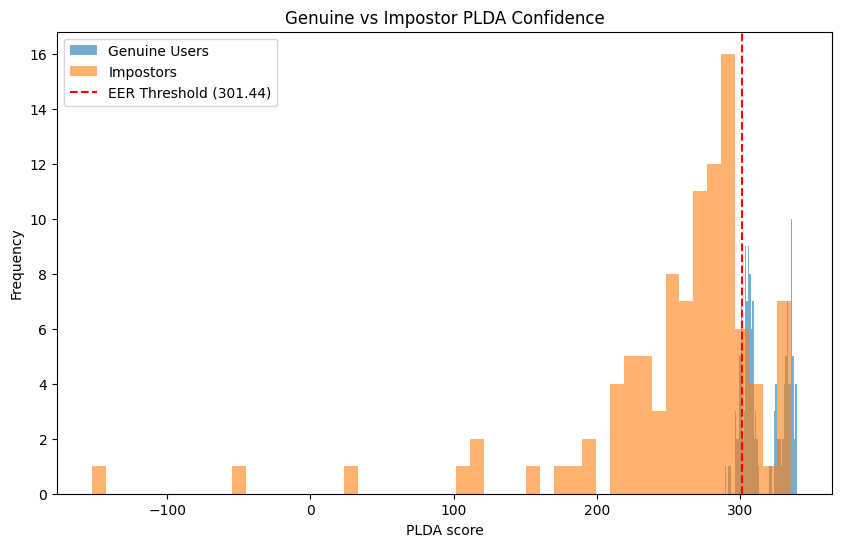

In [180]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.hist(genuine_scores, bins=50, alpha=0.6, label="Genuine Users")
plt.hist(impostor_scores, bins=50, alpha=0.6, label="Impostors")
plt.axvline(eer_threshold, color="red", linestyle="--", label=f"EER Threshold ({eer_threshold:.2f})")
plt.xlabel("PLDA score")
plt.ylabel("Frequency")
plt.title("Genuine vs Impostor PLDA Confidence")
plt.legend()
plt.show()